# Flower Detection Model

Adapted from the Coursera course: https://www.coursera.org/lecture/deep-learning-in-computer-vision/recap-image-classification-VO9K7

Other resources used:

https://review.udacity.com/#!/rubrics/1663/view

https://katba-caroline.com/wp-content/uploads/2018/11/Image-Classifier-Project.html

https://towardsdatascience.com/do-you-know-this-flower-image-classifier-using-pytorch-1d45c3a3df1c

Here, we train a resnet18 to recognize different species of flowers.  We'll be using the dataset from the University of Oxford (http://www.robots.ox.ac.uk/~vgg/data/flowers/102/index.html) of 102 flower classes.

This notebook is broken down into multiple steps:

* Load and preprocess the image dataset
* Train the image classifier on your dataset
* Use the trained classifier to predict image content

Run all cells in order on Google Colab to produce the model.

In [ ]:
#Developed for use on Google Colab, refactoring necessary for native Jupyter usage
from os.path import exists
from wheel.pep425tags import get_abbr_impl, get_impl_ver, get_abi_tag
platform = '{}{}-{}'.format(get_abbr_impl(), get_impl_ver(), get_abi_tag())
cuda_output = !ldconfig -p|grep cudart.so|sed -e 's/.*\.\([0-9]*\)\.\([0-9]*\)$/cu\1\2/'
accelerator = cuda_output[0] if exists('/dev/nvidia0') else 'cpu'
!pip3 install torch torchvision
!pip install Pillow==7.0.0

In [ ]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import matplotlib.pyplot as plt
from collections import OrderedDict
import numpy as np
import torch
from torch import nn, optim
from torchvision import datasets, transforms, models
import torchvision.transforms.functional as TF
from torch.utils.data import Subset
from PIL import Image
import json
import time
from google.colab import drive

## Load the data

We use Torchvision to load the data, mirrored by Udacity. There is a link to this on the Oxford website. The dataset is split into training and validation. For the training, we apply transformations such as random scaling, cropping, and flipping for a more robust model. This kind of generalization results in better performance of our model. Since we are using pretrained models to retrain (Resnet 18), we need to resize the images to the 224x224.

The validation dataset is used to measure our model's performance on images it has not encountered. We only resize then crop the images to the appropriate size; no flipping here.


In [ ]:
#download the dataset and labels(contains info on each img)
data_dir = 'flower_data'
train_dir = data_dir + '/train'
valid_dir = data_dir + '/valid'
#get the labels
!wget https://raw.githubusercontent.com/udacity/pytorch_challenge/master/cat_to_name.json
#get the dataset
!wget https://s3.amazonaws.com/content.udacity-data.com/courses/nd188/flower_data.zip
!unzip flower_data.zip


Streaming output truncated to the last 5000 lines.
  inflating: flower_data/train/7/image_08101.jpg  
  inflating: flower_data/train/7/image_07226.jpg  
  inflating: flower_data/train/7/image_07227.jpg  
  inflating: flower_data/train/7/image_08100.jpg  
  inflating: flower_data/train/7/image_07233.jpg  
   creating: flower_data/train/29/
  inflating: flower_data/train/29/image_04152.jpg  
  inflating: flower_data/train/29/image_04147.jpg  
  inflating: flower_data/train/29/image_04153.jpg  
  inflating: flower_data/train/29/image_04151.jpg  
  inflating: flower_data/train/29/image_04150.jpg  
  inflating: flower_data/train/29/image_04144.jpg  
  inflating: flower_data/train/29/image_04140.jpg  
  inflating: flower_data/train/29/image_04154.jpg  
  inflating: flower_data/train/29/image_04155.jpg  
  inflating: flower_data/train/29/image_04141.jpg  
  inflating: flower_data/train/29/image_04157.jpg  
  inflating: flower_data/train/29/image_04156.jpg  
  inflating: flower_data/train/29/i

In [ ]:
# Define your transforms for the training and validation sets
# Color channels of images are typically encoded as integers 0-255, but the model 
# expected floats 0-1. We subtract the means from each color channel,
# then divide by the standard deviation.

# arrays to normalization
normalize_mean = np.array([0.485, 0.456, 0.406])
normalize_std = np.array([0.229, 0.224, 0.225])

data_transforms = {}

# transforms to train data set (including random flipping rotation etc)
data_transforms['train'] = transforms.Compose([
    transforms.RandomChoice([
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomVerticalFlip(p=0.5),
        transforms.RandomRotation(180),
        ]),
    transforms.RandomResizedCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(
        normalize_mean,
        normalize_std)
    ])

# transforms to valid data set (Only cropping and resizing)
data_transforms['valid'] = transforms.Compose([
    transforms.Resize(255),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(
        normalize_mean,
        normalize_std)
    ])

# Load the datasets with ImageFolder
image_datasets = {}
image_datasets['train_data'] = datasets.ImageFolder(data_dir + '/train', transform=data_transforms['train'])
valid_dataset_to_split = datasets.ImageFolder(data_dir + '/valid', transform=data_transforms['valid'])

# obtain validation and training datasets that will be used to evaluate the network
valid_data_index_list = []
test_data_index_list = []
for index in range(0, len(valid_dataset_to_split), 2):
    valid_data_index_list.append(index)
    test_data_index_list.append(index+1)

image_datasets['valid_data'] = Subset(valid_dataset_to_split, valid_data_index_list)
image_datasets['test_data'] = Subset(valid_dataset_to_split, test_data_index_list)

# Using the image datasets and the transforms, define the dataloaders
dataloaders = {}
dataloaders['train_data'] = torch.utils.data.DataLoader(image_datasets['train_data'], batch_size=32, shuffle=True, num_workers=32)
dataloaders['valid_data'] = torch.utils.data.DataLoader(image_datasets['valid_data'], batch_size=23, shuffle=False, num_workers=32)
dataloaders['test_data'] = torch.utils.data.DataLoader(image_datasets['test_data'], batch_size=23, shuffle=False, num_workers=32)

Label file: Read into a dictionary mapping the integer encoded categories to the actual names of the flower classes

In [ ]:
with open('cat_to_name.json', 'r') as f:
    cat_to_name = json.load(f)
class_to_idx = image_datasets['train_data'].class_to_idx
cat_label_to_name = {}
for cat, label in class_to_idx.items():
    name = cat_to_name.get(cat)
    print('"' +name + '",')
    cat_label_to_name[label] = name

"pink primrose",
"globe thistle",
"blanket flower",
"trumpet creeper",
"blackberry lily",
"snapdragon",
"colt's foot",
"king protea",
"spear thistle",
"yellow iris",
"globe-flower",
"purple coneflower",
"peruvian lily",
"balloon flower",
"hard-leaved pocket orchid",
"giant white arum lily",
"fire lily",
"pincushion flower",
"fritillary",
"red ginger",
"grape hyacinth",
"corn poppy",
"prince of wales feathers",
"stemless gentian",
"artichoke",
"canterbury bells",
"sweet william",
"carnation",
"garden phlox",
"love in the mist",
"mexican aster",
"alpine sea holly",
"ruby-lipped cattleya",
"cape flower",
"great masterwort",
"siam tulip",
"sweet pea",
"lenten rose",
"barbeton daisy",
"daffodil",
"sword lily",
"poinsettia",
"bolero deep blue",
"wallflower",
"marigold",
"buttercup",
"oxeye daisy",
"english marigold",
"common dandelion",
"petunia",
"wild pansy",
"primula",
"sunflower",
"pelargonium",
"bishop of llandaff",
"gaura",
"geranium",
"orange dahlia",
"tiger lily",
"pink-yellow dahlia

In [ ]:
def imgview(img, title, ax):
    # un-normalize
    for i in range(img.shape[0]):
        img[i] = img[i] * normalize_std[i] + normalize_mean[i]
    # convert from Tensor image
    ax.imshow(np.transpose(img, (1, 2, 0)))
    ax.set_title(title)

In [ ]:
# obtain one batch of training images
dataiter = iter(dataloaders['train_data'])
images, labels = dataiter.next()

# Building and training the classifier
Build and train a new feed-forward classifier using the features of the pretrained model.
* Load a pre-trained Resnet-18
* Define a new, untrained feed-forward network as a classifier, using ReLU activations and dropout
* Train the classifier layers using backpropagation using the pre-trained network to get the features
* Track the loss and accuracy on the validation set to determine the best hyperparameters. When training we update only the weights of the feed-forward network. 

In [ ]:
# we do not want back propagation
def freeze_parameters(root, freeze=True):
    [param.requires_grad_(not freeze) for param in root.parameters()]

In [ ]:
# Create a new classifier
def create_classifier(input_size, output_size, hidden_layers=[], dropout=0.5,
                      activation=nn.RReLU(), output_function=nn.LogSoftmax(dim=1)):
    dict = OrderedDict()
    
    if len(hidden_layers) == 0:
        dict['layer0'] = nn.Linear(input_size, output_size)
    else:
        dict['layer0'] = nn.Linear(input_size, hidden_layers[0])
        if activation:
            dict['activ0'] = activation
        if dropout:
            dict['drop_0'] = nn.Dropout(dropout)
        
        #for layer_in, layer_out in range(len(hidden_layers)):
        for layer, layer_in in enumerate(zip(hidden_layers[:-1],hidden_layers[1:])):
            dict['layer'+str(layer+1)] = nn.Linear(layer_in[0],layer_in[1])
            if activation:
                dict['activ'+str(layer+1)] = activation
            if dropout:
                dict['drop_'+str(layer+1)] = nn.Dropout(dropout)
            
        dict['output'] = nn.Linear(hidden_layers[-1], output_size)
    if output_function:
        dict['output_function'] = output_function
    
    return nn.Sequential(dict)

In [ ]:
# Build and train your network
def create_network(model_name='resnet18', output_size=102, hidden_layers=[100]):
    if model_name == 'resnet18':
        # Download the model
        model = models.resnet18(pretrained=True)
        # Replace the model classifier
        model.fc = create_classifier(512, output_size, hidden_layers)
        
        return model
    else:
        return None

In [ ]:
# Use GPU if it's available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f'Running on: {str(device).upper()}')

# Define hyperparameters
model_name = 'resnet18'
output_size = 102 #num classes
hidden_layers = [100]

model = create_network(model_name, output_size, hidden_layers)

# Move model to device
model.to(device)

Running on: CUDA


Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/checkpoints/resnet18-5c106cde.pth


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
def train(epochs, model, optimizers, lr_scheduler=None,
          dataloaders=dataloaders, state_dict=None,
          checkpoint_path="checkpoint.pt", accuracy_target=None,
          show_graphs=True):

    if state_dict == None:
        state_dict = {
            'elapsed_time': 0,
            'trace_log': [],
            'trace_train_loss': [],
            'trace_train_lr': [],
            'valid_loss_min': np.Inf,
            'trace_valid_loss': [],
            'trace_accuracy': [],
            'epochs_trained': 0}
        state_dict['trace_log'].append('PHASE ONE')

    for epoch in range(1,epochs+1):
        
        try:
            lr_scheduler.step() # if instance of _LRScheduler
        except TypeError:
            try:
                if lr_scheduler.min_lrs[0] == lr_scheduler.optimizer.param_groups[0]['lr']:
                    break
                lr_scheduler.step(valid_loss) # if instance of ReduceLROnPlateau
            except NameError: # valid_loss is not defined yet
                lr_scheduler.step(np.Inf)
        except:
            pass # do nothing

        epoch_start_time = time.time()
        #TRAIN
        train_loss = 0
        model.train()
        for images, labels in dataloaders['train_data']:
            # Move tensors to device
            images, labels = images.to(device), labels.to(device)

            # Clear optimizers
            [opt.zero_grad() for opt in optimizers]

            # Pass train batch through model feed-forward
            output = model(images)

            # Calculate loss for this train batch
            batch_loss = criterion(output, labels)
            # Do the backpropagation
            batch_loss.backward()

            # Optimize parameters
            [opt.step() for opt in optimizers]

            # Track train loss
            train_loss += batch_loss.item()*len(images)

        # Track how many epochs has already run
        state_dict['elapsed_time'] += time.time()-epoch_start_time
        state_dict['epochs_trained'] += 1

        #VALIDATE
        valid_loss = 0
        accuracy = 0
        top_class_graph = []
        labels_graph = []
        # Set model to evaluation mode
        model.eval()
        with torch.no_grad():
            for images, labels in dataloaders['valid_data']:
                labels_graph.extend( labels )

                # Move tensors to device
                images, labels = images.to(device), labels.to(device)

                # Get predictions for this validation batch
                output = model(images)

                # Calculate loss for this validation batch
                batch_loss = criterion(output, labels)
                # Track validation loss
                valid_loss += batch_loss.item()*len(images)

                # Calculate accuracy
                output = torch.exp(output)
                top_ps, top_class = output.topk(1, dim=1)
                top_class_graph.extend( top_class.view(-1).to('cpu').numpy() )
                equals = top_class == labels.view(*top_class.shape)
                accuracy += torch.mean(equals.type(torch.FloatTensor)).item()*len(images)

        # calculate average losses
        train_loss = train_loss/len(dataloaders['train_data'].dataset)
        valid_loss = valid_loss/len(dataloaders['valid_data'].dataset)
        accuracy = accuracy/len(dataloaders['valid_data'].dataset)

        state_dict['trace_train_loss'].append(train_loss)
        try:
            state_dict['trace_train_lr'].append(lr_scheduler.get_lr()[0])
        except:
            state_dict['trace_train_lr'].append(
                optimizers[0].state_dict()['param_groups'][0]['lr'])
        state_dict['trace_valid_loss'].append(valid_loss)
        state_dict['trace_accuracy'].append(accuracy)

        # print training/validation statistics 
        log = 'Epoch: {}: \
               lr: {:.8f}\t\
               Training Loss: {:.6f}\t\
               Validation Loss: {:.6f}\t\
               Validation accuracy: {:.2f}%\t\
               Elapsed time: {:.2f}'.format(
                    state_dict['epochs_trained'],
                    state_dict['trace_train_lr'][-1],
                    train_loss,
                    valid_loss,
                    accuracy*100,
                    state_dict['elapsed_time']
                    )
        state_dict['trace_log'].append(log)
        print(log)

        # save model if validation loss has decreased
        if valid_loss <= state_dict['valid_loss_min']:
            print('Validation loss decreased: \
                  ({:.6f} --> {:.6f}).   Saving model ...'
                  .format(state_dict['valid_loss_min'],valid_loss))

            checkpoint = {'model_state_dict': model.state_dict(),
                          'optimizer_state_dict': optimizers[0].state_dict(),
                          'training_state_dict': state_dict}
            if lr_scheduler:
                checkpoint['lr_scheduler_state_dict'] = lr_scheduler.state_dict()

            torch.save(checkpoint, checkpoint_path)
            state_dict['valid_loss_min'] = valid_loss

        if show_graphs:
            plt.figure(figsize=(25,8))
            plt.plot(np.array(labels_graph), 'k.')
            plt.plot(np.array(top_class_graph), 'r.')
            plt.show()
            plt.figure(figsize=(25,5))
            plt.subplot(1,2,1)
            plt.plot(np.array(state_dict['trace_train_loss']), 'b', label='train loss')
            plt.plot(np.array(state_dict['trace_valid_loss']), 'r', label='validation loss')
            plt.plot(np.array(state_dict['trace_accuracy']), 'g', label='accuracy')
            plt.subplot(1,2,2)
            plt.plot(np.array(state_dict['trace_train_lr']), 'b', label='train loss')
            plt.show()

        # stop training loop if accuracy_target has been reached
        if accuracy_target and state_dict['trace_accuracy'][-1] >= accuracy_target:
            break

    return state_dict

In [ ]:
def test_model(dataloader=dataloaders['test_data'], show_graphs=True):
    criterion = nn.NLLLoss()
    test_loss = 0
    accuracy = 0
    top_class_graph = []
    labels_graph = []
    # Set model to evaluation mode
    model.eval()
    with torch.no_grad():
        for images, labels in dataloader:
            labels_graph.extend( labels )

            # Move tensors to device
            images, labels = images.to(device), labels.to(device)

            # Get predictions for this test batch
            output = model(images)

            # Calculate loss for this test batch
            batch_loss = criterion(output, labels)
            # Track validation loss
            test_loss += batch_loss.item()*len(images)

            # Calculate accuracy
            output = torch.exp(output)
            top_ps, top_class = output.topk(1, dim=1)
            top_class_graph.extend( top_class.view(-1).to('cpu').numpy() )
            equals = top_class == labels.view(*top_class.shape)
            accuracy += torch.sum(equals.type(torch.FloatTensor)).item()

    # calculate average losses
    test_loss = test_loss/len(dataloader.dataset)
    accuracy = accuracy/len(dataloader.dataset)

    # print training/validation statistics 
    log = f'Test Loss: {test_loss:.6f}\t\
           Test accuracy: {(accuracy*100):.2f}%'
    print(log)

    if show_graphs:
        plt.figure(figsize=(25,13))
        plt.plot(np.array(labels_graph), 'k.')
        plt.plot(np.array(top_class_graph), 'r.')
        plt.show()

In [ ]:
def load_model(checkpoint_path, state_dict):
    try:
        checkpoint = torch.load(checkpoint_path)
        state_dict = checkpoint['training_state_dict']
        model.load_state_dict(checkpoint['model_state_dict'])
        fc_optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    except:
        pass

    return state_dict

Epoch: 1:                lr: 0.01000000	               Training Loss: 3.614729	               Validation Loss: 2.137225	               Validation accuracy: 56.48%	               Elapsed time: 47.65
Validation loss decreased:                   (inf --> 2.137225).   Saving model ...


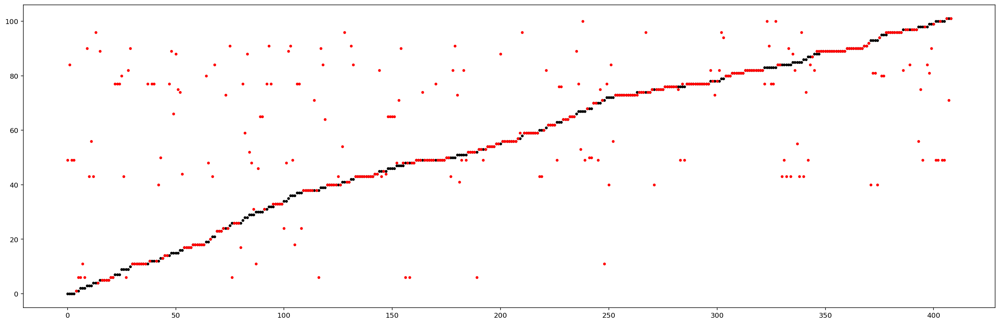

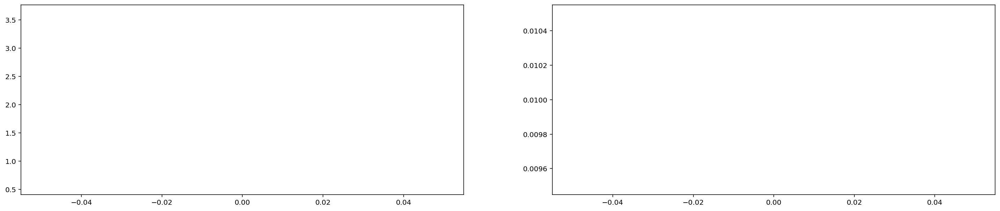

Epoch: 2:                lr: 0.01000000	               Training Loss: 2.447174	               Validation Loss: 1.434442	               Validation accuracy: 73.11%	               Elapsed time: 94.58
Validation loss decreased:                   (2.137225 --> 1.434442).   Saving model ...


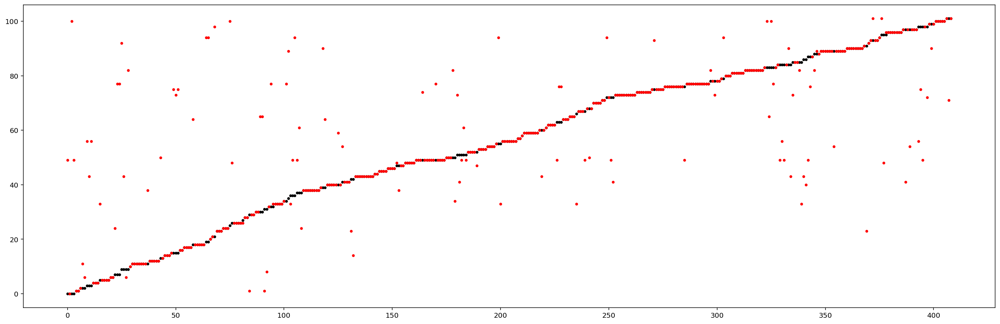

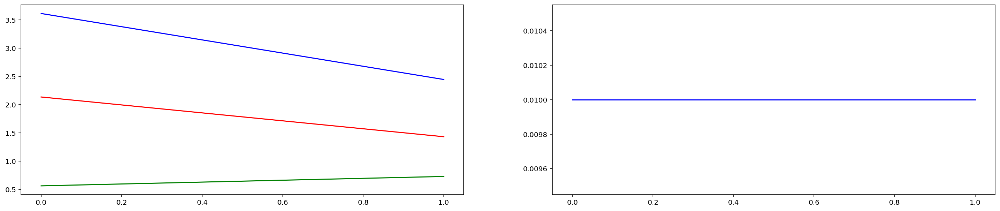

Epoch: 3:                lr: 0.01000000	               Training Loss: 2.071115	               Validation Loss: 1.112570	               Validation accuracy: 78.73%	               Elapsed time: 141.66
Validation loss decreased:                   (1.434442 --> 1.112570).   Saving model ...


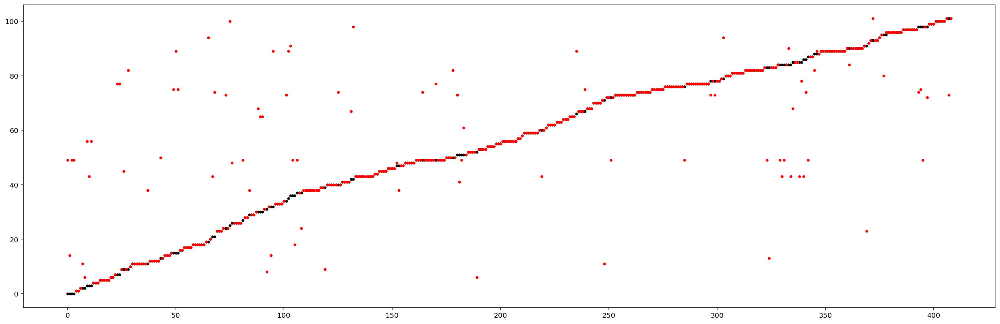

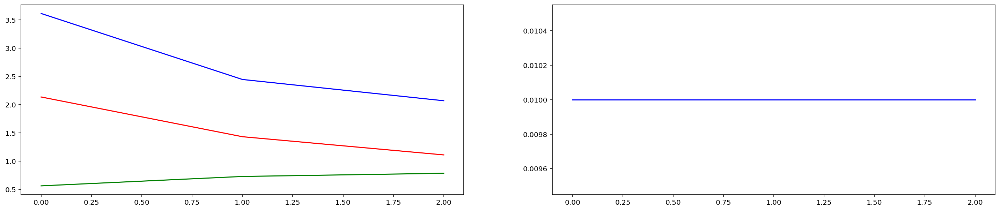

Epoch: 4:                lr: 0.01000000	               Training Loss: 1.822663	               Validation Loss: 0.954107	               Validation accuracy: 80.44%	               Elapsed time: 188.79
Validation loss decreased:                   (1.112570 --> 0.954107).   Saving model ...


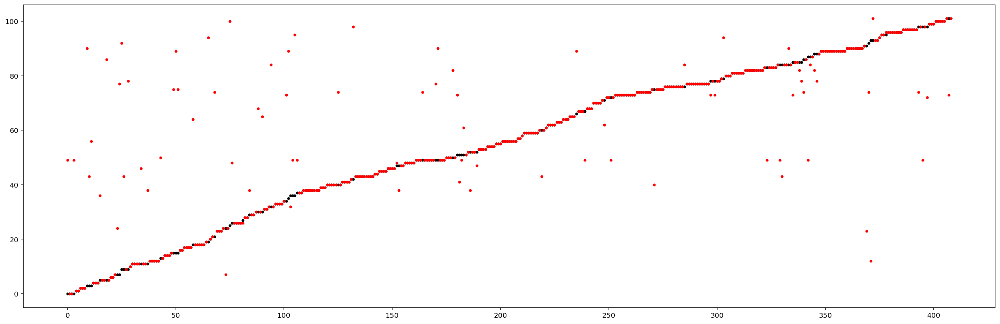

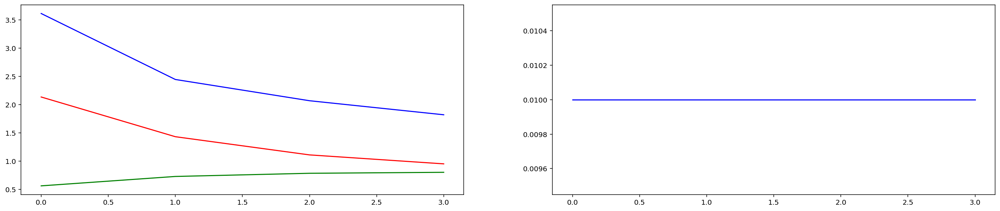

Epoch: 5:                lr: 0.01000000	               Training Loss: 1.730853	               Validation Loss: 0.888602	               Validation accuracy: 81.91%	               Elapsed time: 237.72
Validation loss decreased:                   (0.954107 --> 0.888602).   Saving model ...


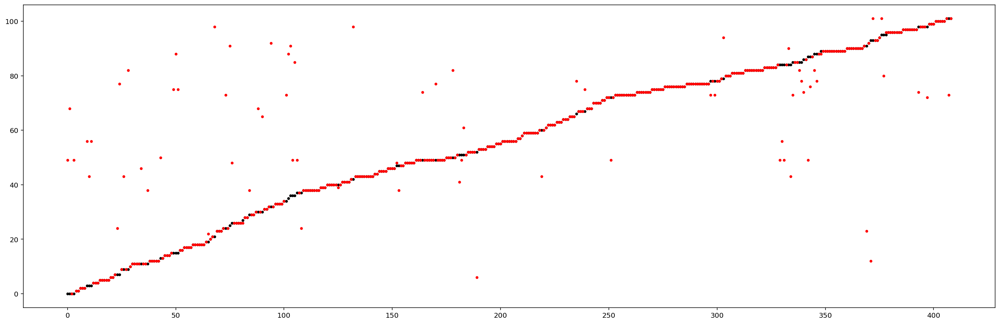

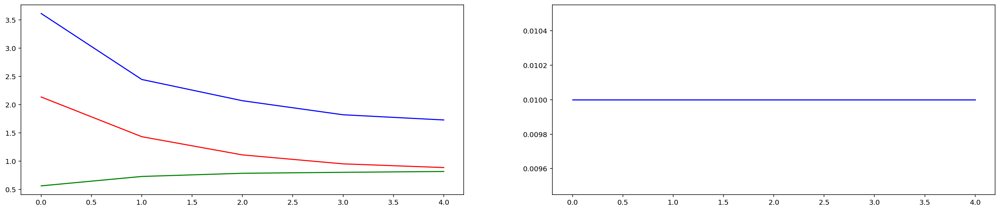

Epoch: 6:                lr: 0.01000000	               Training Loss: 1.616133	               Validation Loss: 0.794835	               Validation accuracy: 85.33%	               Elapsed time: 285.19
Validation loss decreased:                   (0.888602 --> 0.794835).   Saving model ...


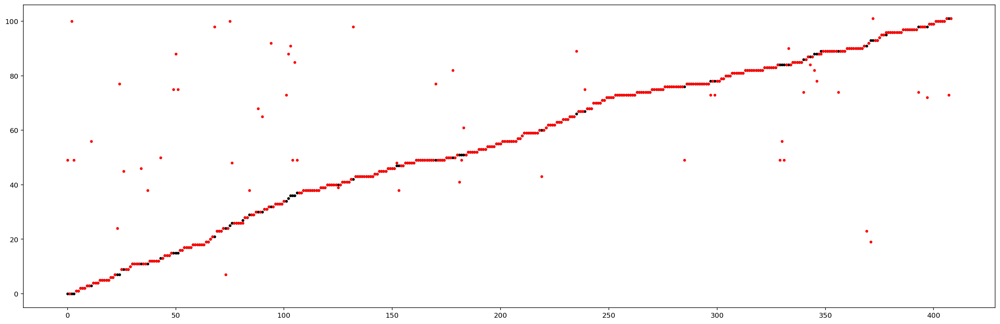

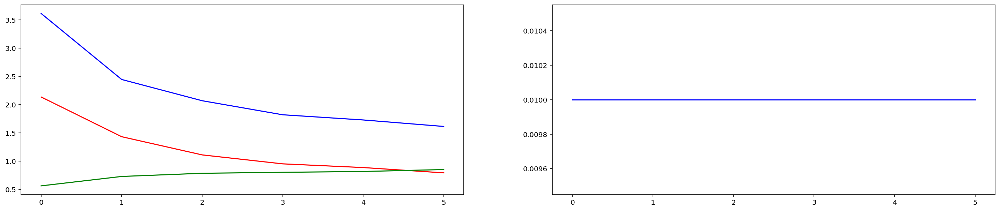

Epoch: 7:                lr: 0.01000000	               Training Loss: 1.537484	               Validation Loss: 0.749696	               Validation accuracy: 85.09%	               Elapsed time: 332.74
Validation loss decreased:                   (0.794835 --> 0.749696).   Saving model ...


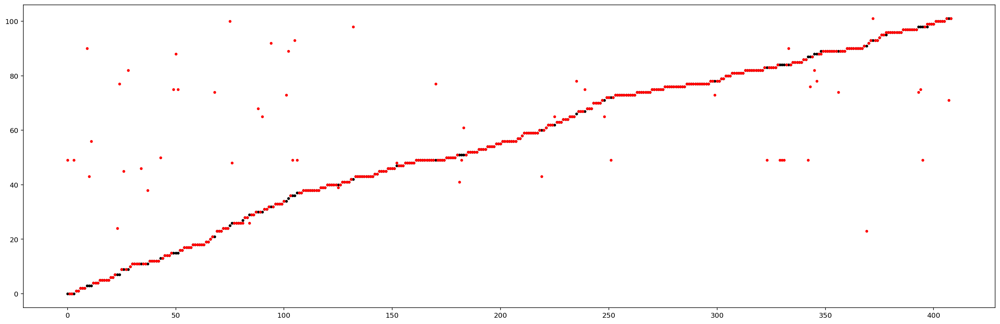

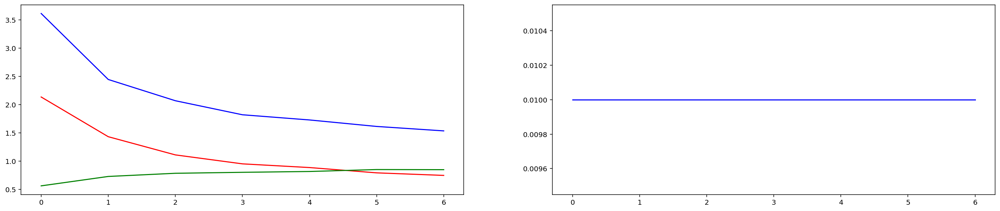

Epoch: 8:                lr: 0.01000000	               Training Loss: 1.501797	               Validation Loss: 0.680813	               Validation accuracy: 88.51%	               Elapsed time: 380.01
Validation loss decreased:                   (0.749696 --> 0.680813).   Saving model ...


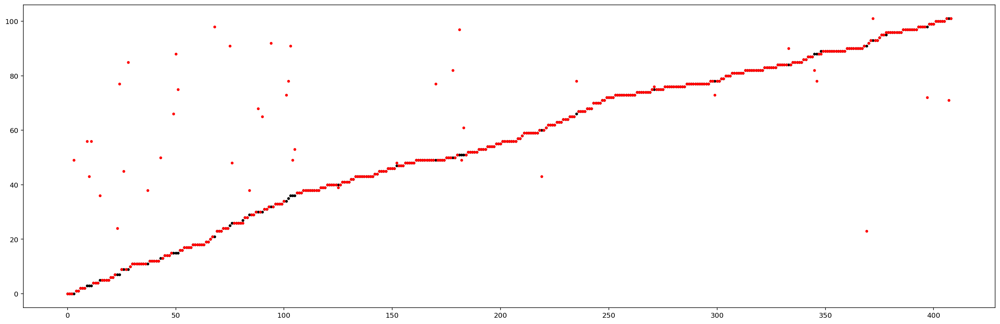

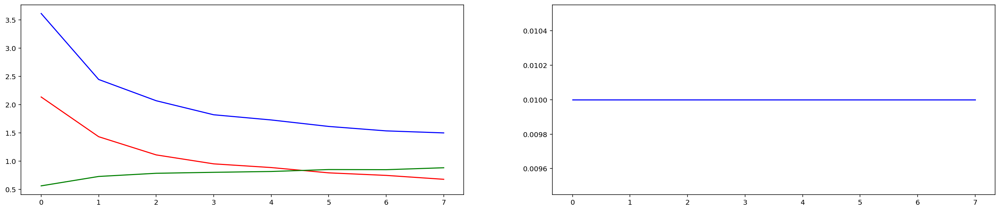

Epoch: 9:                lr: 0.01000000	               Training Loss: 1.410299	               Validation Loss: 0.632209	               Validation accuracy: 88.75%	               Elapsed time: 427.54
Validation loss decreased:                   (0.680813 --> 0.632209).   Saving model ...


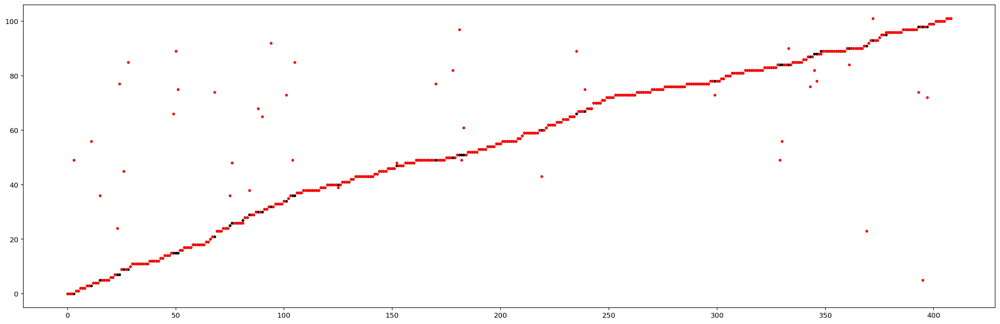

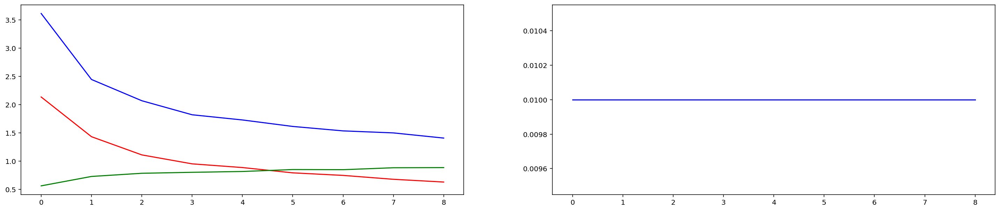

Epoch: 10:                lr: 0.01000000	               Training Loss: 1.396024	               Validation Loss: 0.625789	               Validation accuracy: 88.26%	               Elapsed time: 474.48
Validation loss decreased:                   (0.632209 --> 0.625789).   Saving model ...


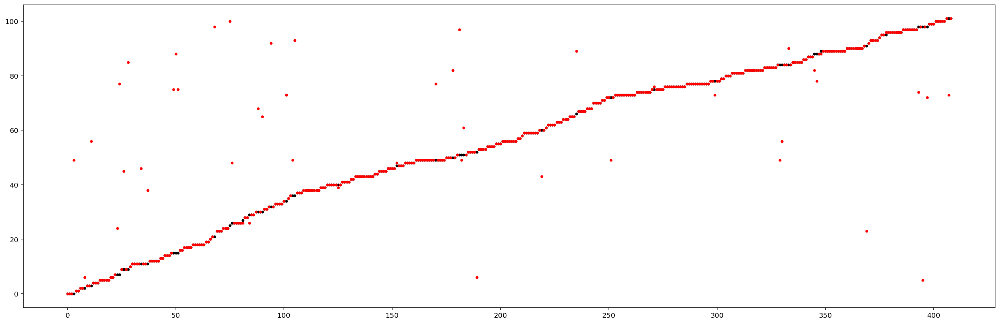

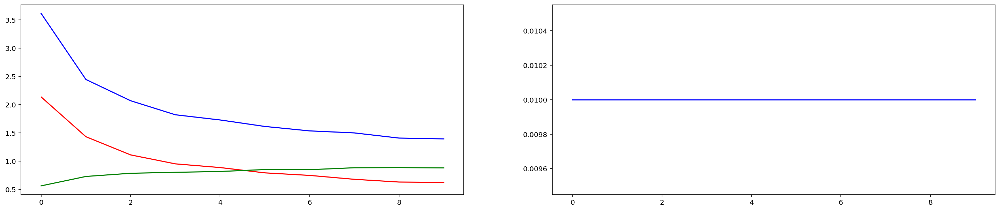

Epoch: 11:                lr: 0.01000000	               Training Loss: 1.362623	               Validation Loss: 0.601192	               Validation accuracy: 87.78%	               Elapsed time: 521.64
Validation loss decreased:                   (0.625789 --> 0.601192).   Saving model ...


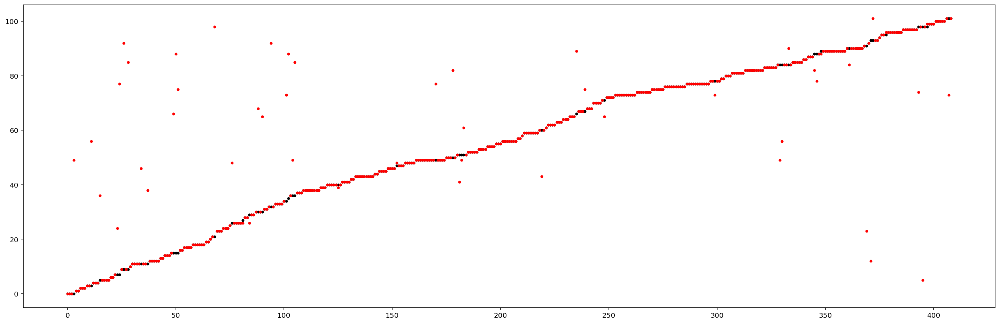

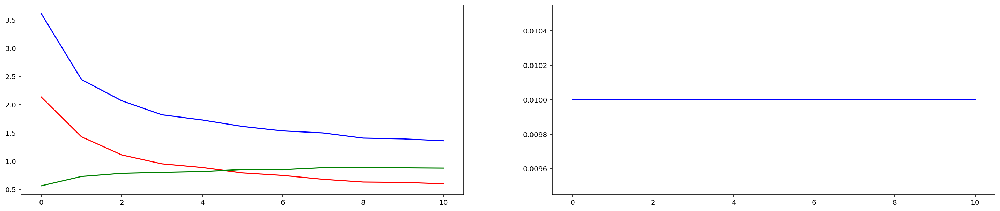

Epoch: 12:                lr: 0.01000000	               Training Loss: 1.325260	               Validation Loss: 0.580355	               Validation accuracy: 88.51%	               Elapsed time: 569.43
Validation loss decreased:                   (0.601192 --> 0.580355).   Saving model ...


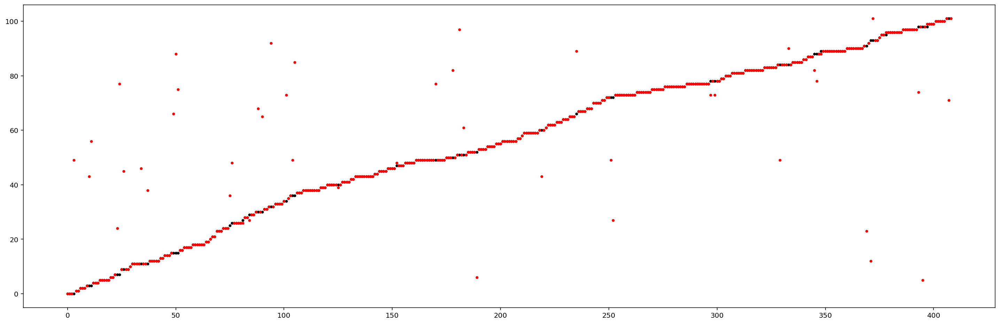

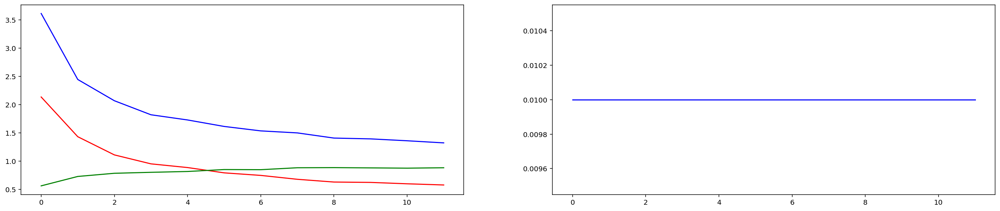

Epoch: 13:                lr: 0.01000000	               Training Loss: 1.288864	               Validation Loss: 0.568150	               Validation accuracy: 89.00%	               Elapsed time: 616.63
Validation loss decreased:                   (0.580355 --> 0.568150).   Saving model ...


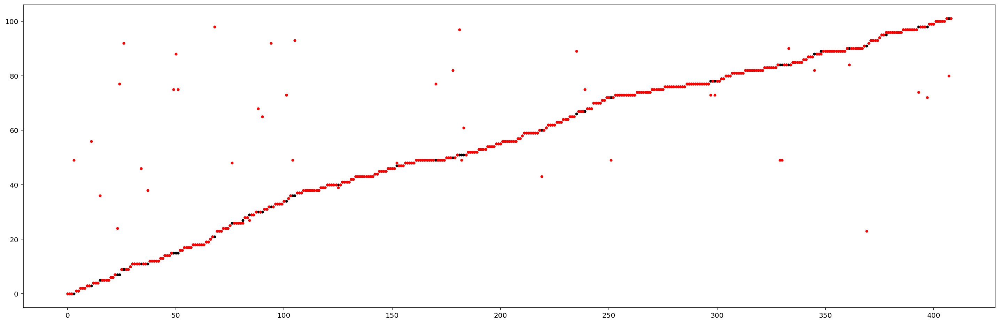

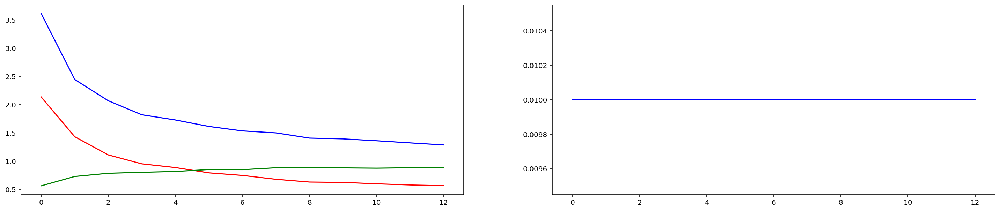

Epoch: 14:                lr: 0.01000000	               Training Loss: 1.282200	               Validation Loss: 0.545439	               Validation accuracy: 88.51%	               Elapsed time: 663.81
Validation loss decreased:                   (0.568150 --> 0.545439).   Saving model ...


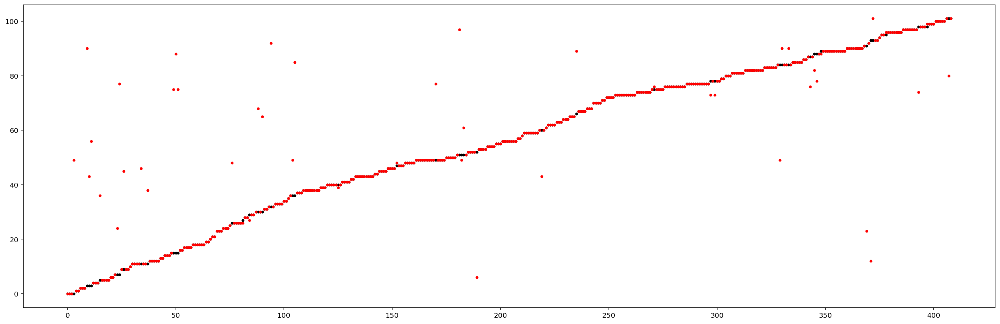

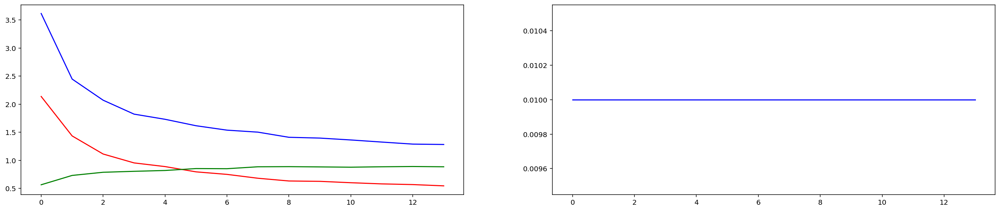

Epoch: 15:                lr: 0.01000000	               Training Loss: 1.257660	               Validation Loss: 0.528455	               Validation accuracy: 89.98%	               Elapsed time: 711.15
Validation loss decreased:                   (0.545439 --> 0.528455).   Saving model ...


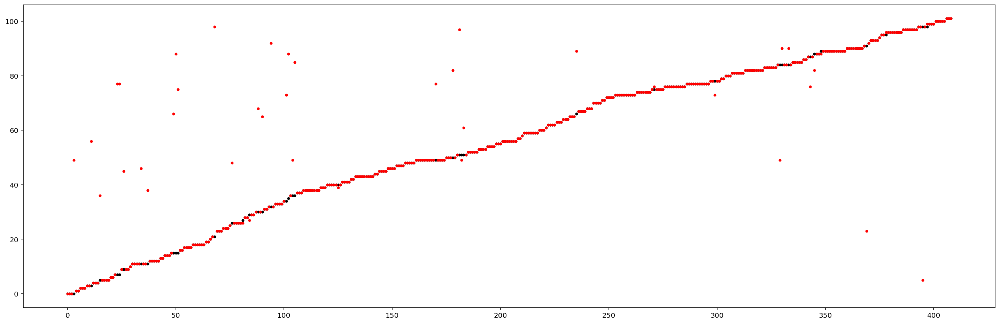

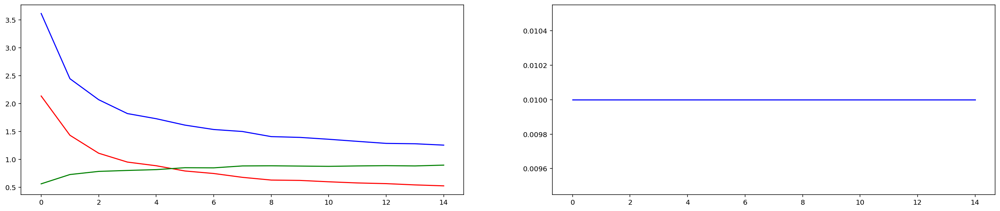

Epoch: 16:                lr: 0.01000000	               Training Loss: 1.243409	               Validation Loss: 0.516569	               Validation accuracy: 90.22%	               Elapsed time: 758.24
Validation loss decreased:                   (0.528455 --> 0.516569).   Saving model ...


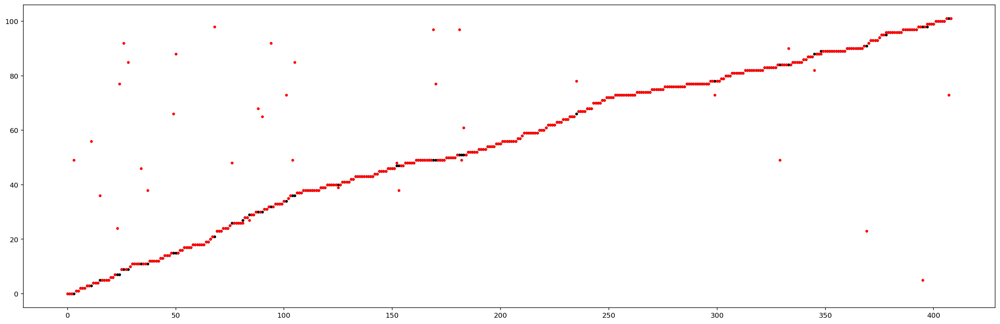

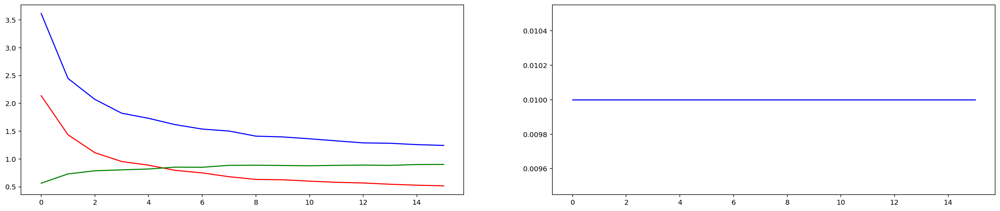

Epoch: 17:                lr: 0.01000000	               Training Loss: 1.224010	               Validation Loss: 0.507408	               Validation accuracy: 89.73%	               Elapsed time: 805.84
Validation loss decreased:                   (0.516569 --> 0.507408).   Saving model ...


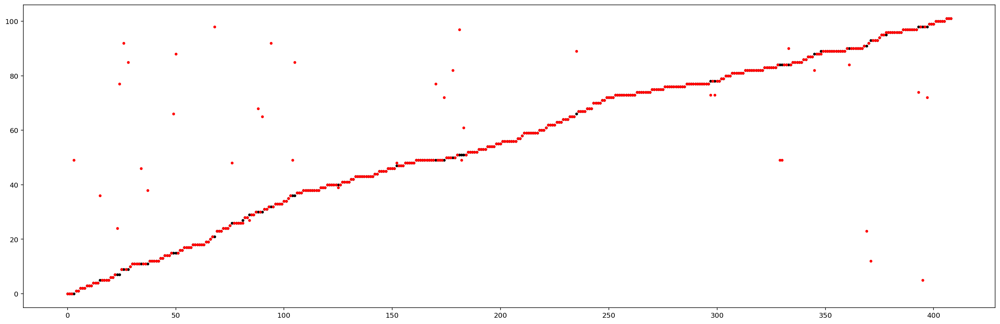

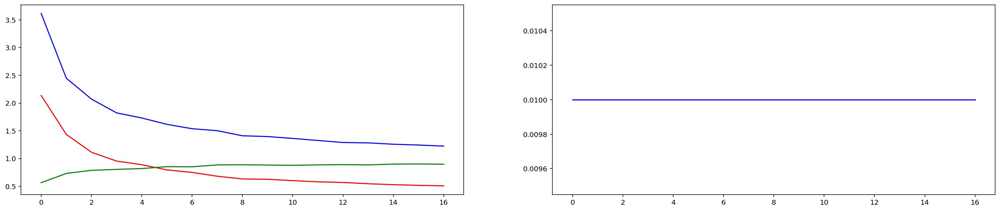

Epoch: 18:                lr: 0.01000000	               Training Loss: 1.214164	               Validation Loss: 0.500426	               Validation accuracy: 90.71%	               Elapsed time: 853.29
Validation loss decreased:                   (0.507408 --> 0.500426).   Saving model ...


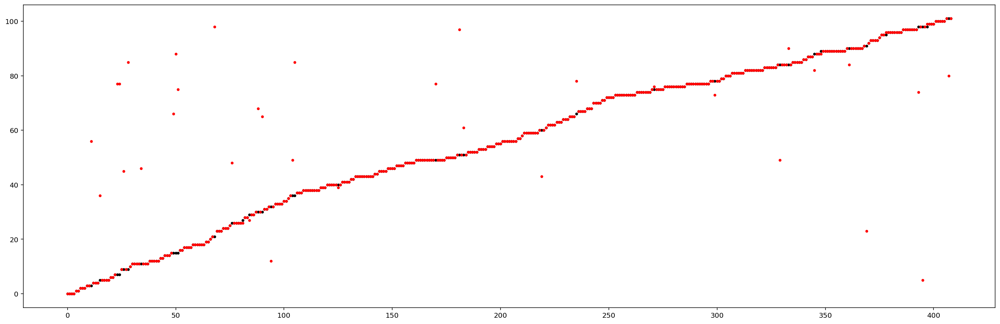

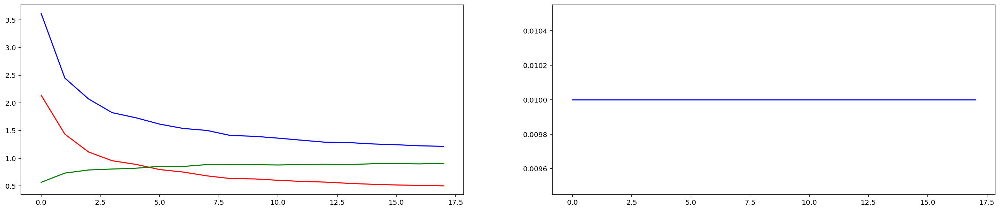

Epoch: 19:                lr: 0.01000000	               Training Loss: 1.207398	               Validation Loss: 0.484435	               Validation accuracy: 90.71%	               Elapsed time: 900.59
Validation loss decreased:                   (0.500426 --> 0.484435).   Saving model ...


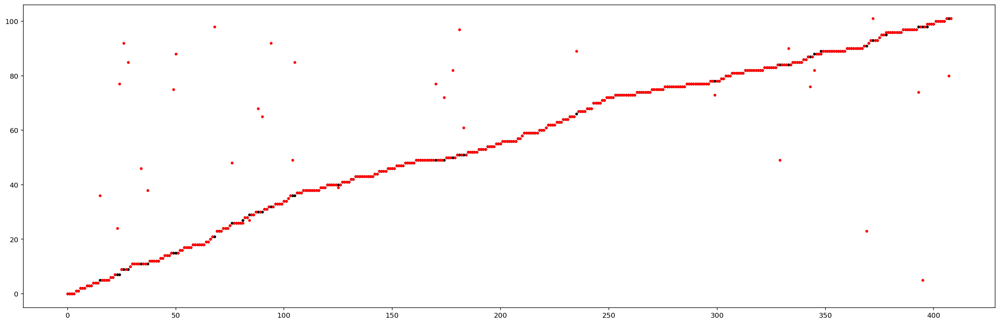

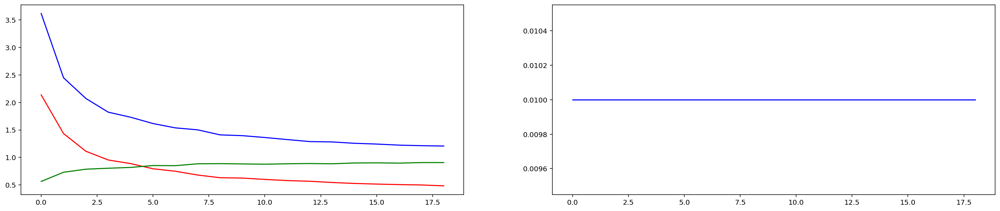

Epoch: 20:                lr: 0.01000000	               Training Loss: 1.185433	               Validation Loss: 0.480896	               Validation accuracy: 90.71%	               Elapsed time: 947.84
Validation loss decreased:                   (0.484435 --> 0.480896).   Saving model ...


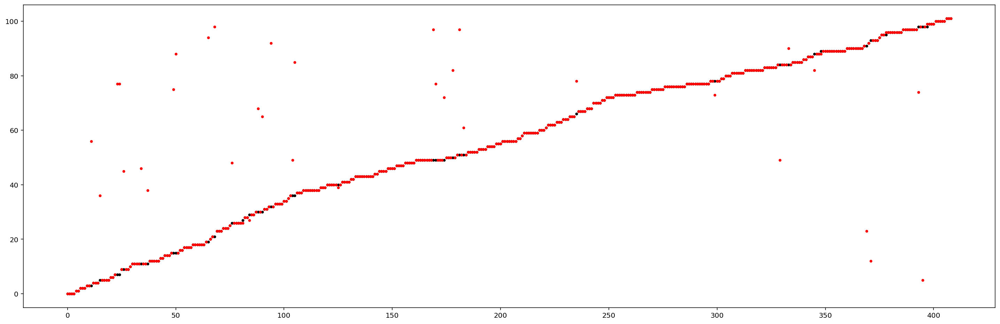

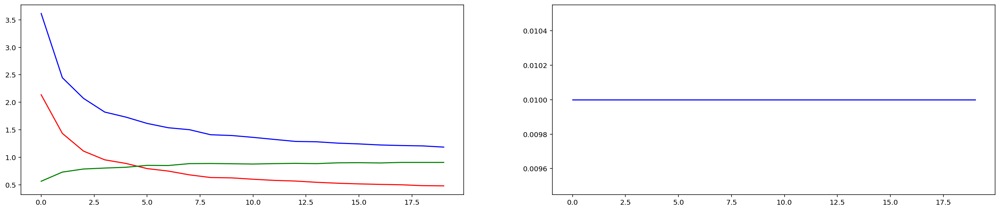

Epoch: 21:                lr: 0.01000000	               Training Loss: 1.147862	               Validation Loss: 0.466260	               Validation accuracy: 90.95%	               Elapsed time: 995.03
Validation loss decreased:                   (0.480896 --> 0.466260).   Saving model ...


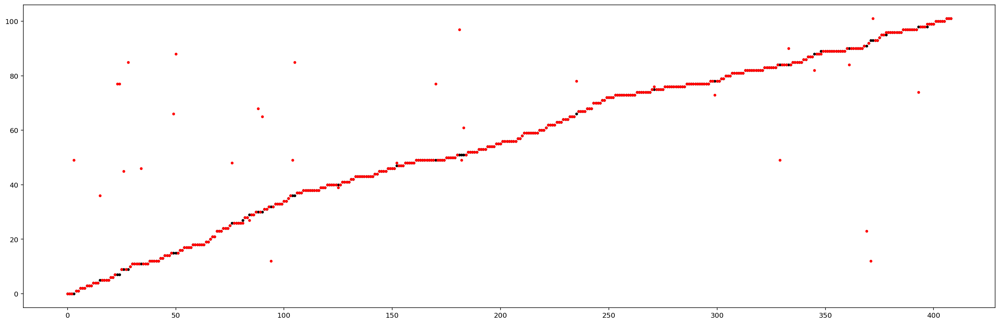

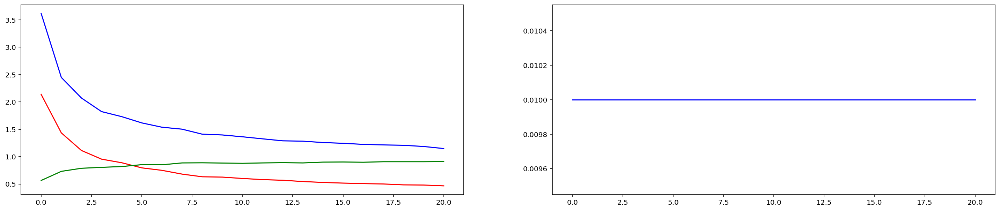

Epoch: 22:                lr: 0.01000000	               Training Loss: 1.123347	               Validation Loss: 0.458081	               Validation accuracy: 90.95%	               Elapsed time: 1042.72
Validation loss decreased:                   (0.466260 --> 0.458081).   Saving model ...


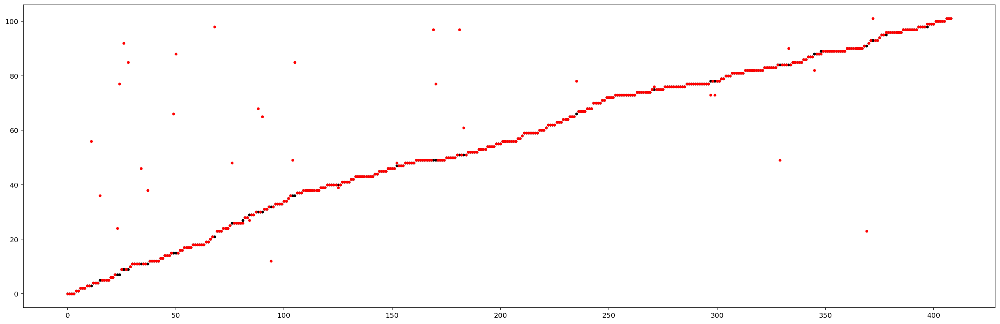

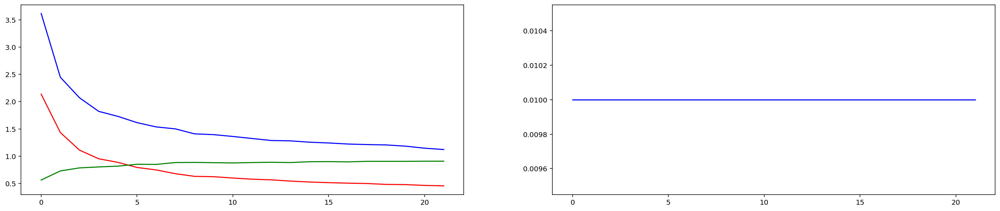

Epoch: 23:                lr: 0.01000000	               Training Loss: 1.136305	               Validation Loss: 0.464983	               Validation accuracy: 90.95%	               Elapsed time: 1089.72


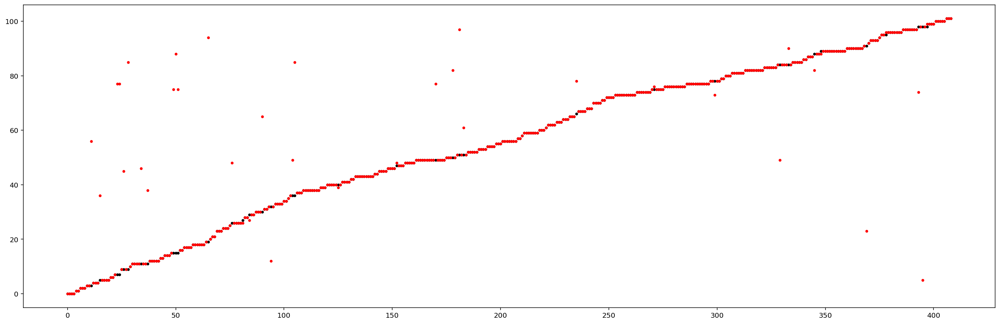

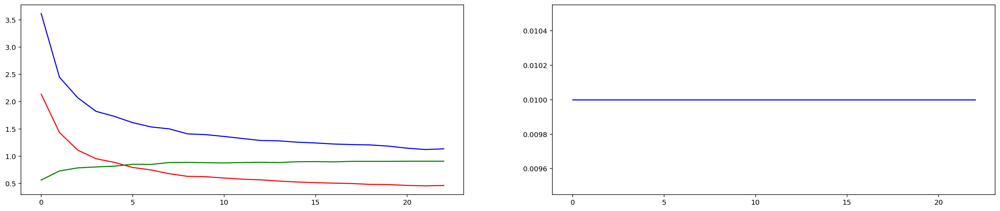

Epoch: 24:                lr: 0.01000000	               Training Loss: 1.127695	               Validation Loss: 0.456326	               Validation accuracy: 91.69%	               Elapsed time: 1136.76
Validation loss decreased:                   (0.458081 --> 0.456326).   Saving model ...


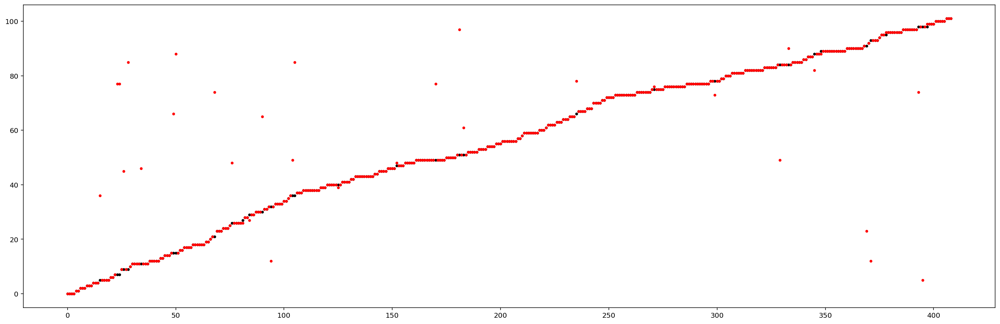

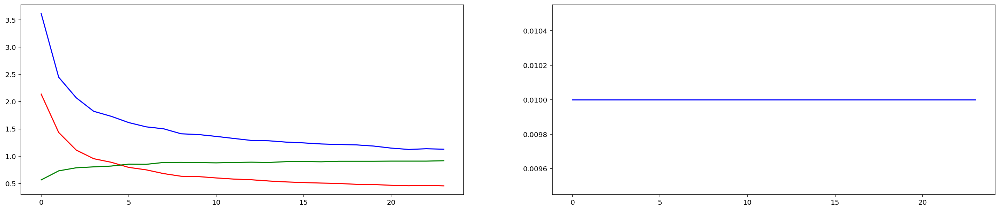

Epoch: 25:                lr: 0.01000000	               Training Loss: 1.116184	               Validation Loss: 0.458305	               Validation accuracy: 91.44%	               Elapsed time: 1183.72


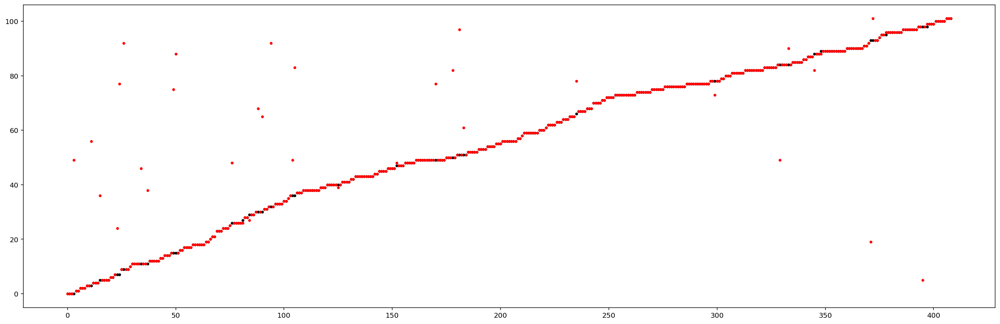

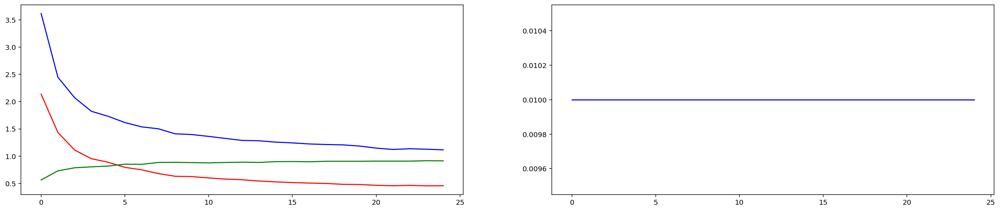

Epoch: 26:                lr: 0.01000000	               Training Loss: 1.136146	               Validation Loss: 0.447322	               Validation accuracy: 91.69%	               Elapsed time: 1232.80
Validation loss decreased:                   (0.456326 --> 0.447322).   Saving model ...


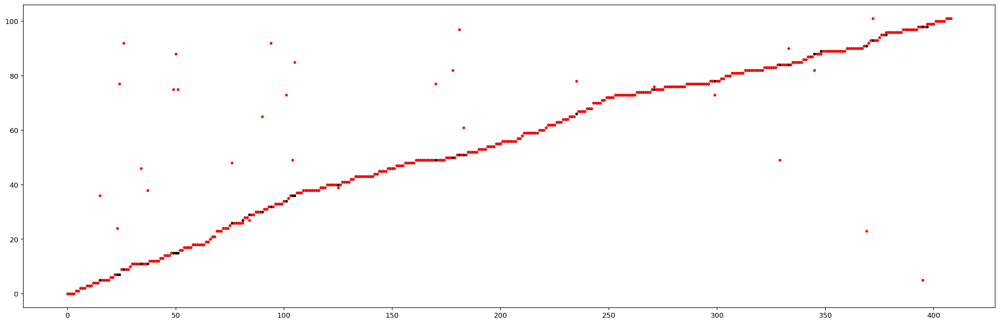

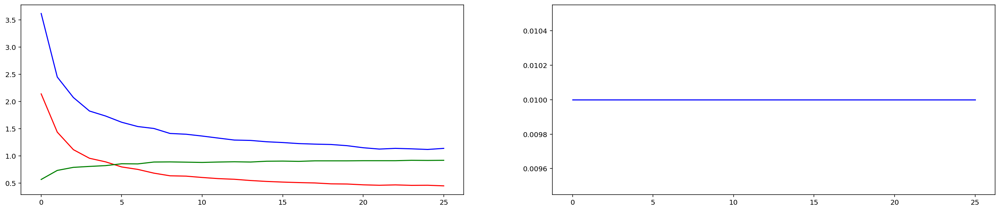

Epoch: 27:                lr: 0.01000000	               Training Loss: 1.110171	               Validation Loss: 0.433718	               Validation accuracy: 91.69%	               Elapsed time: 1279.70
Validation loss decreased:                   (0.447322 --> 0.433718).   Saving model ...


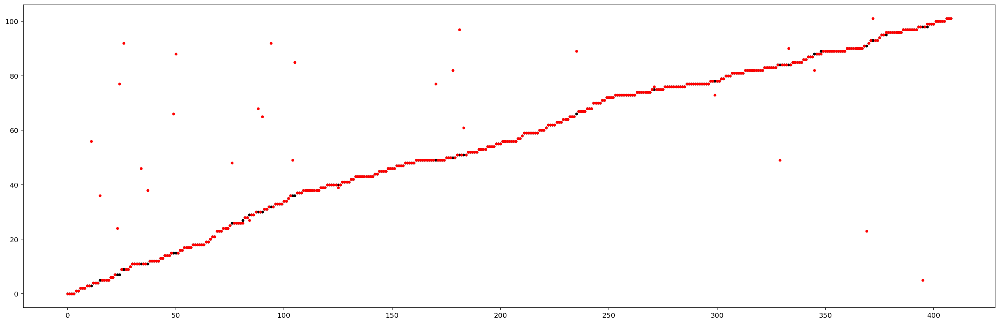

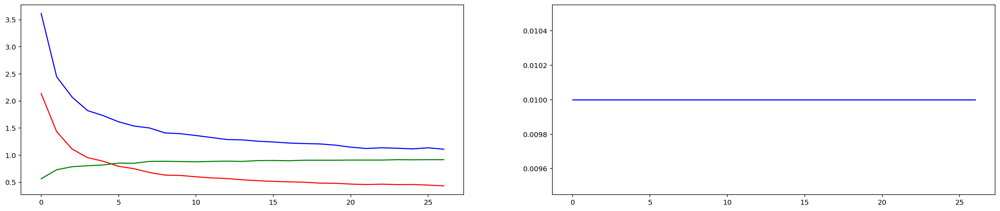

Epoch: 28:                lr: 0.01000000	               Training Loss: 1.100168	               Validation Loss: 0.438214	               Validation accuracy: 91.69%	               Elapsed time: 1327.22


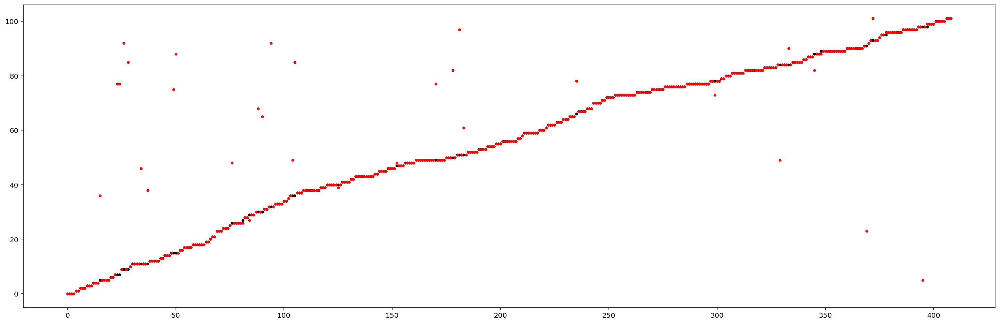

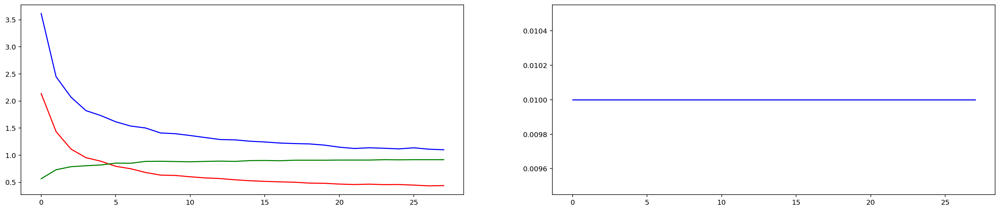

Epoch: 29:                lr: 0.01000000	               Training Loss: 1.103278	               Validation Loss: 0.426485	               Validation accuracy: 92.42%	               Elapsed time: 1374.22
Validation loss decreased:                   (0.433718 --> 0.426485).   Saving model ...


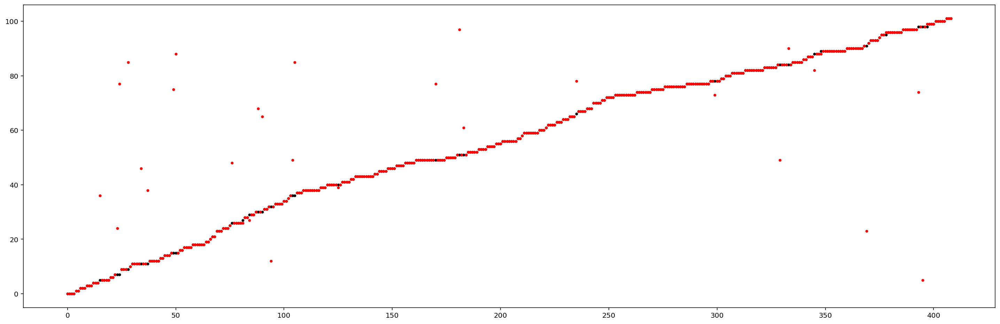

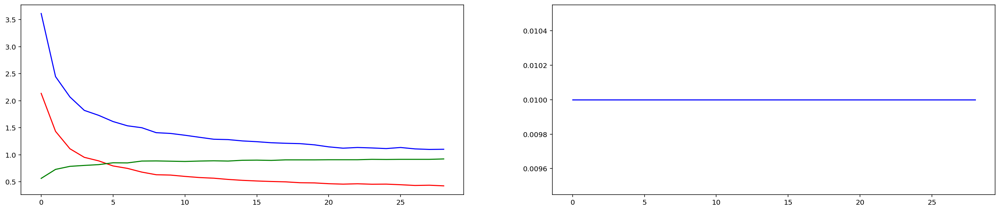

Epoch: 30:                lr: 0.01000000	               Training Loss: 1.050064	               Validation Loss: 0.434224	               Validation accuracy: 92.18%	               Elapsed time: 1421.66


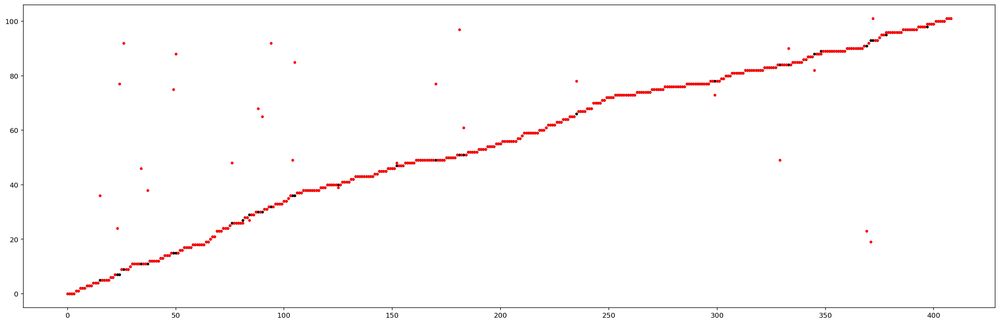

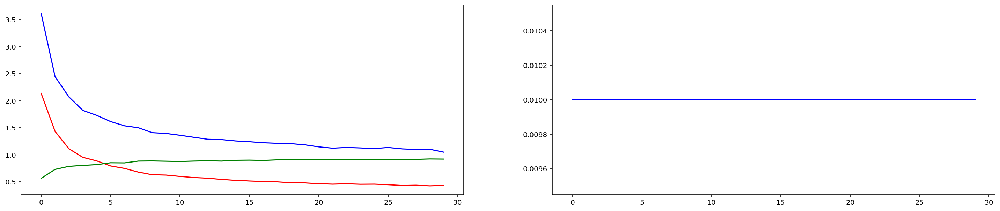

Epoch: 31:                lr: 0.01000000	               Training Loss: 1.080288	               Validation Loss: 0.418580	               Validation accuracy: 92.18%	               Elapsed time: 1468.82
Validation loss decreased:                   (0.426485 --> 0.418580).   Saving model ...


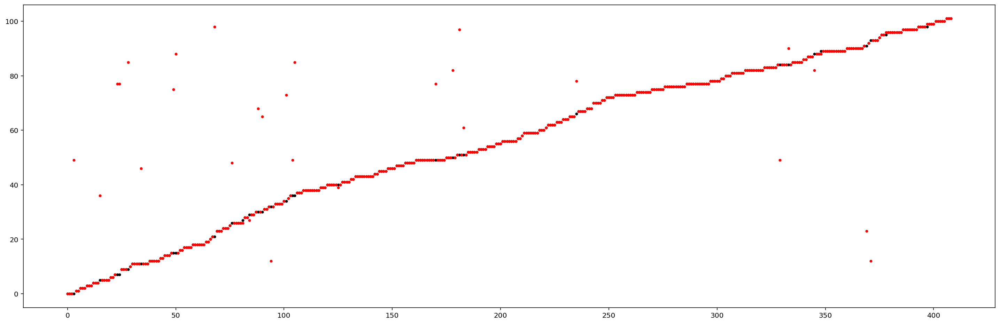

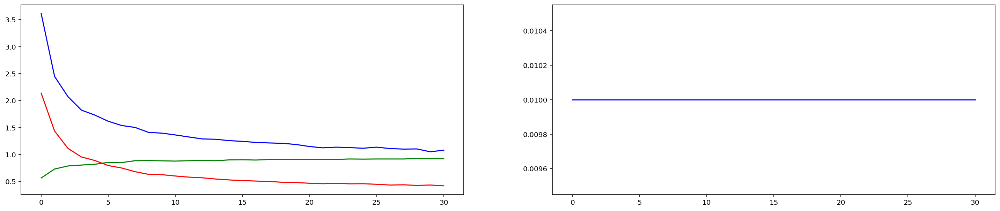

Epoch: 32:                lr: 0.01000000	               Training Loss: 1.094020	               Validation Loss: 0.426005	               Validation accuracy: 91.93%	               Elapsed time: 1516.64


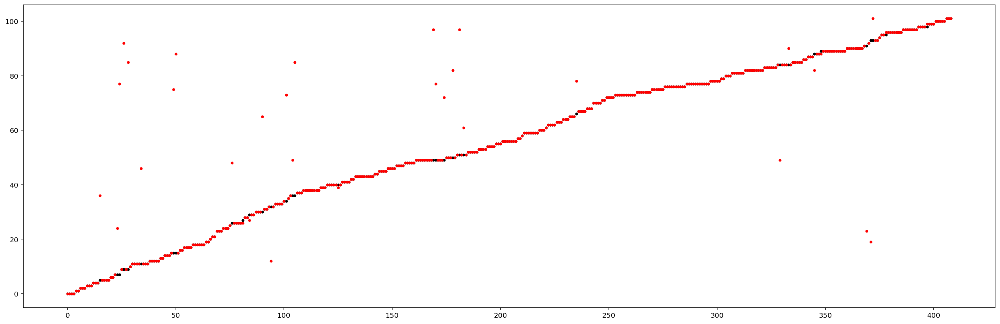

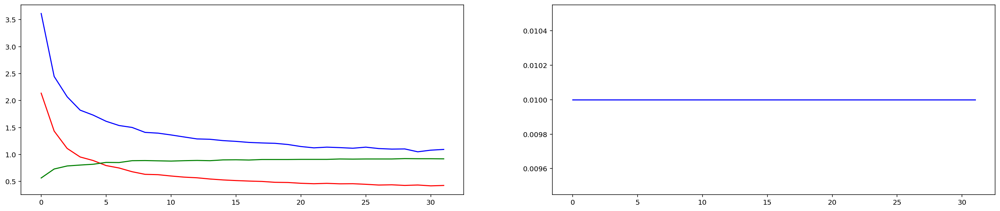

Epoch: 33:                lr: 0.01000000	               Training Loss: 1.070041	               Validation Loss: 0.415219	               Validation accuracy: 92.42%	               Elapsed time: 1564.50
Validation loss decreased:                   (0.418580 --> 0.415219).   Saving model ...


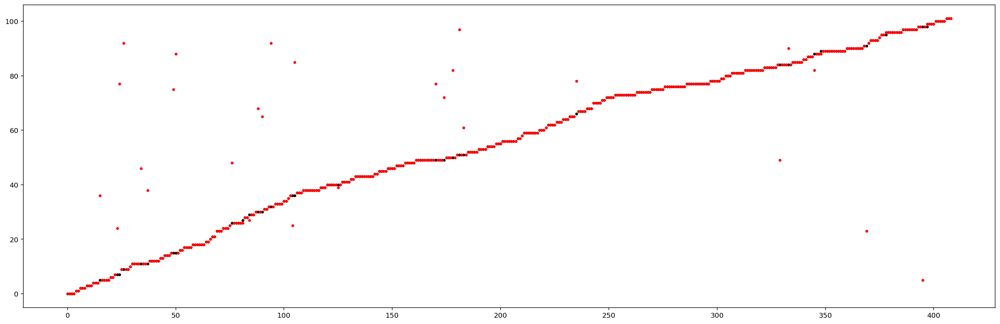

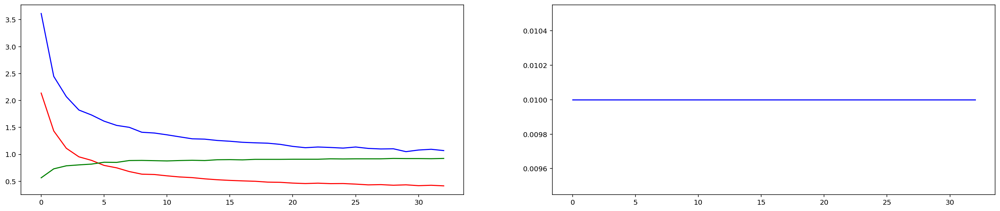

Epoch: 34:                lr: 0.01000000	               Training Loss: 1.076735	               Validation Loss: 0.409074	               Validation accuracy: 91.93%	               Elapsed time: 1611.71
Validation loss decreased:                   (0.415219 --> 0.409074).   Saving model ...


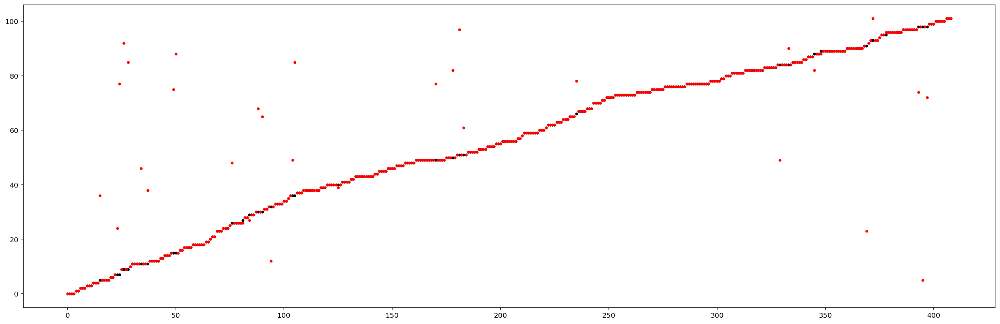

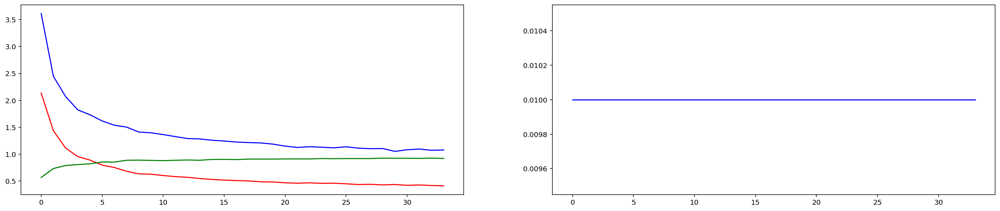

Epoch: 35:                lr: 0.01000000	               Training Loss: 1.060126	               Validation Loss: 0.417382	               Validation accuracy: 92.18%	               Elapsed time: 1658.98


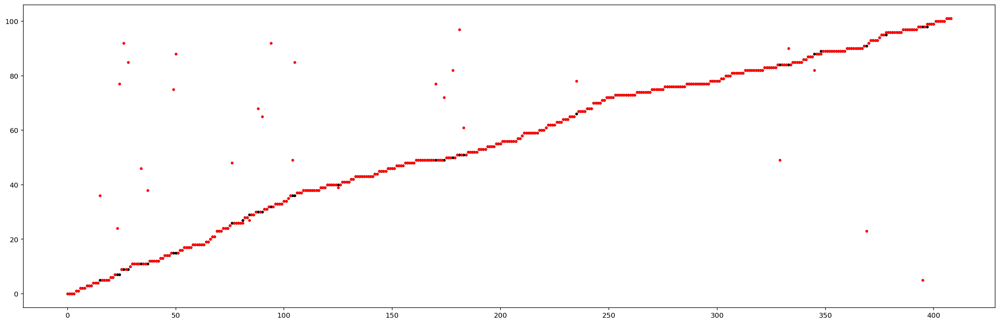

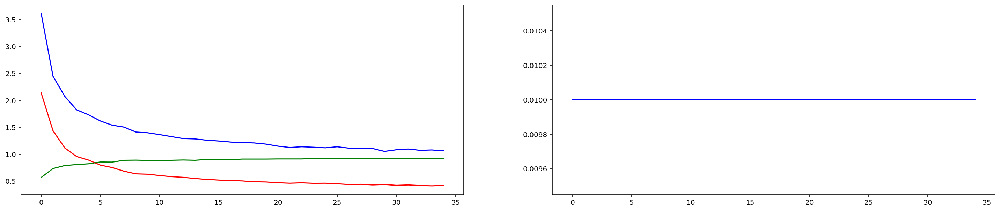

Epoch: 36:                lr: 0.01000000	               Training Loss: 1.055216	               Validation Loss: 0.420379	               Validation accuracy: 92.67%	               Elapsed time: 1706.29


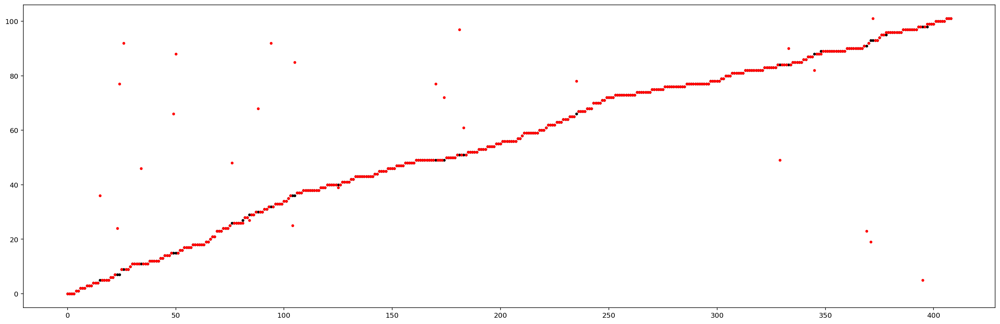

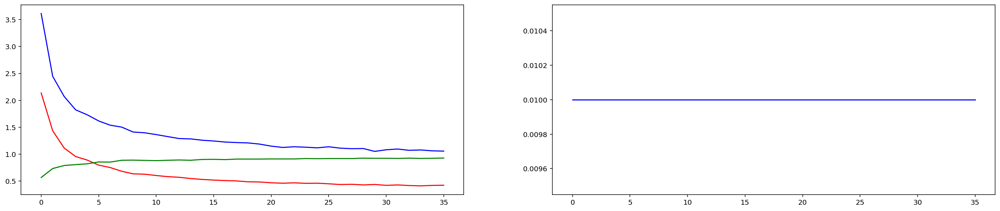

Epoch: 37:                lr: 0.01000000	               Training Loss: 1.066329	               Validation Loss: 0.406558	               Validation accuracy: 93.15%	               Elapsed time: 1755.49
Validation loss decreased:                   (0.409074 --> 0.406558).   Saving model ...


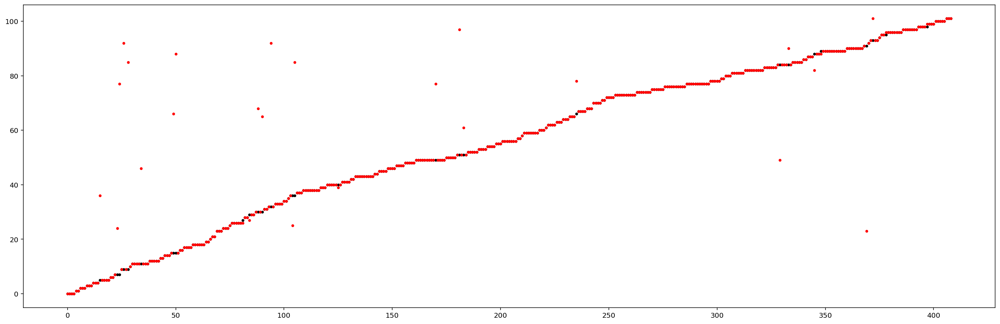

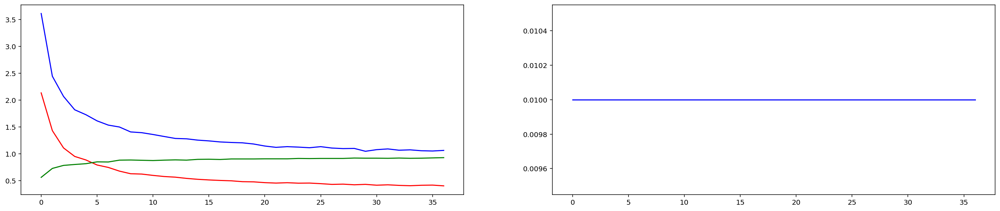

Epoch: 38:                lr: 0.01000000	               Training Loss: 1.040493	               Validation Loss: 0.405670	               Validation accuracy: 92.67%	               Elapsed time: 1803.08
Validation loss decreased:                   (0.406558 --> 0.405670).   Saving model ...


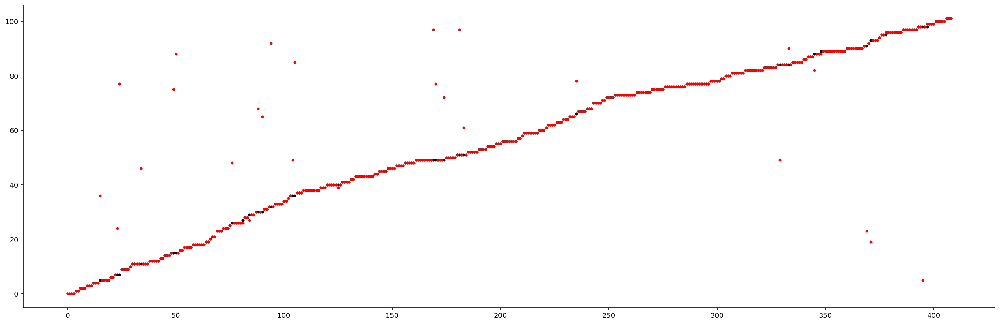

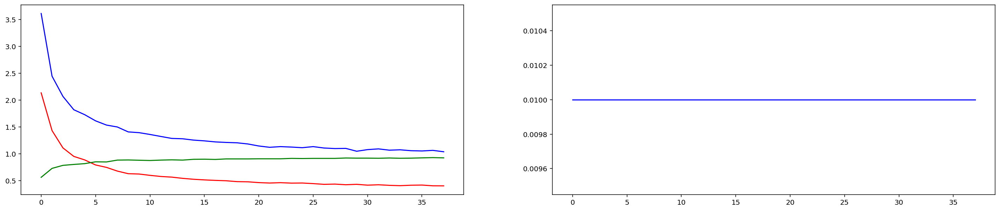

Epoch: 39:                lr: 0.01000000	               Training Loss: 1.052524	               Validation Loss: 0.404206	               Validation accuracy: 92.67%	               Elapsed time: 1850.83
Validation loss decreased:                   (0.405670 --> 0.404206).   Saving model ...


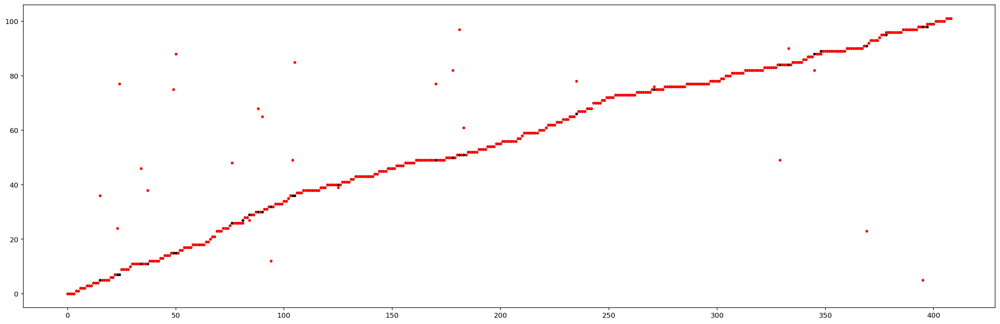

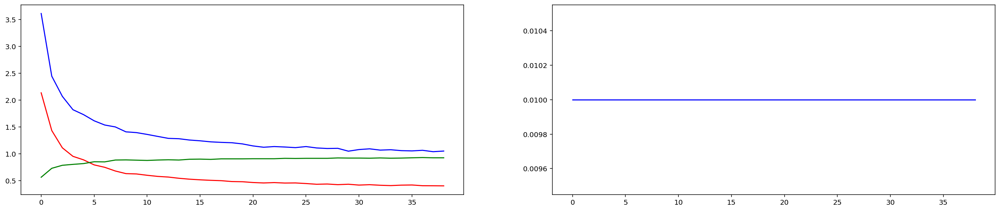

Epoch: 40:                lr: 0.01000000	               Training Loss: 1.048564	               Validation Loss: 0.409207	               Validation accuracy: 92.67%	               Elapsed time: 1898.02


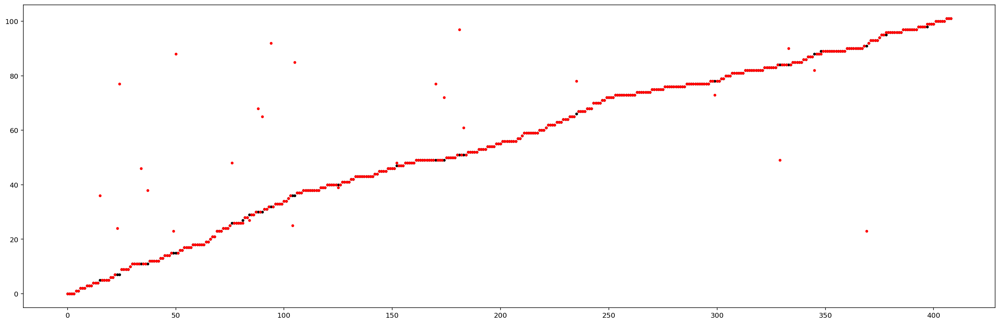

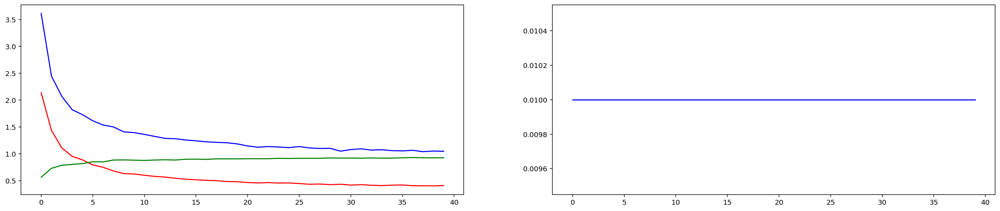

Epoch: 41:                lr: 0.01000000	               Training Loss: 1.042750	               Validation Loss: 0.406397	               Validation accuracy: 92.18%	               Elapsed time: 1946.12


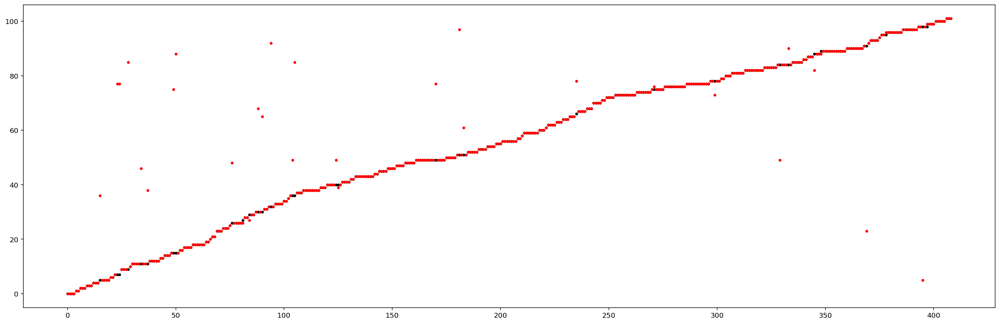

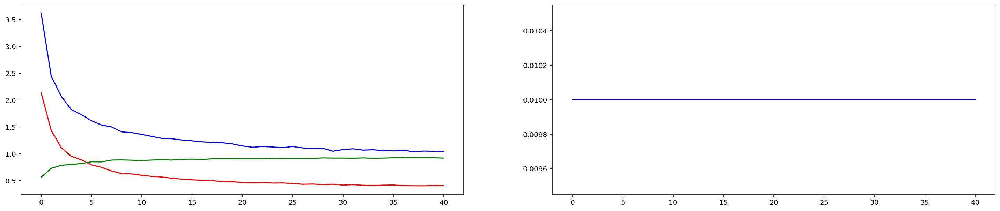

Epoch: 42:                lr: 0.01000000	               Training Loss: 1.026061	               Validation Loss: 0.397224	               Validation accuracy: 93.40%	               Elapsed time: 1993.52
Validation loss decreased:                   (0.404206 --> 0.397224).   Saving model ...


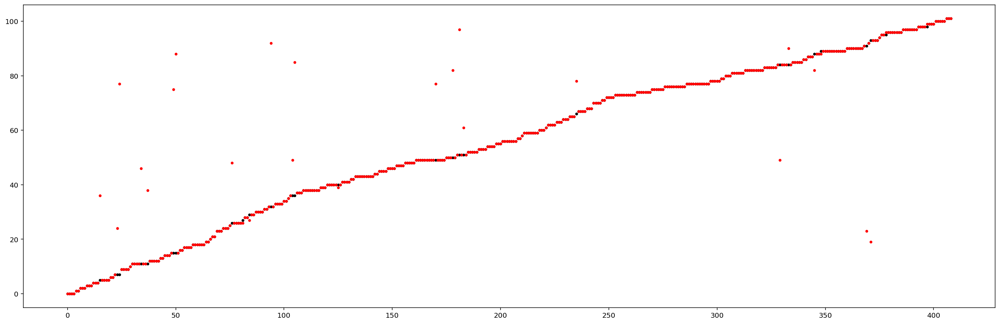

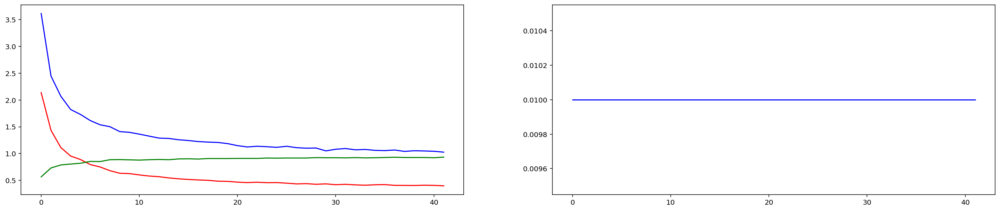

Epoch: 43:                lr: 0.01000000	               Training Loss: 1.015507	               Validation Loss: 0.392897	               Validation accuracy: 92.67%	               Elapsed time: 2040.92
Validation loss decreased:                   (0.397224 --> 0.392897).   Saving model ...


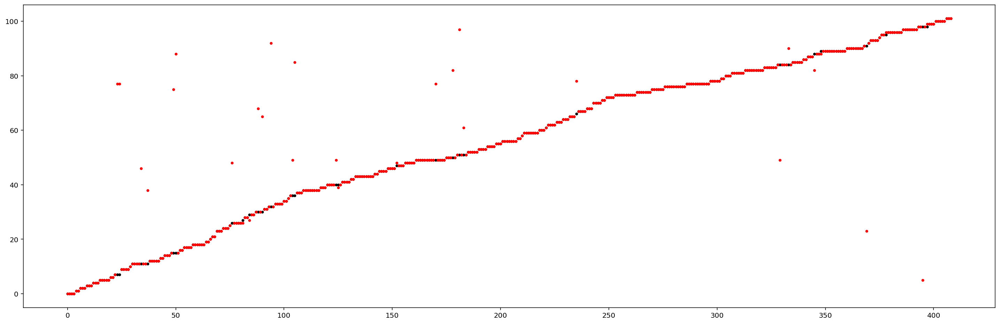

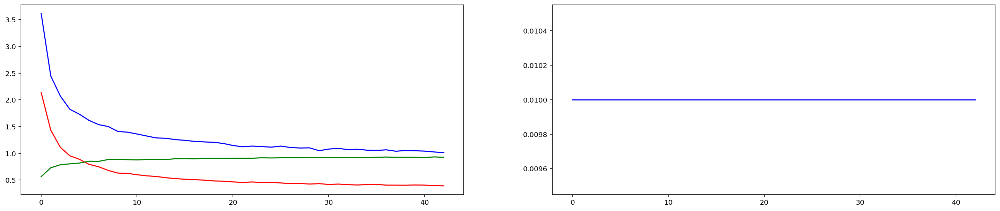

Epoch: 44:                lr: 0.01000000	               Training Loss: 0.993570	               Validation Loss: 0.392882	               Validation accuracy: 92.67%	               Elapsed time: 2089.29
Validation loss decreased:                   (0.392897 --> 0.392882).   Saving model ...


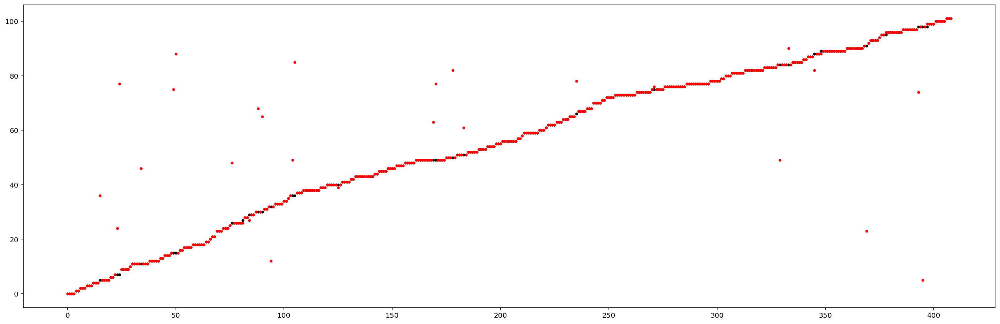

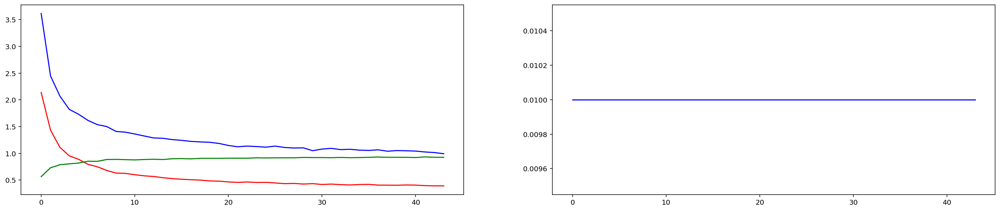

Epoch: 45:                lr: 0.01000000	               Training Loss: 1.030597	               Validation Loss: 0.392686	               Validation accuracy: 93.15%	               Elapsed time: 2136.53
Validation loss decreased:                   (0.392882 --> 0.392686).   Saving model ...


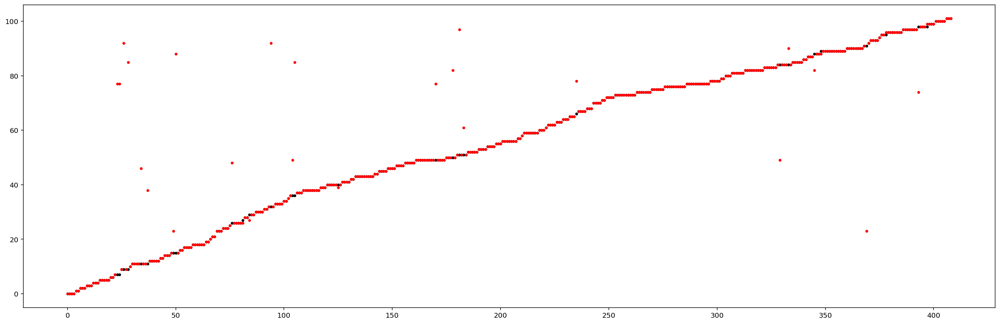

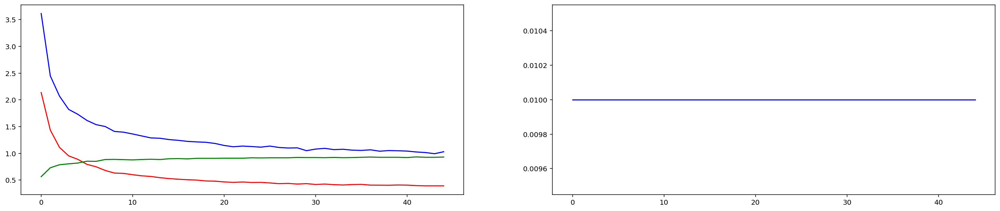

Epoch: 46:                lr: 0.01000000	               Training Loss: 0.987647	               Validation Loss: 0.392896	               Validation accuracy: 91.93%	               Elapsed time: 2183.84


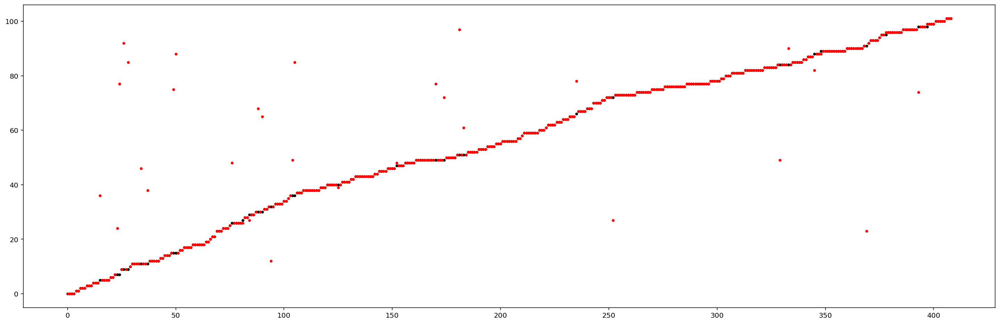

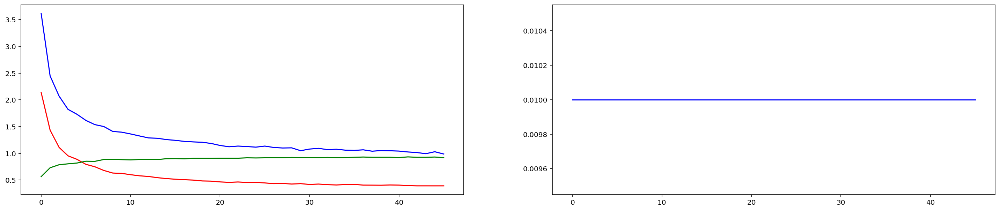

Epoch: 47:                lr: 0.01000000	               Training Loss: 1.019276	               Validation Loss: 0.390928	               Validation accuracy: 93.15%	               Elapsed time: 2231.15
Validation loss decreased:                   (0.392686 --> 0.390928).   Saving model ...


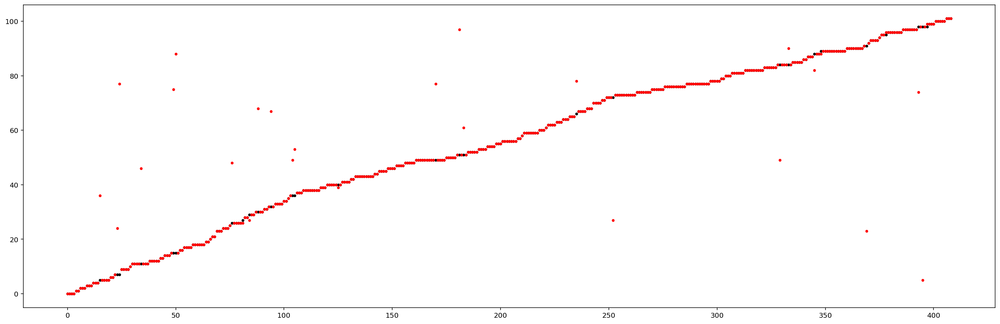

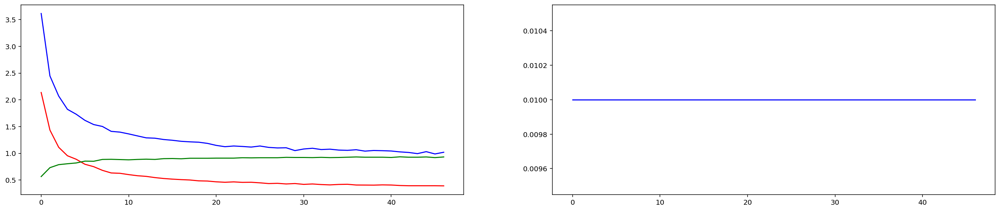

Epoch: 48:                lr: 0.01000000	               Training Loss: 1.022224	               Validation Loss: 0.389514	               Validation accuracy: 91.93%	               Elapsed time: 2280.03
Validation loss decreased:                   (0.390928 --> 0.389514).   Saving model ...


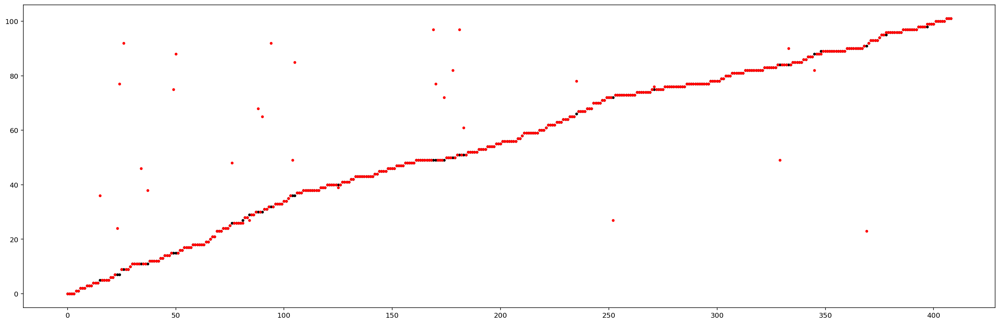

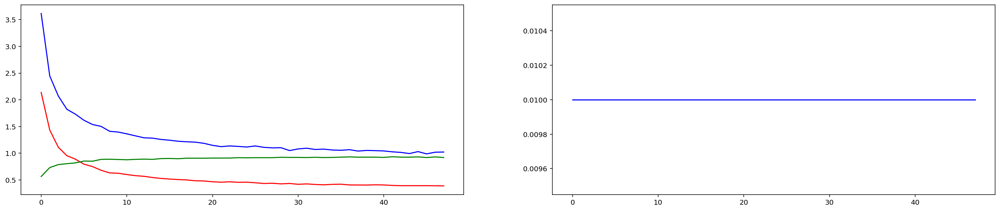

Epoch: 49:                lr: 0.01000000	               Training Loss: 1.019201	               Validation Loss: 0.380928	               Validation accuracy: 92.42%	               Elapsed time: 2327.67
Validation loss decreased:                   (0.389514 --> 0.380928).   Saving model ...


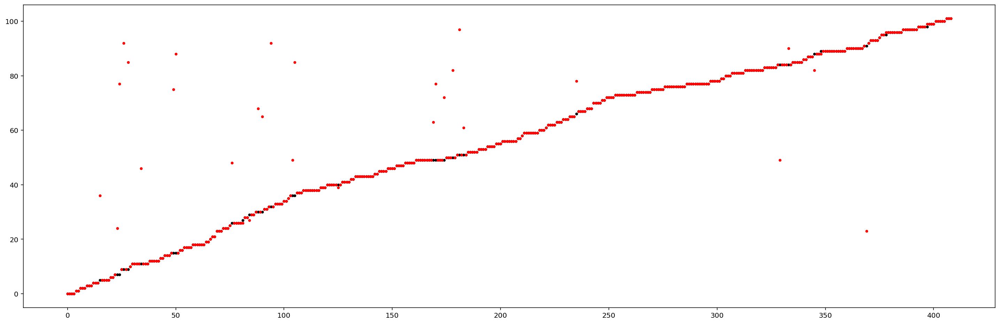

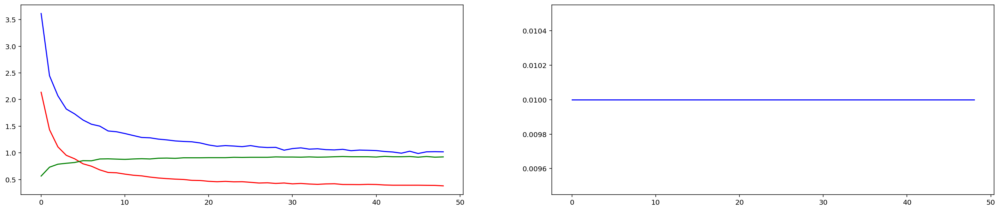

Epoch: 50:                lr: 0.01000000	               Training Loss: 0.998700	               Validation Loss: 0.390589	               Validation accuracy: 92.67%	               Elapsed time: 2376.29


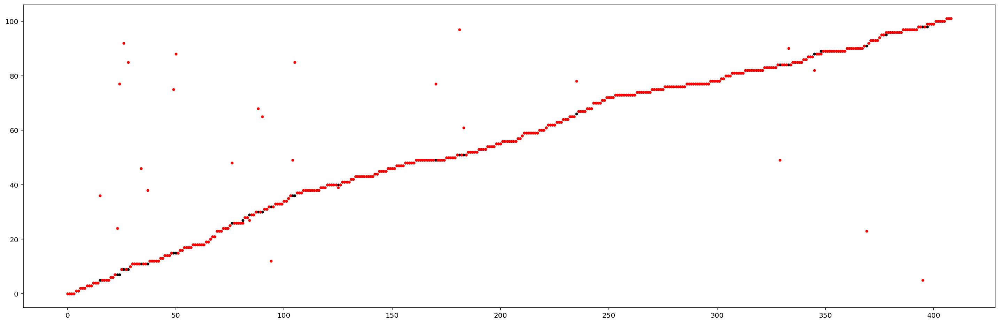

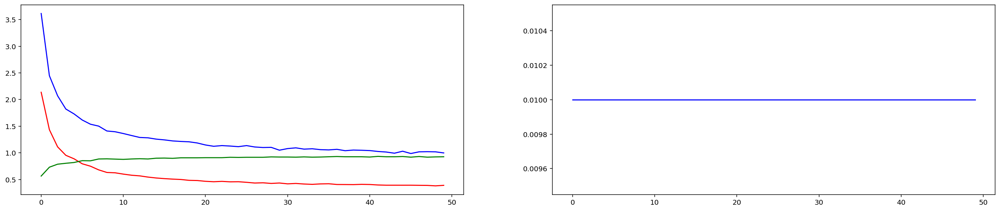

Epoch: 51:                lr: 0.01000000	               Training Loss: 0.977088	               Validation Loss: 0.380068	               Validation accuracy: 92.18%	               Elapsed time: 2423.60
Validation loss decreased:                   (0.380928 --> 0.380068).   Saving model ...


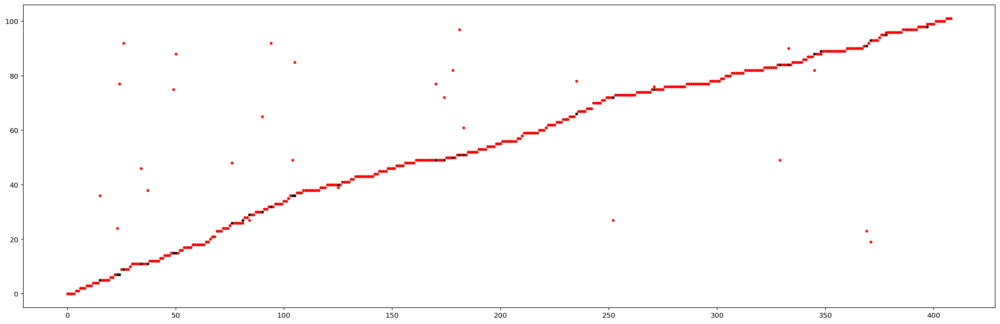

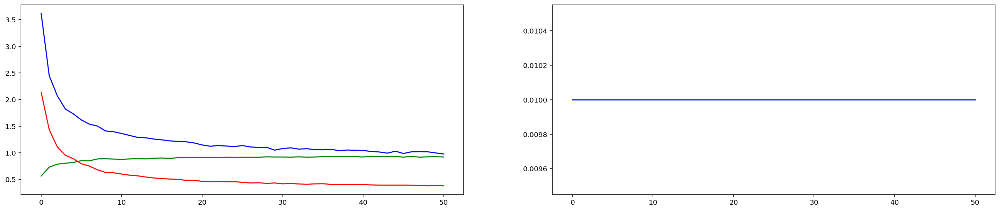

Epoch: 52:                lr: 0.01000000	               Training Loss: 0.984965	               Validation Loss: 0.371870	               Validation accuracy: 92.42%	               Elapsed time: 2471.59
Validation loss decreased:                   (0.380068 --> 0.371870).   Saving model ...


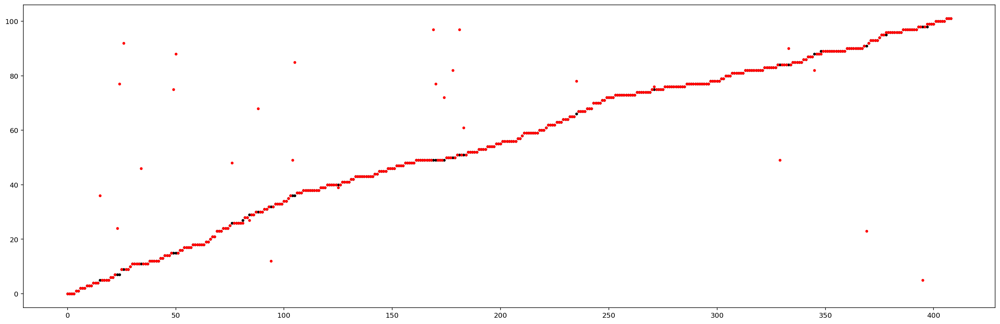

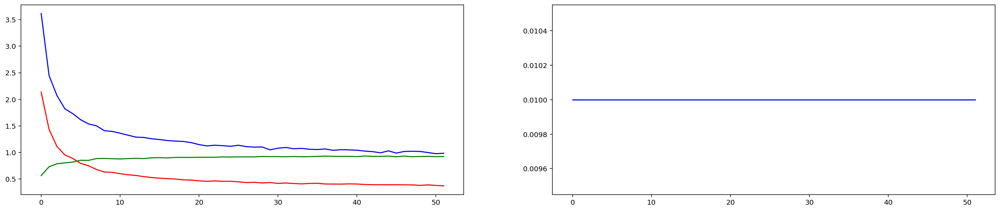

Epoch: 53:                lr: 0.01000000	               Training Loss: 0.992454	               Validation Loss: 0.377461	               Validation accuracy: 93.15%	               Elapsed time: 2519.03


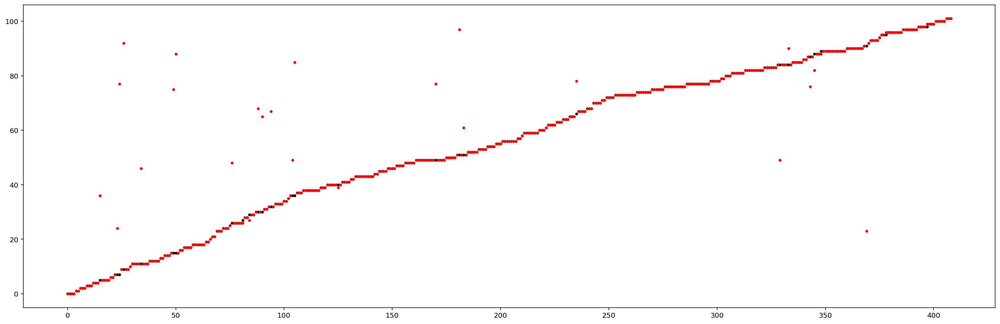

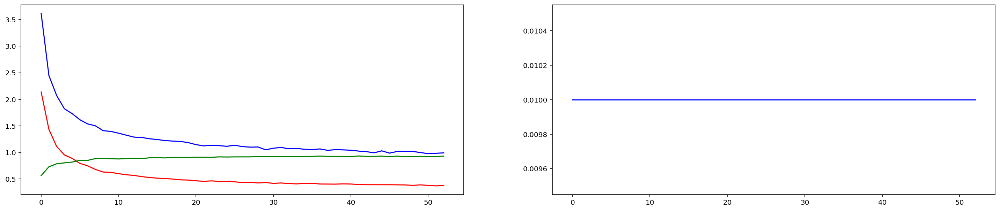

Epoch: 54:                lr: 0.01000000	               Training Loss: 0.968672	               Validation Loss: 0.366322	               Validation accuracy: 92.91%	               Elapsed time: 2566.16
Validation loss decreased:                   (0.371870 --> 0.366322).   Saving model ...


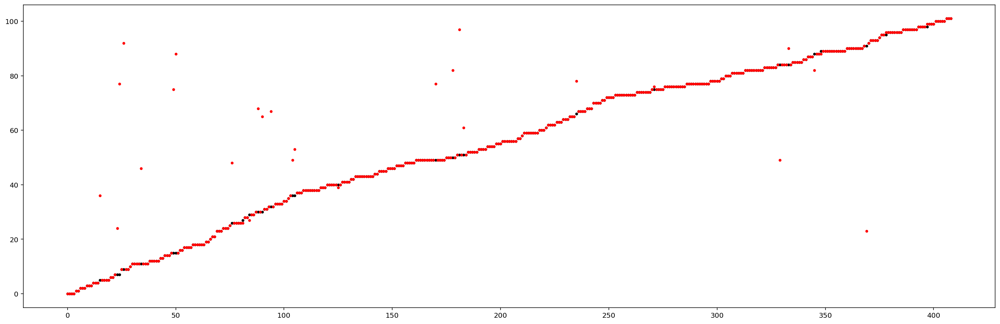

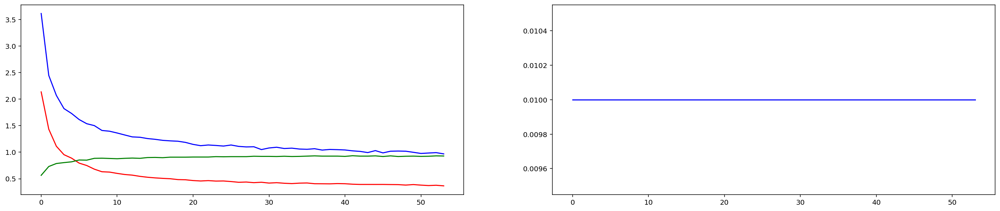

Epoch: 55:                lr: 0.01000000	               Training Loss: 0.972959	               Validation Loss: 0.376031	               Validation accuracy: 92.91%	               Elapsed time: 2614.15


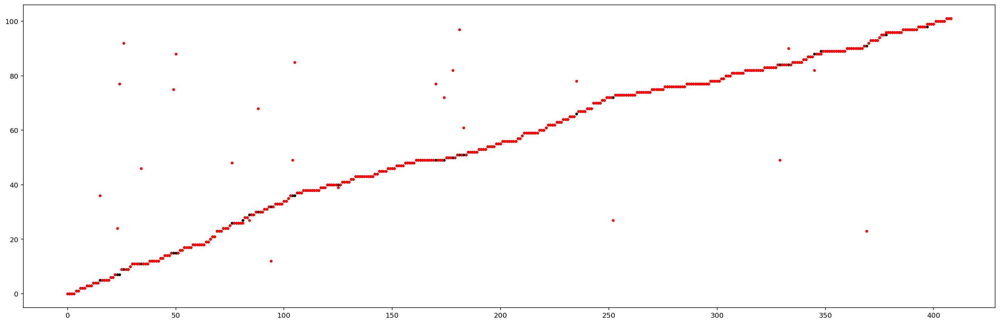

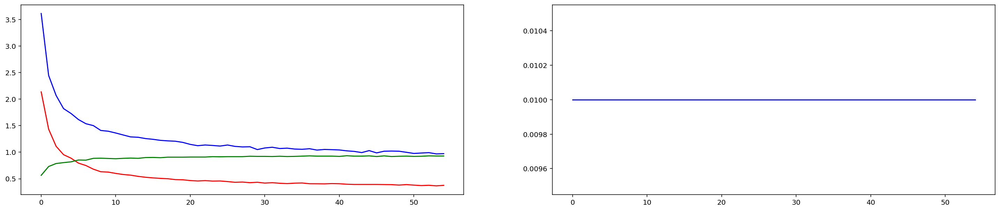

Epoch: 56:                lr: 0.01000000	               Training Loss: 0.964288	               Validation Loss: 0.369039	               Validation accuracy: 92.42%	               Elapsed time: 2661.84


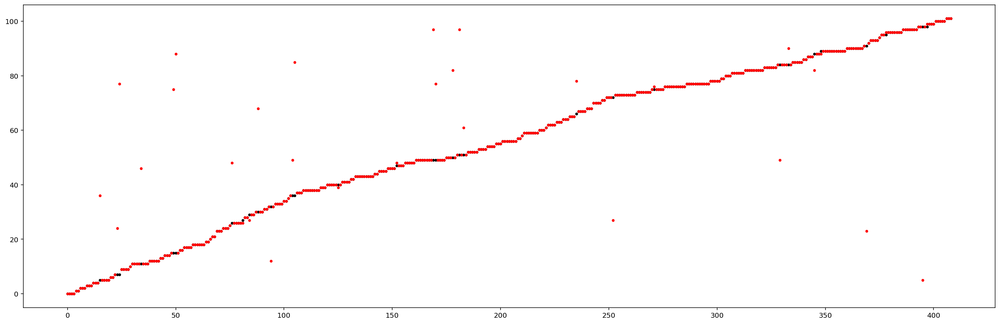

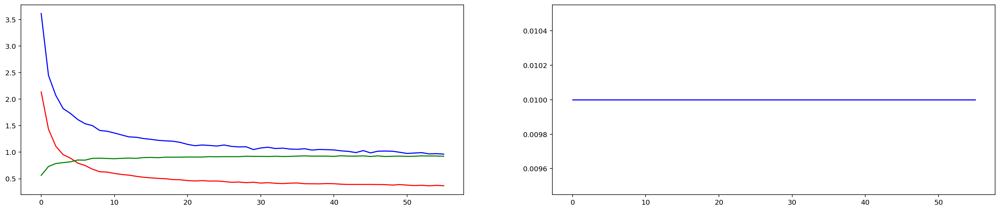

Epoch: 57:                lr: 0.01000000	               Training Loss: 0.971229	               Validation Loss: 0.375183	               Validation accuracy: 92.18%	               Elapsed time: 2709.04


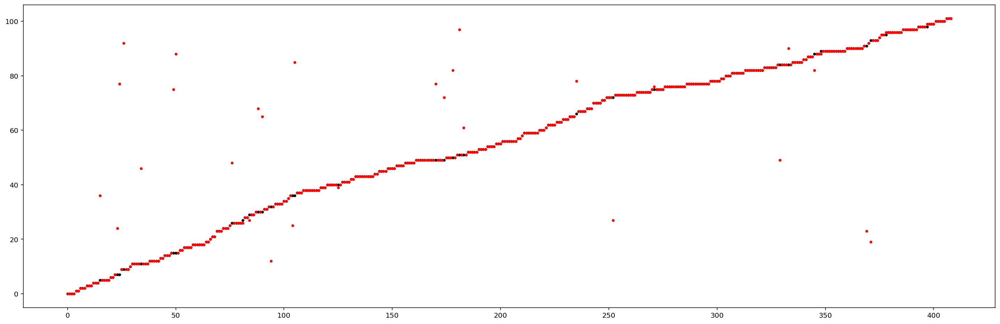

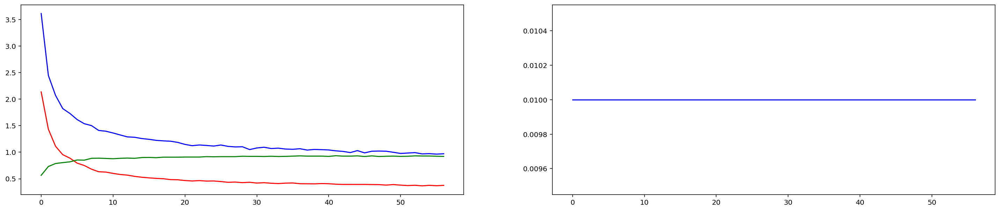

Epoch: 58:                lr: 0.01000000	               Training Loss: 0.992106	               Validation Loss: 0.368986	               Validation accuracy: 93.40%	               Elapsed time: 2756.71


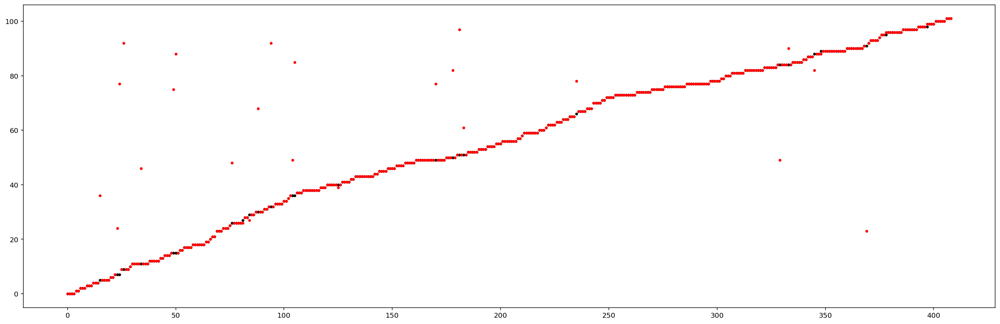

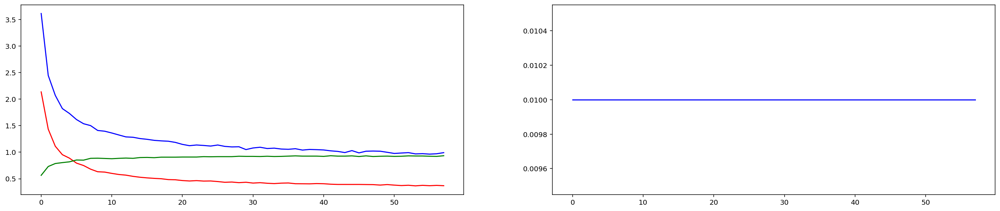

Epoch: 59:                lr: 0.01000000	               Training Loss: 0.964934	               Validation Loss: 0.377902	               Validation accuracy: 92.42%	               Elapsed time: 2805.56


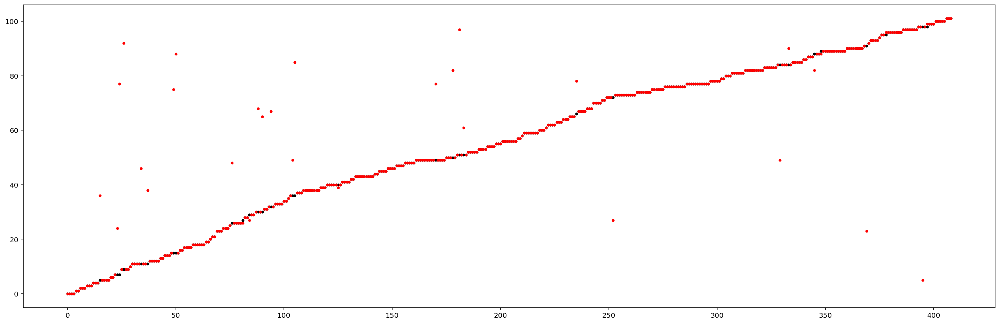

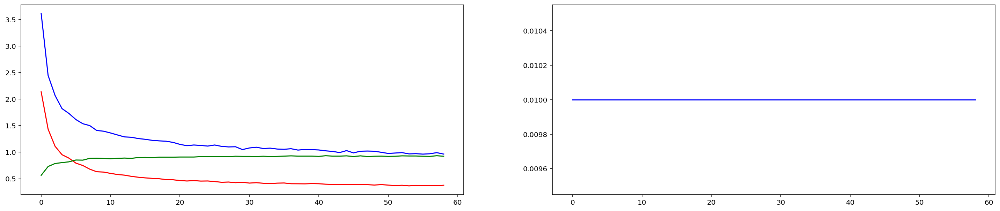

Epoch: 60:                lr: 0.01000000	               Training Loss: 0.974317	               Validation Loss: 0.376103	               Validation accuracy: 92.67%	               Elapsed time: 2852.87


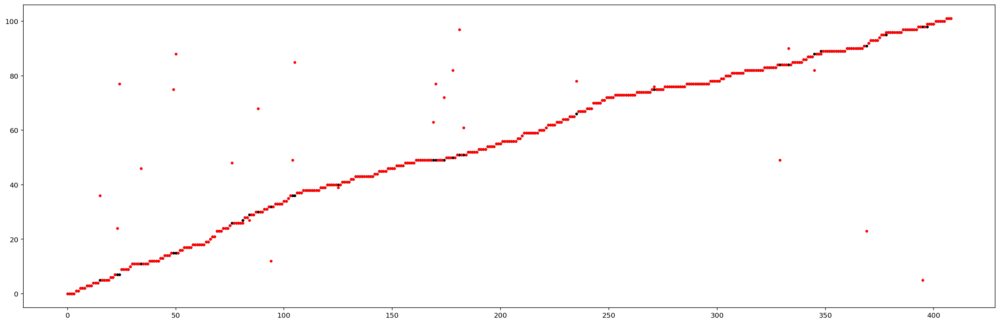

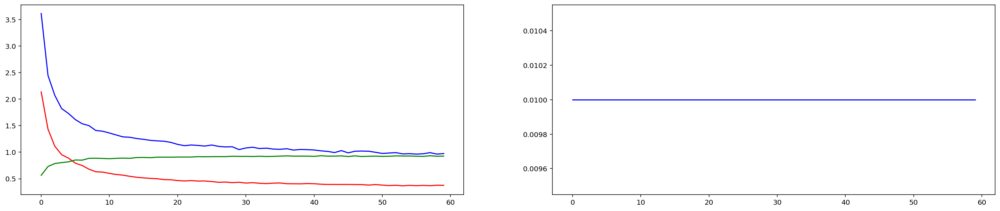

Epoch: 61:                lr: 0.00100000	               Training Loss: 0.950913	               Validation Loss: 0.371007	               Validation accuracy: 92.67%	               Elapsed time: 2901.34


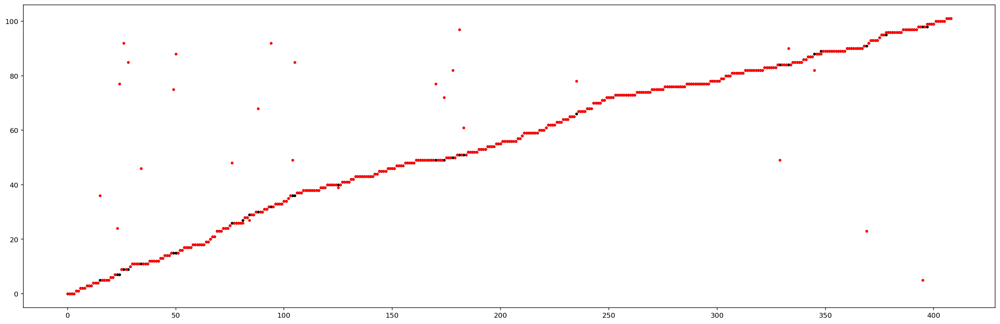

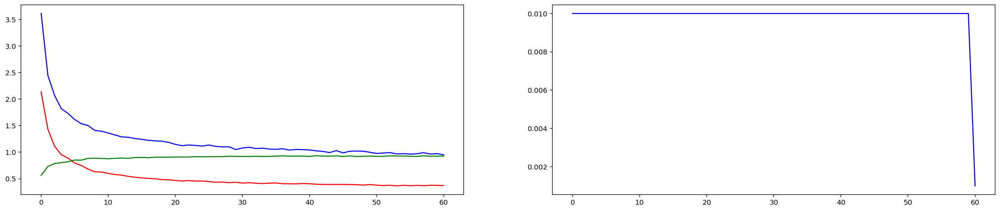

Epoch: 62:                lr: 0.00100000	               Training Loss: 0.971351	               Validation Loss: 0.367686	               Validation accuracy: 92.67%	               Elapsed time: 2948.70


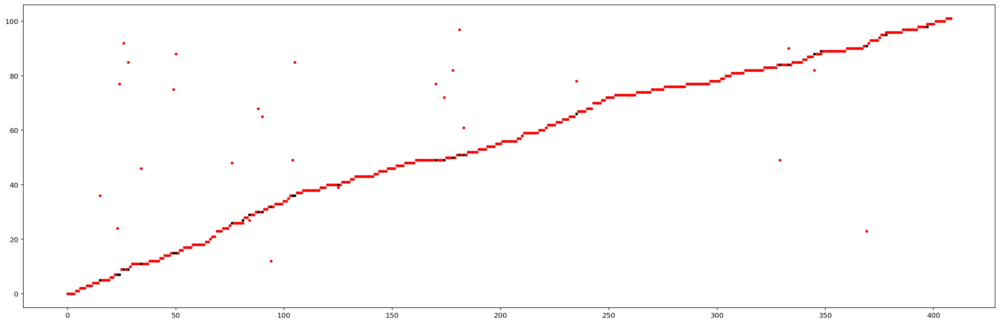

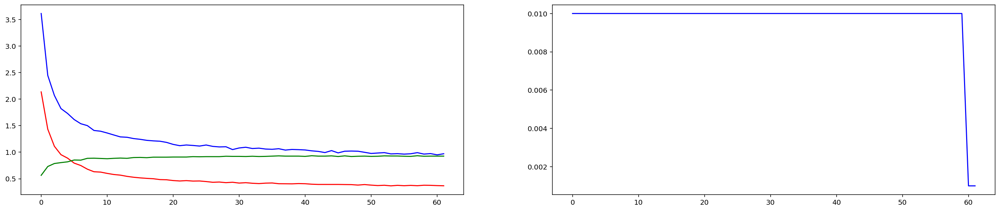

Epoch: 63:                lr: 0.00100000	               Training Loss: 0.932037	               Validation Loss: 0.358185	               Validation accuracy: 92.42%	               Elapsed time: 2995.90
Validation loss decreased:                   (0.366322 --> 0.358185).   Saving model ...


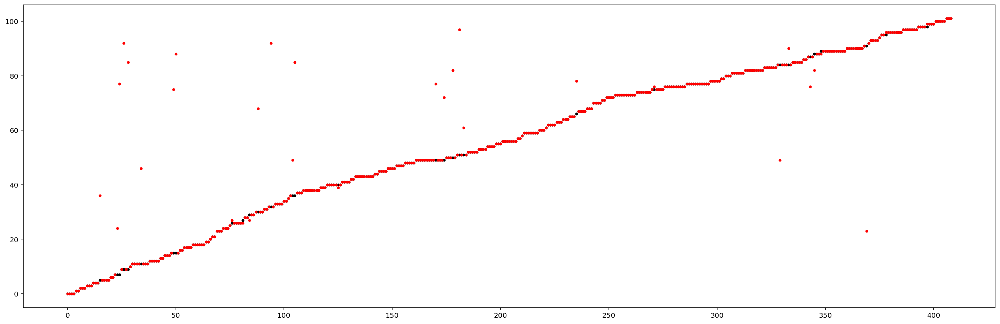

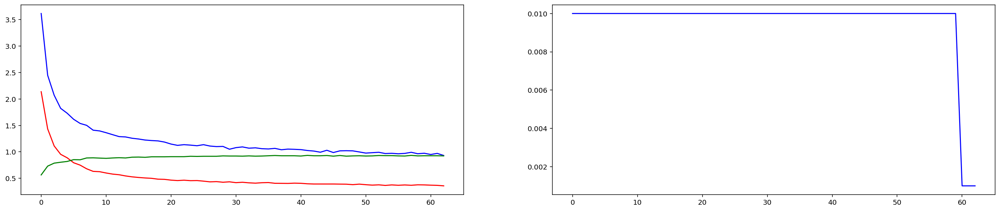

Epoch: 64:                lr: 0.00100000	               Training Loss: 0.962140	               Validation Loss: 0.361465	               Validation accuracy: 92.67%	               Elapsed time: 3043.42


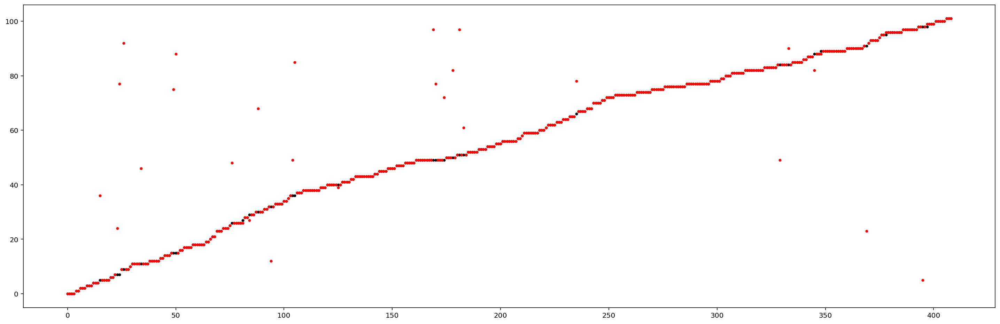

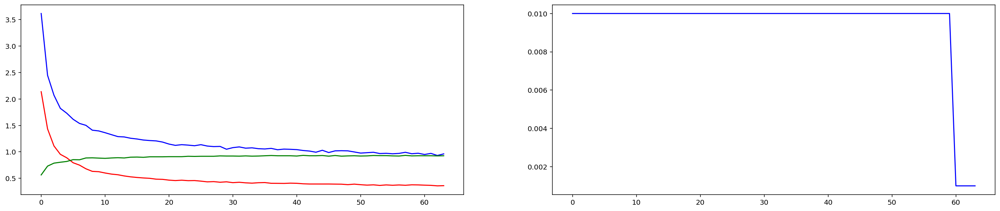

Epoch: 65:                lr: 0.00100000	               Training Loss: 0.974010	               Validation Loss: 0.364833	               Validation accuracy: 93.15%	               Elapsed time: 3090.67


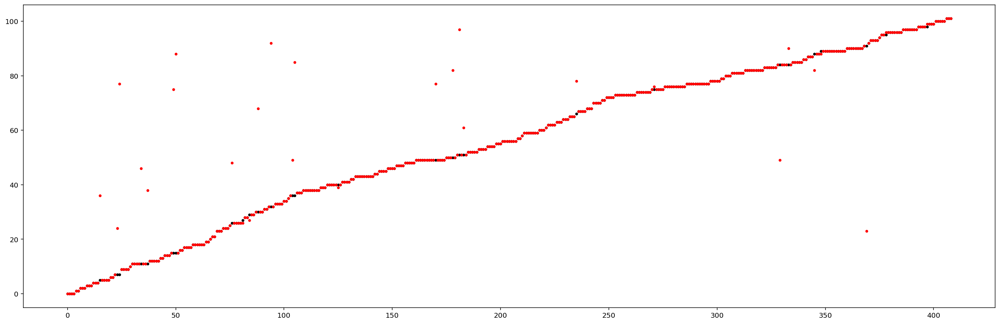

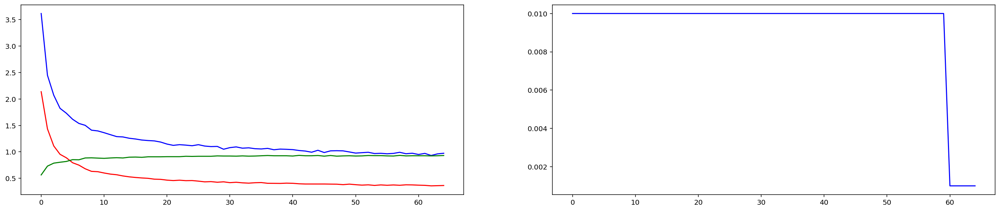

Epoch: 66:                lr: 0.00100000	               Training Loss: 0.951611	               Validation Loss: 0.373596	               Validation accuracy: 92.42%	               Elapsed time: 3138.40


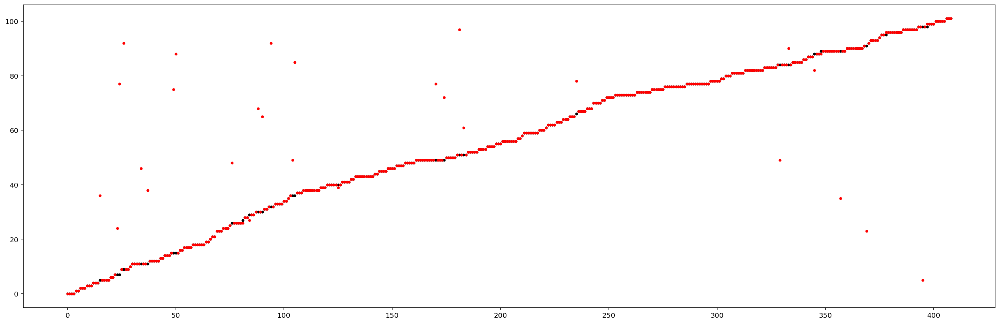

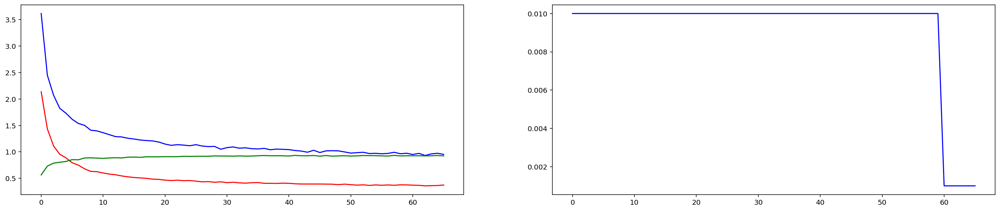

Epoch: 67:                lr: 0.00100000	               Training Loss: 0.929048	               Validation Loss: 0.367566	               Validation accuracy: 93.15%	               Elapsed time: 3185.98


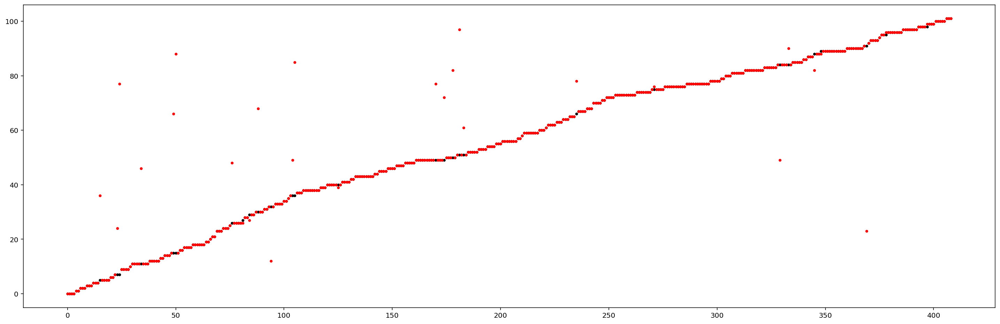

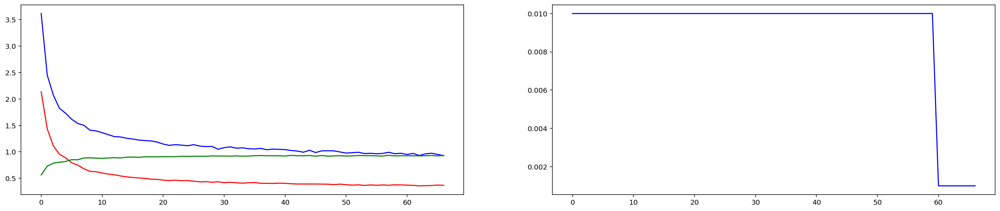

Epoch: 68:                lr: 0.00100000	               Training Loss: 0.969901	               Validation Loss: 0.364581	               Validation accuracy: 93.40%	               Elapsed time: 3233.39


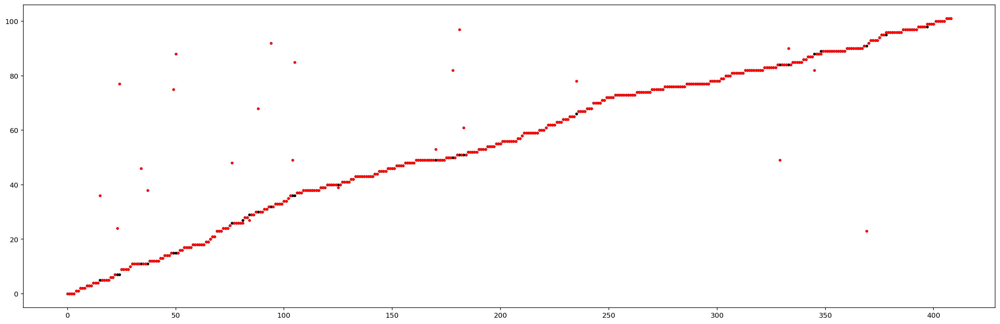

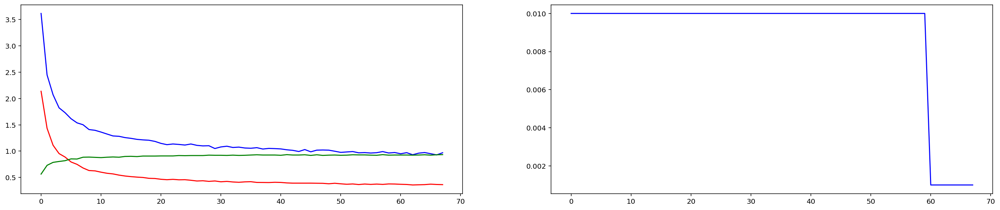

Epoch: 69:                lr: 0.00100000	               Training Loss: 0.946477	               Validation Loss: 0.363861	               Validation accuracy: 93.15%	               Elapsed time: 3280.63


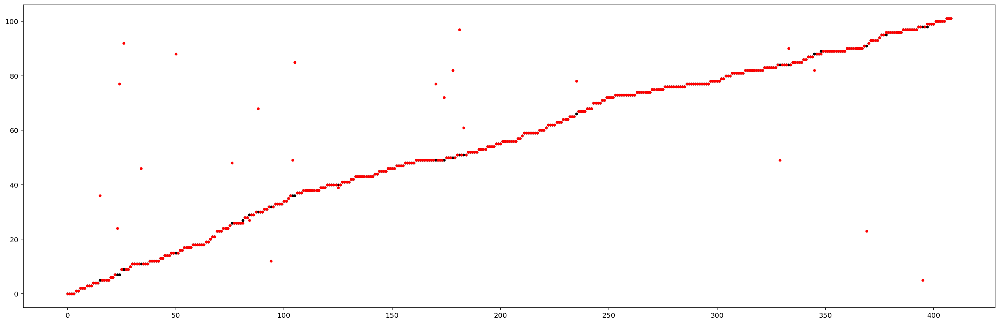

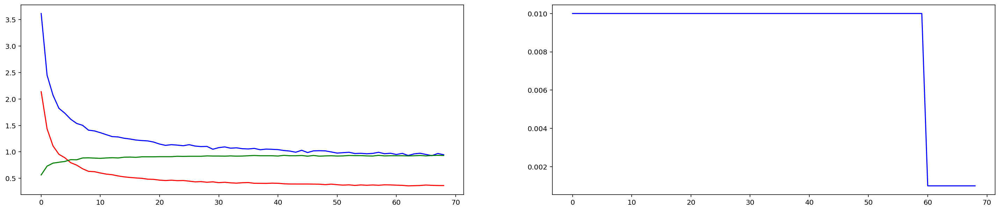

Epoch: 70:                lr: 0.00010000	               Training Loss: 0.983794	               Validation Loss: 0.362166	               Validation accuracy: 93.15%	               Elapsed time: 3329.94


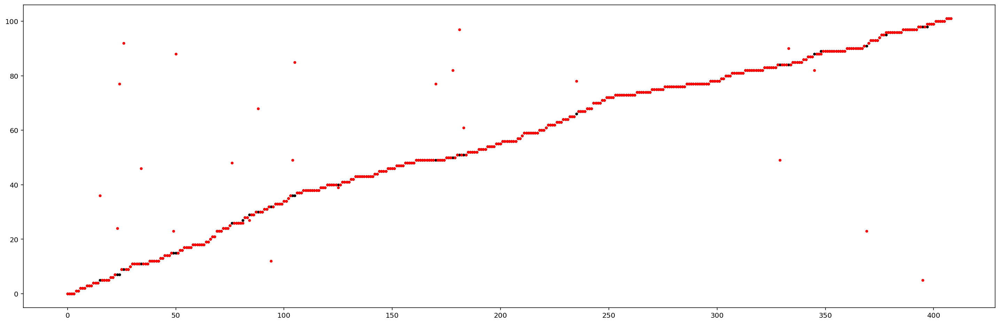

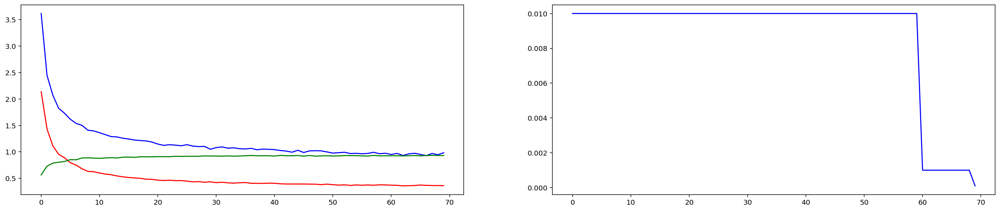

Epoch: 71:                lr: 0.00010000	               Training Loss: 0.936546	               Validation Loss: 0.360465	               Validation accuracy: 93.40%	               Elapsed time: 3377.62


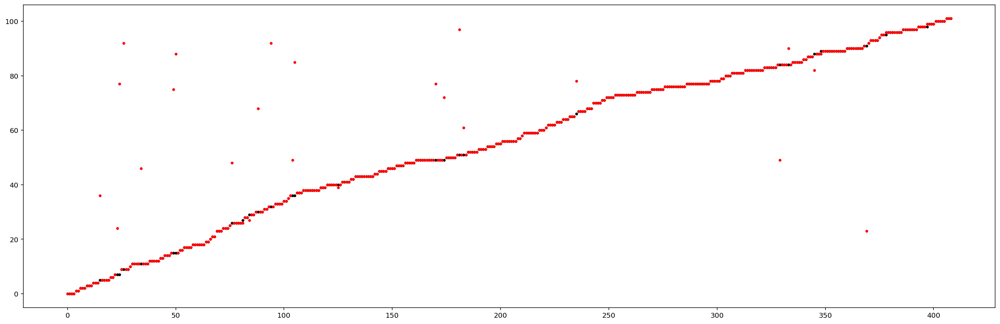

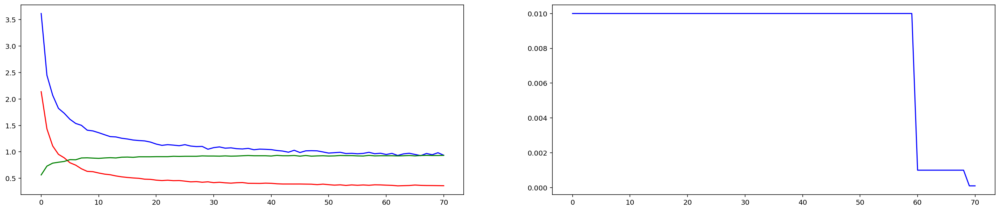

Epoch: 72:                lr: 0.00010000	               Training Loss: 0.940442	               Validation Loss: 0.359379	               Validation accuracy: 93.15%	               Elapsed time: 3426.09


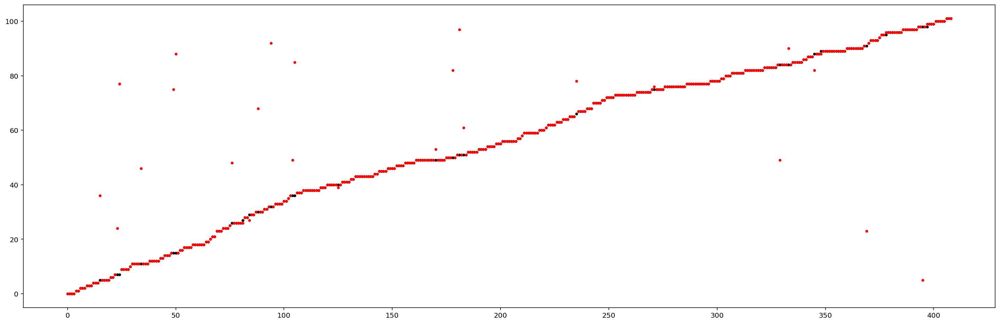

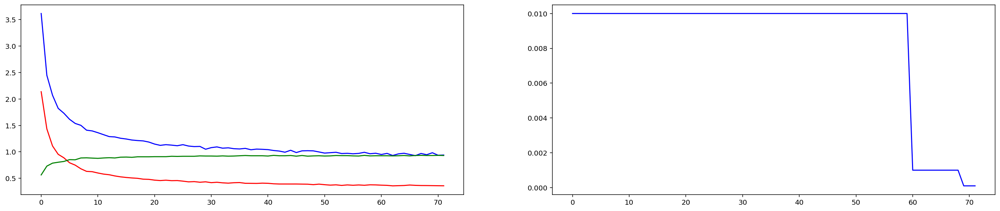

Epoch: 73:                lr: 0.00010000	               Training Loss: 0.932886	               Validation Loss: 0.357267	               Validation accuracy: 92.91%	               Elapsed time: 3473.99
Validation loss decreased:                   (0.358185 --> 0.357267).   Saving model ...


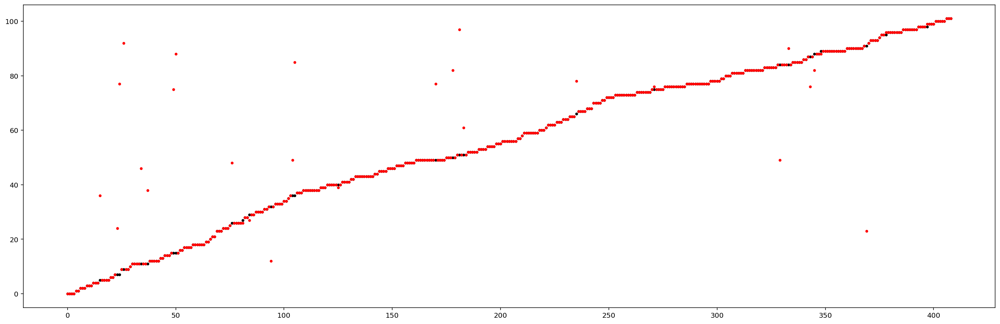

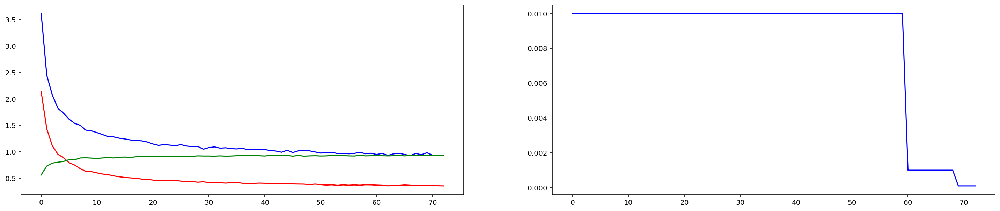

Epoch: 74:                lr: 0.00010000	               Training Loss: 0.959439	               Validation Loss: 0.366354	               Validation accuracy: 93.40%	               Elapsed time: 3521.40


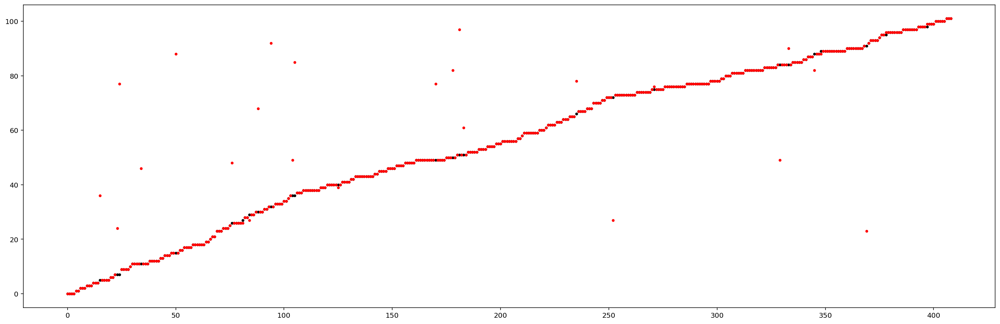

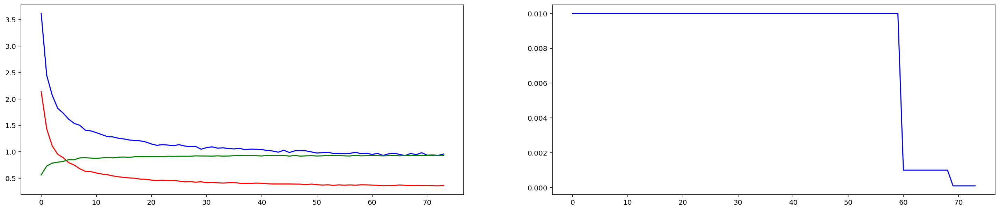

Epoch: 75:                lr: 0.00010000	               Training Loss: 0.945487	               Validation Loss: 0.366971	               Validation accuracy: 93.15%	               Elapsed time: 3568.98


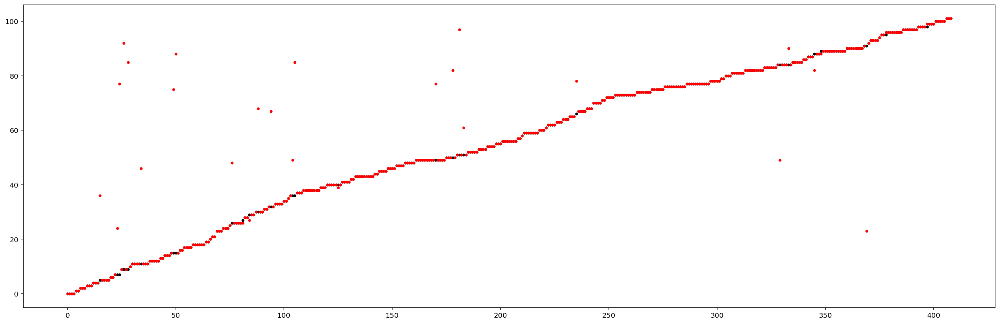

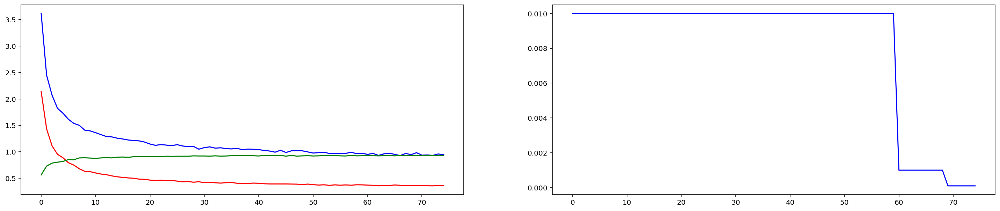

Epoch: 76:                lr: 0.00001000	               Training Loss: 0.933723	               Validation Loss: 0.358259	               Validation accuracy: 92.91%	               Elapsed time: 3616.70


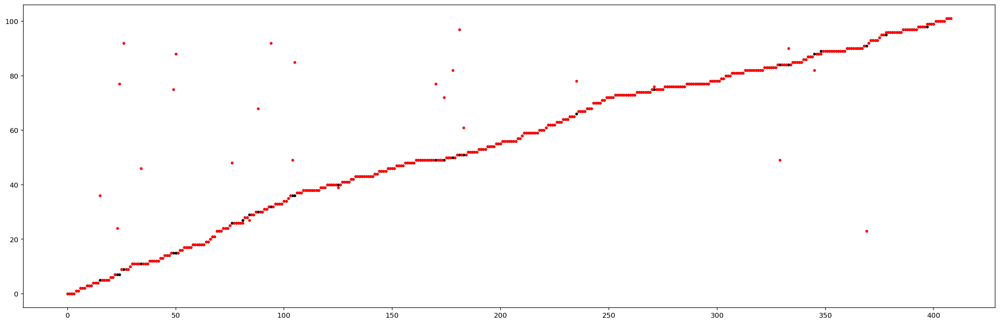

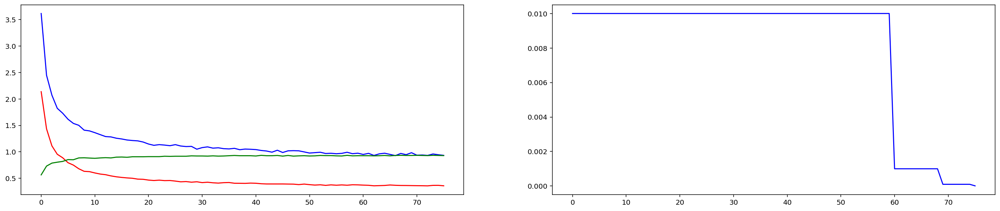

PHASE ONE
Epoch: 1:                lr: 0.01000000	               Training Loss: 3.614729	               Validation Loss: 2.137225	               Validation accuracy: 56.48%	               Elapsed time: 47.65
Epoch: 2:                lr: 0.01000000	               Training Loss: 2.447174	               Validation Loss: 1.434442	               Validation accuracy: 73.11%	               Elapsed time: 94.58
Epoch: 3:                lr: 0.01000000	               Training Loss: 2.071115	               Validation Loss: 1.112570	               Validation accuracy: 78.73%	               Elapsed time: 141.66
Epoch: 4:                lr: 0.01000000	               Training Loss: 1.822663	               Validation Loss: 0.954107	               Validation accuracy: 80.44%	               Elapsed time: 188.79
Epoch: 5:                lr: 0.01000000	               Training Loss: 1.730853	               Validation Loss: 0.888602	               Validation accuracy: 81.91%	               Elapsed time: 237.

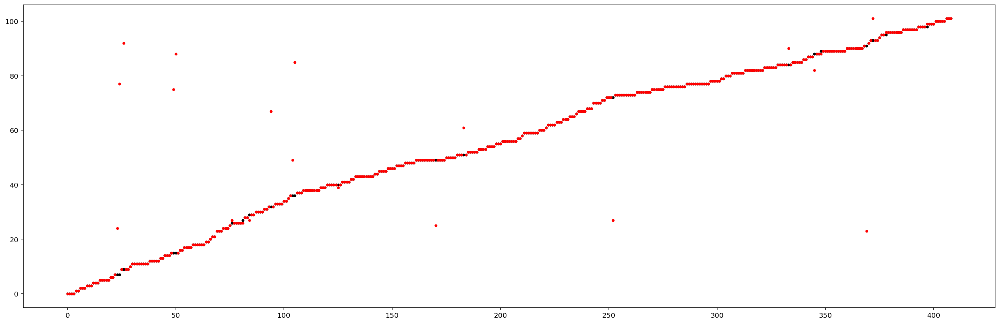

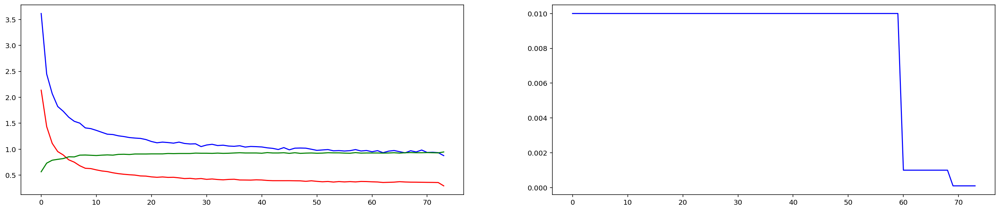

Epoch: 75:                lr: 0.00010000	               Training Loss: 0.803933	               Validation Loss: 0.269135	               Validation accuracy: 95.11%	               Elapsed time: 3574.15
Validation loss decreased:                   (0.293244 --> 0.269135).   Saving model ...


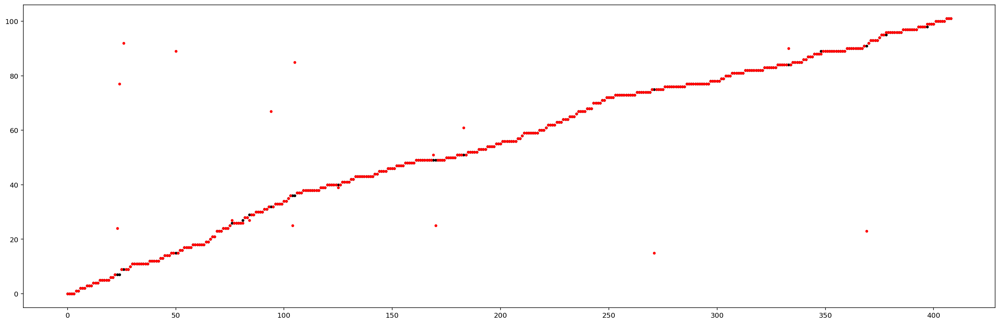

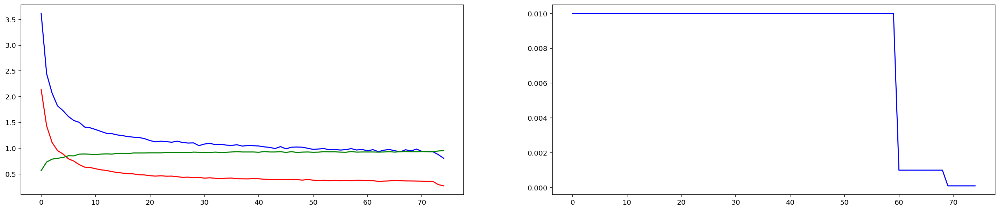

Epoch: 76:                lr: 0.00010000	               Training Loss: 0.767835	               Validation Loss: 0.261440	               Validation accuracy: 95.11%	               Elapsed time: 3624.41
Validation loss decreased:                   (0.269135 --> 0.261440).   Saving model ...


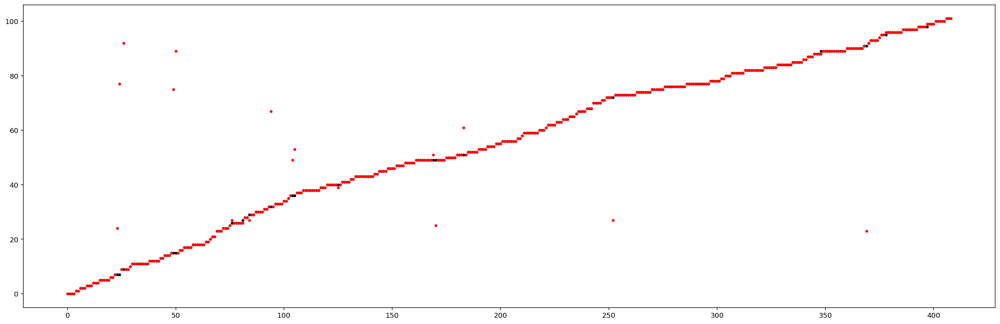

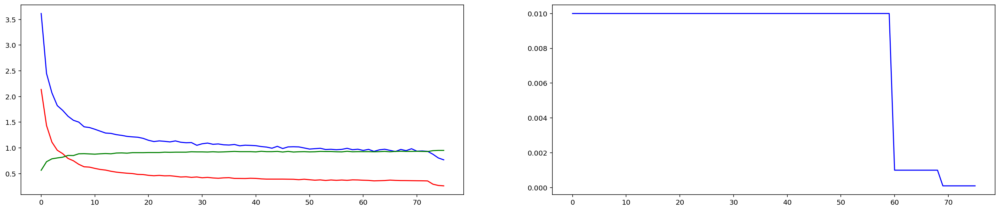

Epoch: 77:                lr: 0.00010000	               Training Loss: 0.743347	               Validation Loss: 0.256990	               Validation accuracy: 94.87%	               Elapsed time: 3674.53
Validation loss decreased:                   (0.261440 --> 0.256990).   Saving model ...


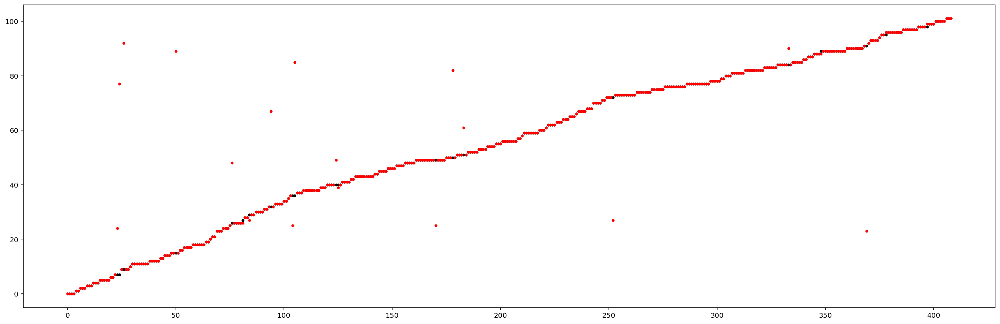

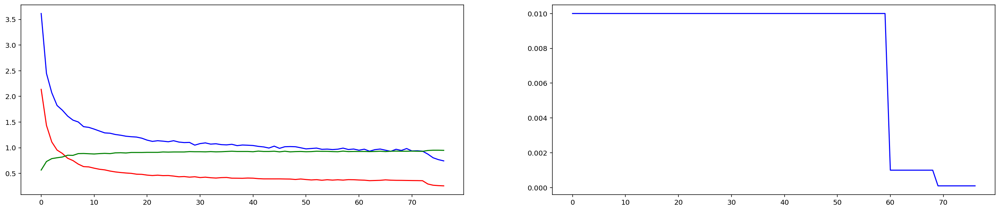

Epoch: 78:                lr: 0.00010000	               Training Loss: 0.714272	               Validation Loss: 0.256744	               Validation accuracy: 95.11%	               Elapsed time: 3724.32
Validation loss decreased:                   (0.256990 --> 0.256744).   Saving model ...


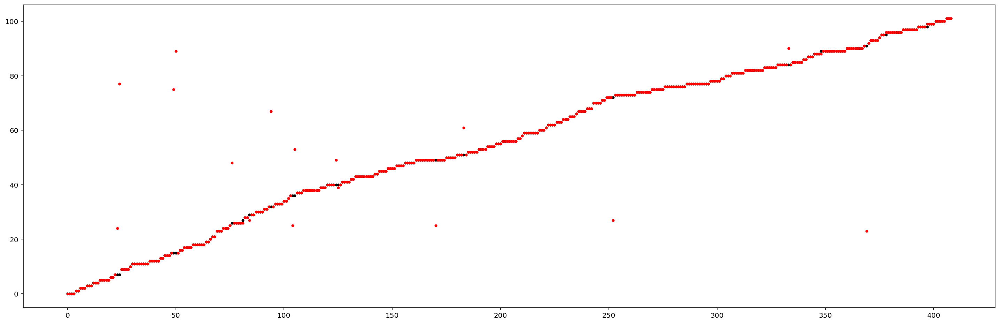

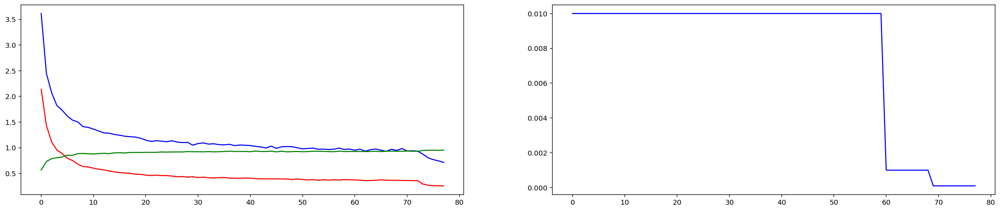

Epoch: 79:                lr: 0.00010000	               Training Loss: 0.729138	               Validation Loss: 0.243249	               Validation accuracy: 94.87%	               Elapsed time: 3774.29
Validation loss decreased:                   (0.256744 --> 0.243249).   Saving model ...


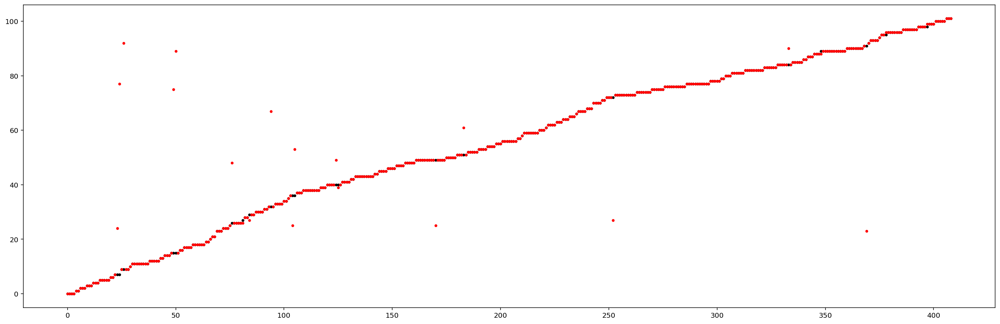

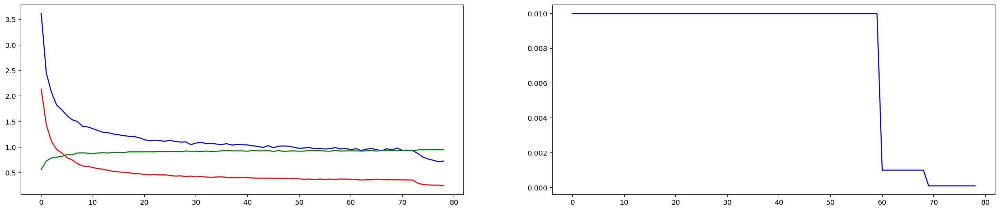

Epoch: 80:                lr: 0.00010000	               Training Loss: 0.680886	               Validation Loss: 0.238514	               Validation accuracy: 95.35%	               Elapsed time: 3824.30
Validation loss decreased:                   (0.243249 --> 0.238514).   Saving model ...


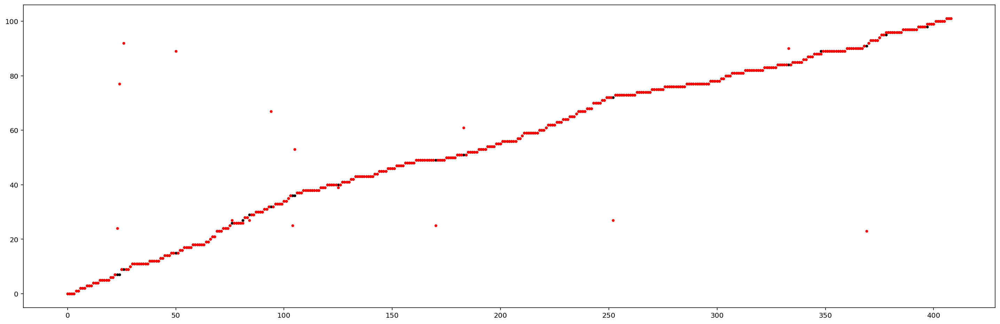

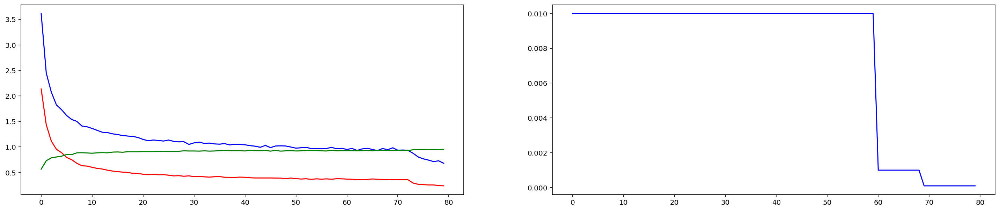

Epoch: 81:                lr: 0.00010000	               Training Loss: 0.679181	               Validation Loss: 0.229177	               Validation accuracy: 94.87%	               Elapsed time: 3874.17
Validation loss decreased:                   (0.238514 --> 0.229177).   Saving model ...


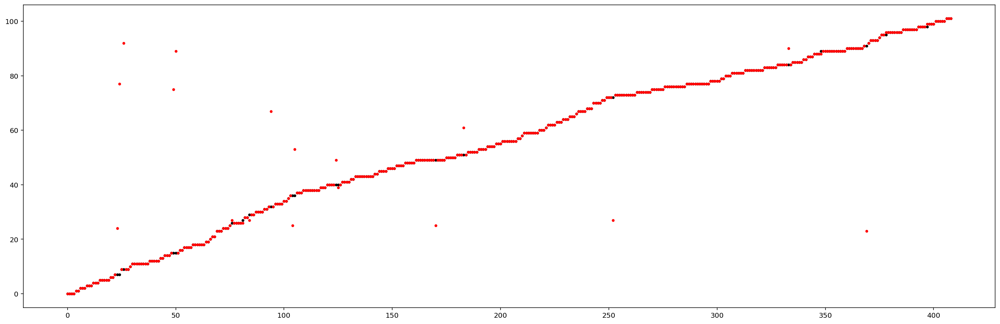

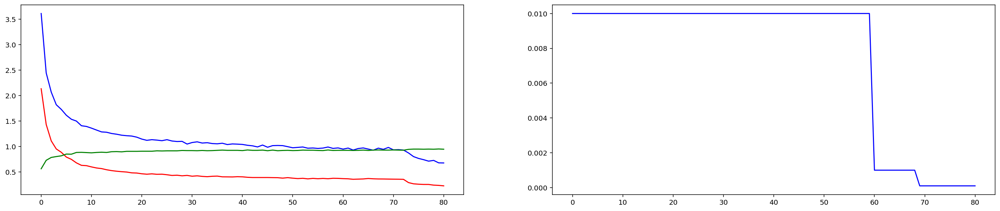

Epoch: 82:                lr: 0.00010000	               Training Loss: 0.682086	               Validation Loss: 0.226252	               Validation accuracy: 94.87%	               Elapsed time: 3924.04
Validation loss decreased:                   (0.229177 --> 0.226252).   Saving model ...


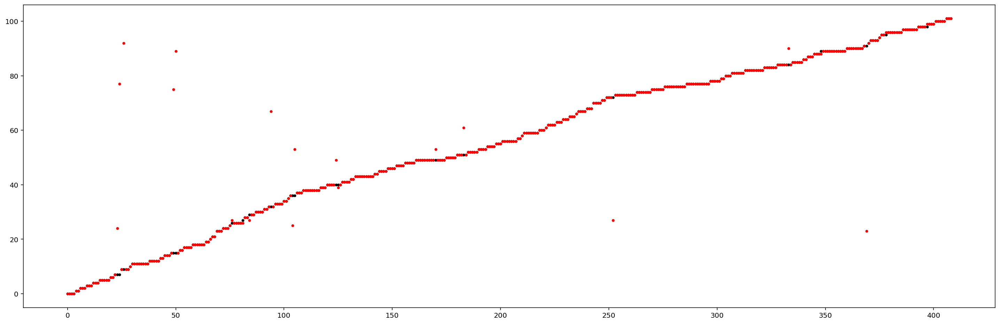

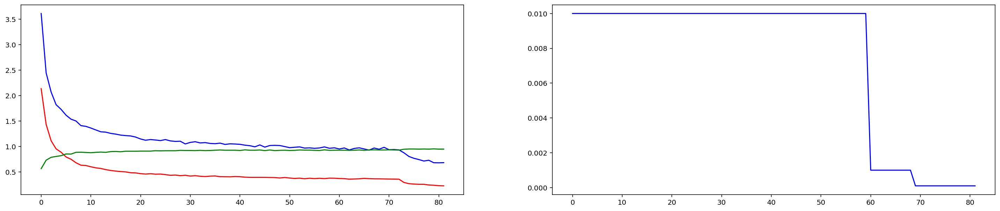

Epoch: 83:                lr: 0.00010000	               Training Loss: 0.651569	               Validation Loss: 0.230441	               Validation accuracy: 95.11%	               Elapsed time: 3974.82


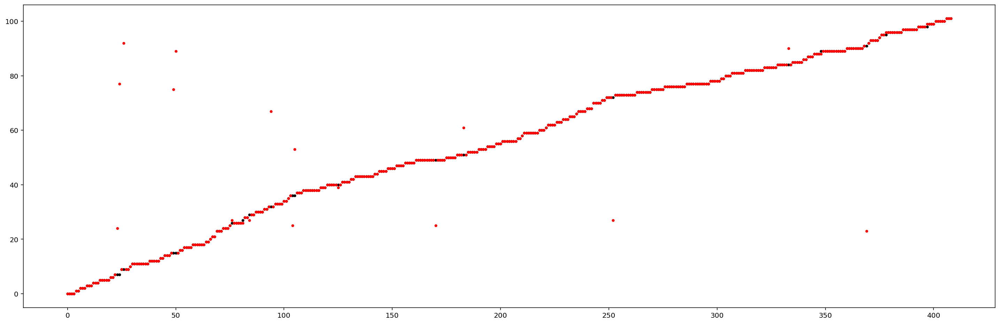

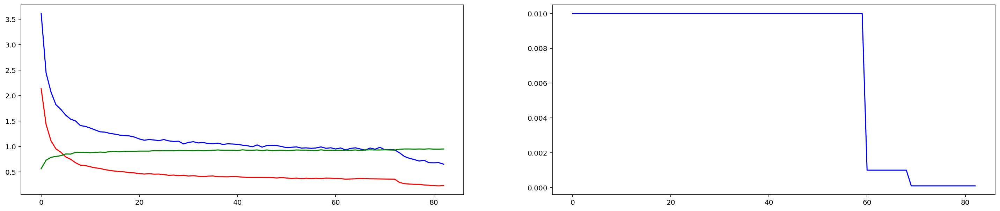

Epoch: 84:                lr: 0.00010000	               Training Loss: 0.660842	               Validation Loss: 0.217474	               Validation accuracy: 96.09%	               Elapsed time: 4025.15
Validation loss decreased:                   (0.226252 --> 0.217474).   Saving model ...


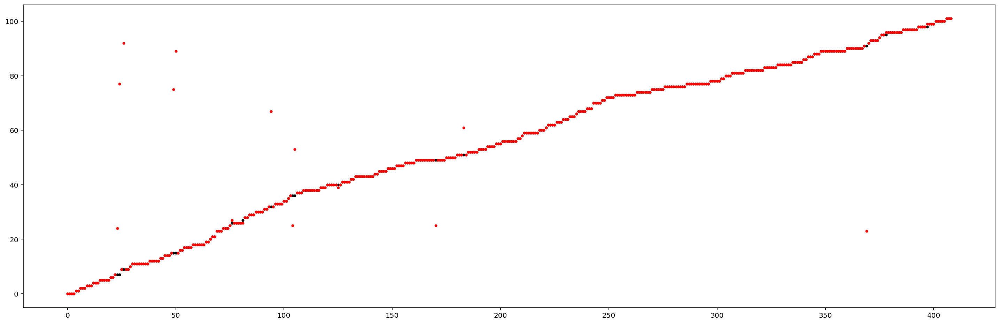

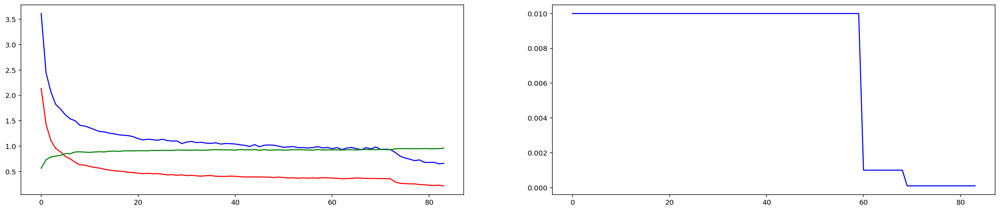

Epoch: 85:                lr: 0.00010000	               Training Loss: 0.661382	               Validation Loss: 0.219445	               Validation accuracy: 95.35%	               Elapsed time: 4075.35


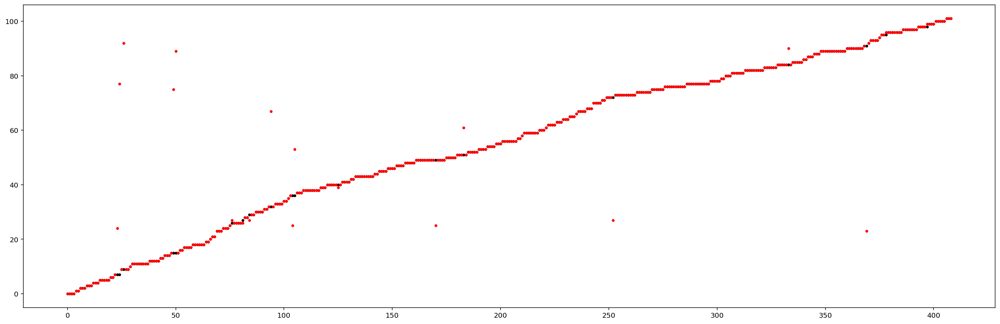

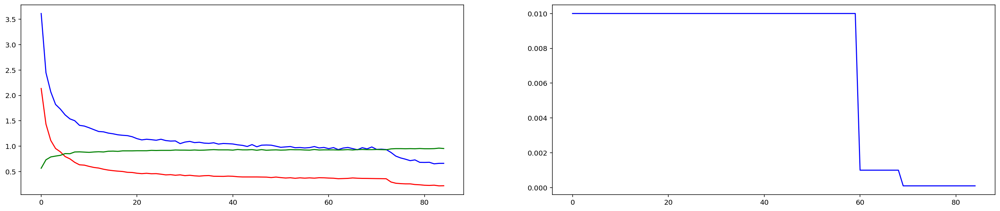

Epoch: 86:                lr: 0.00010000	               Training Loss: 0.651751	               Validation Loss: 0.232791	               Validation accuracy: 95.35%	               Elapsed time: 4125.37


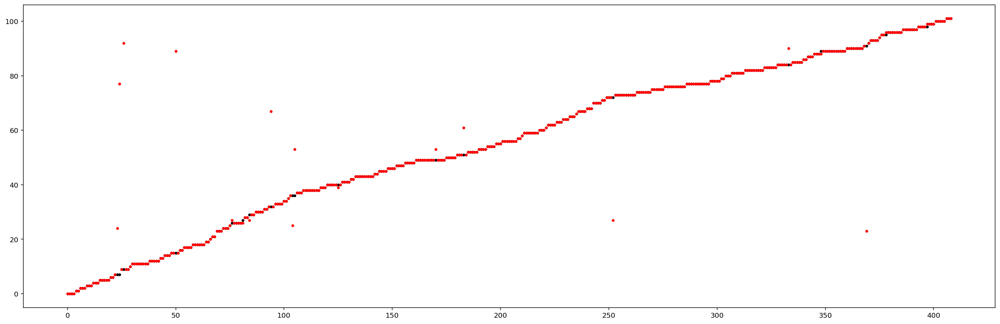

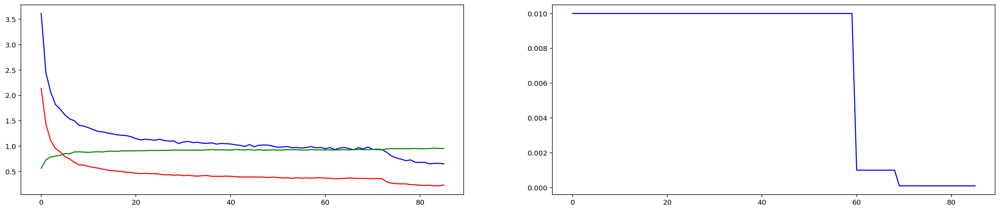

Epoch: 87:                lr: 0.00010000	               Training Loss: 0.659873	               Validation Loss: 0.221231	               Validation accuracy: 95.60%	               Elapsed time: 4175.31


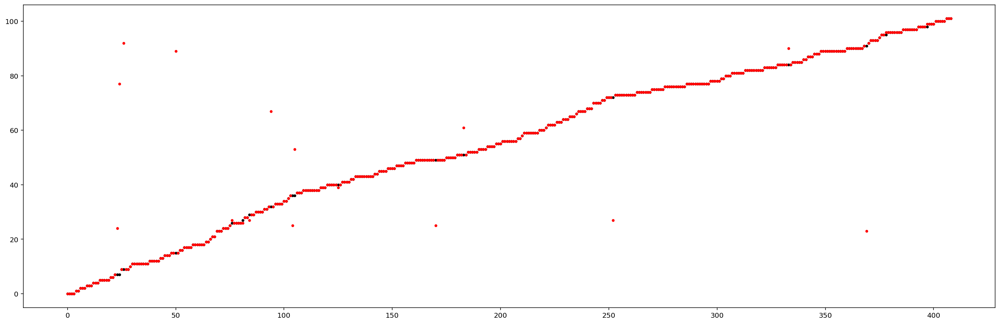

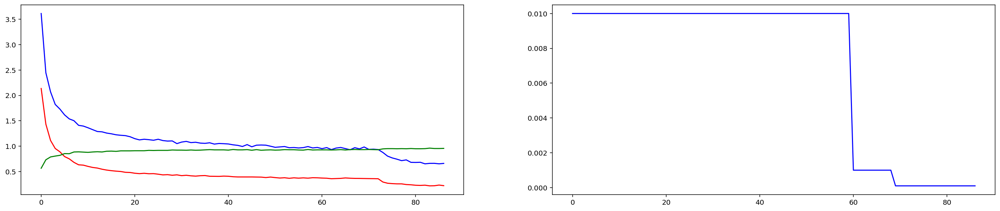

Epoch: 88:                lr: 0.00010000	               Training Loss: 0.668416	               Validation Loss: 0.219804	               Validation accuracy: 95.11%	               Elapsed time: 4226.81


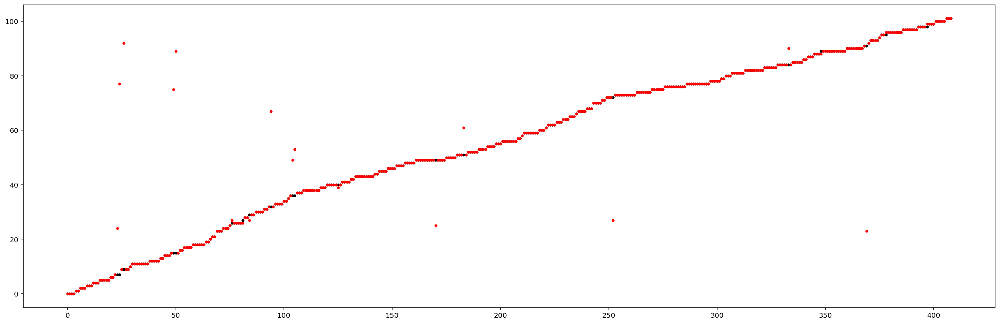

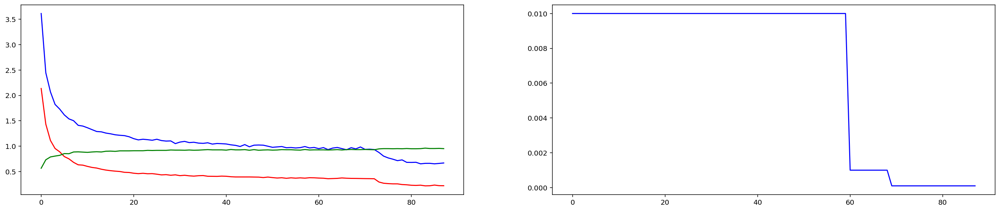

Epoch: 89:                lr: 0.00010000	               Training Loss: 0.655630	               Validation Loss: 0.216893	               Validation accuracy: 95.11%	               Elapsed time: 4276.75
Validation loss decreased:                   (0.217474 --> 0.216893).   Saving model ...


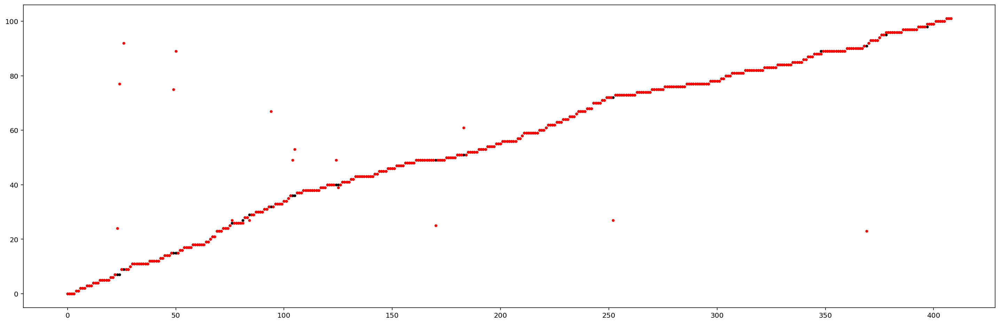

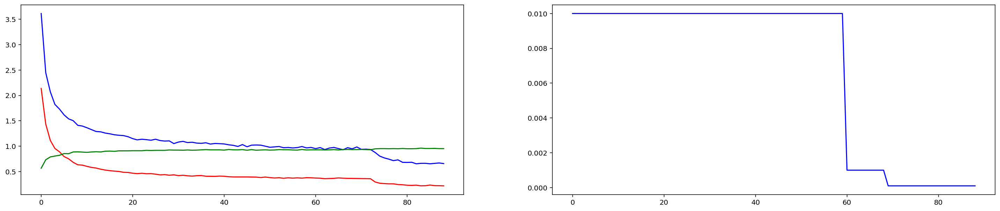

Epoch: 90:                lr: 0.00010000	               Training Loss: 0.636161	               Validation Loss: 0.212430	               Validation accuracy: 95.35%	               Elapsed time: 4326.94
Validation loss decreased:                   (0.216893 --> 0.212430).   Saving model ...


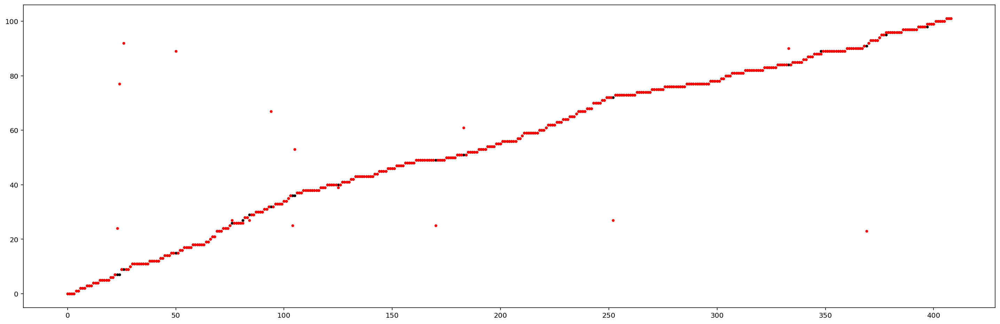

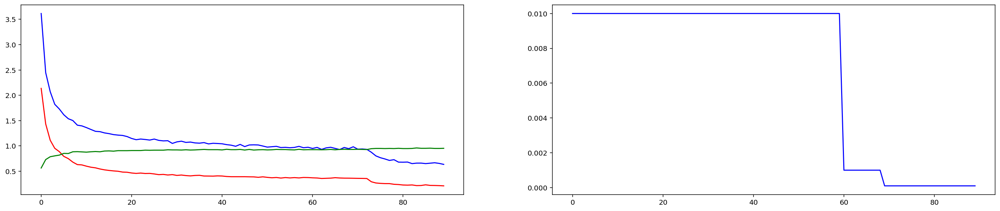

Epoch: 91:                lr: 0.00010000	               Training Loss: 0.631292	               Validation Loss: 0.213032	               Validation accuracy: 95.84%	               Elapsed time: 4376.93


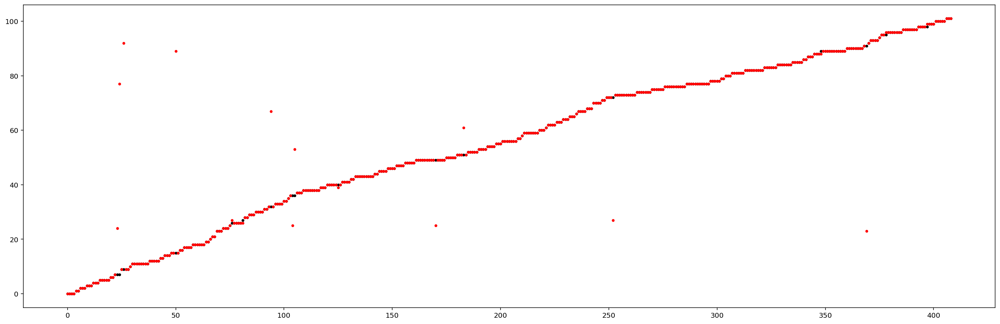

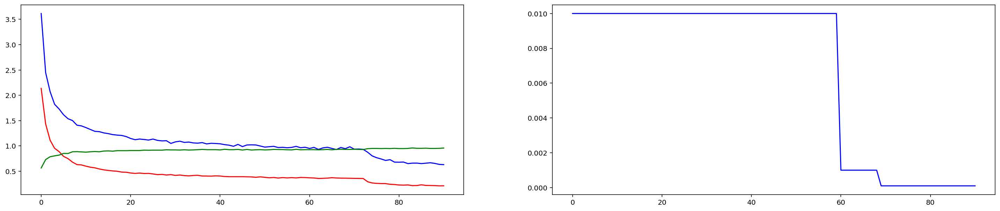

Epoch: 92:                lr: 0.00010000	               Training Loss: 0.642997	               Validation Loss: 0.209032	               Validation accuracy: 95.35%	               Elapsed time: 4426.91
Validation loss decreased:                   (0.212430 --> 0.209032).   Saving model ...


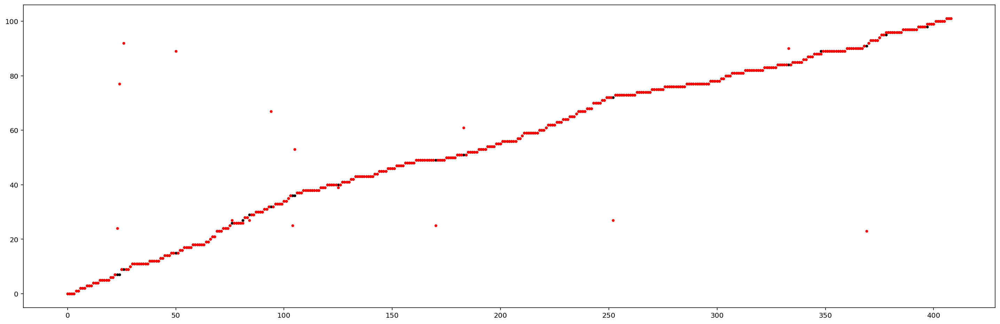

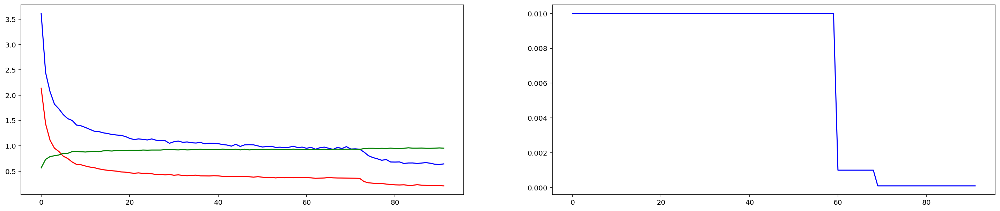

Epoch: 93:                lr: 0.00010000	               Training Loss: 0.598193	               Validation Loss: 0.209635	               Validation accuracy: 95.84%	               Elapsed time: 4477.63


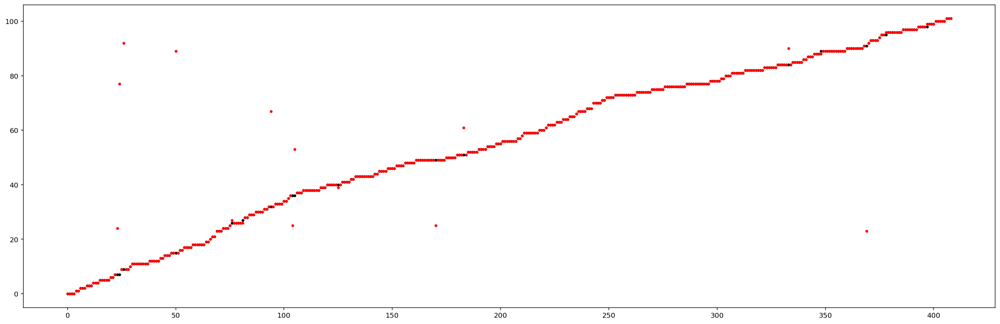

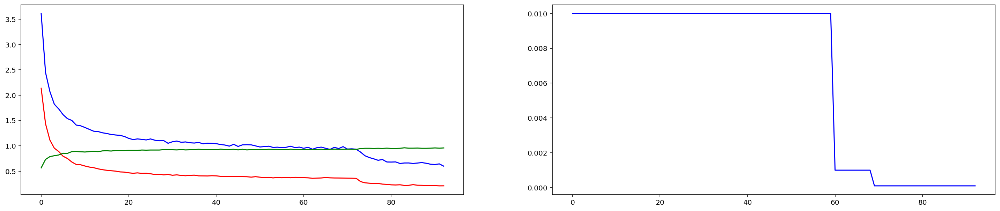

PHASE ONE
Epoch: 1:                lr: 0.01000000	               Training Loss: 3.614729	               Validation Loss: 2.137225	               Validation accuracy: 56.48%	               Elapsed time: 47.65
Epoch: 2:                lr: 0.01000000	               Training Loss: 2.447174	               Validation Loss: 1.434442	               Validation accuracy: 73.11%	               Elapsed time: 94.58
Epoch: 3:                lr: 0.01000000	               Training Loss: 2.071115	               Validation Loss: 1.112570	               Validation accuracy: 78.73%	               Elapsed time: 141.66
Epoch: 4:                lr: 0.01000000	               Training Loss: 1.822663	               Validation Loss: 0.954107	               Validation accuracy: 80.44%	               Elapsed time: 188.79
Epoch: 5:                lr: 0.01000000	               Training Loss: 1.730853	               Validation Loss: 0.888602	               Validation accuracy: 81.91%	               Elapsed time: 237.

/usr/local/lib/python3.6/dist-packages/torch/optim/lr_scheduler.py:123: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  "https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate", UserWarning)
/usr/local/lib/python3.6/dist-packages/torch/optim/lr_scheduler.py:396: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  "please use `get_last_lr()`.", UserWarning)


Epoch: 93:                lr: 0.00000100	               Training Loss: 0.603898	               Validation Loss: 0.204682	               Validation accuracy: 95.35%	               Elapsed time: 4474.95
Validation loss decreased:                   (0.212430 --> 0.204682).   Saving model ...


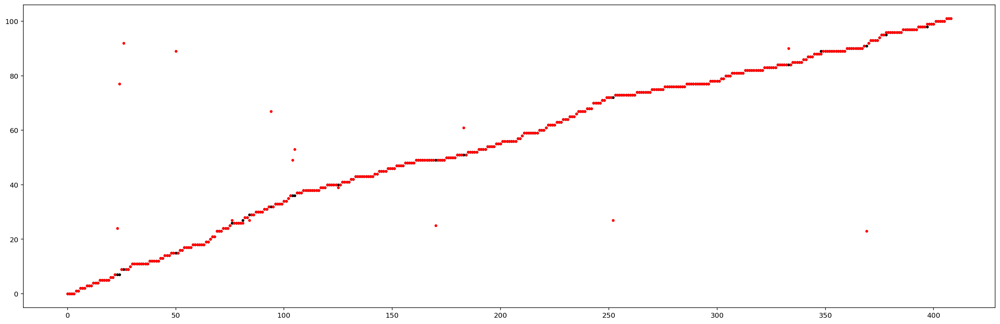

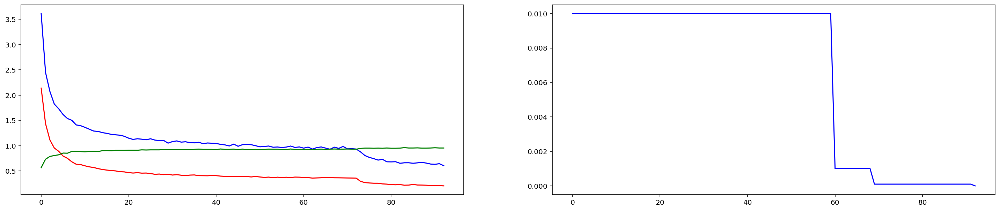

/usr/local/lib/python3.6/dist-packages/torch/optim/lr_scheduler.py:396: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  "please use `get_last_lr()`.", UserWarning)


Epoch: 94:                lr: 0.00000100	               Training Loss: 0.602966	               Validation Loss: 0.209811	               Validation accuracy: 95.35%	               Elapsed time: 4522.51


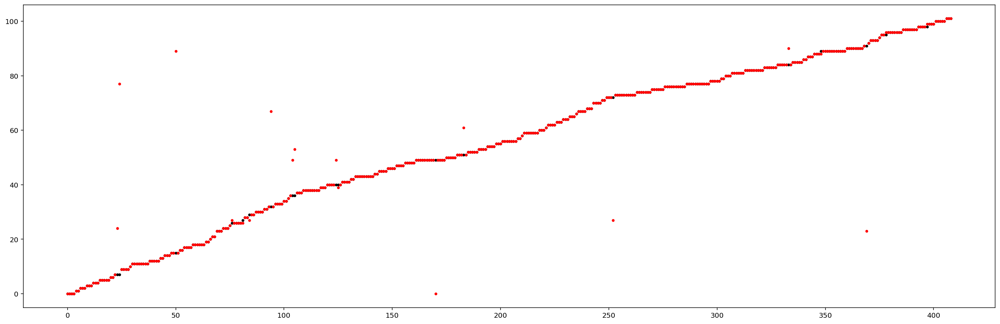

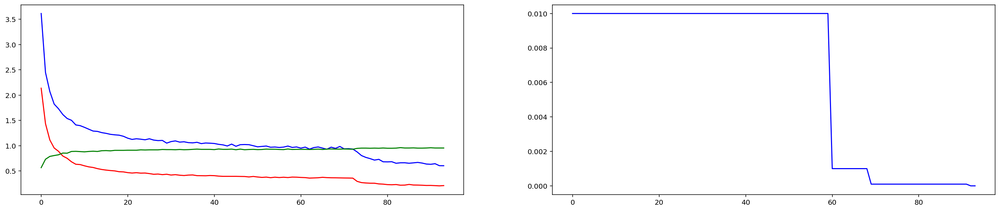

/usr/local/lib/python3.6/dist-packages/torch/optim/lr_scheduler.py:396: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  "please use `get_last_lr()`.", UserWarning)


Epoch: 95:                lr: 0.00000100	               Training Loss: 0.632845	               Validation Loss: 0.209308	               Validation accuracy: 95.84%	               Elapsed time: 4569.90


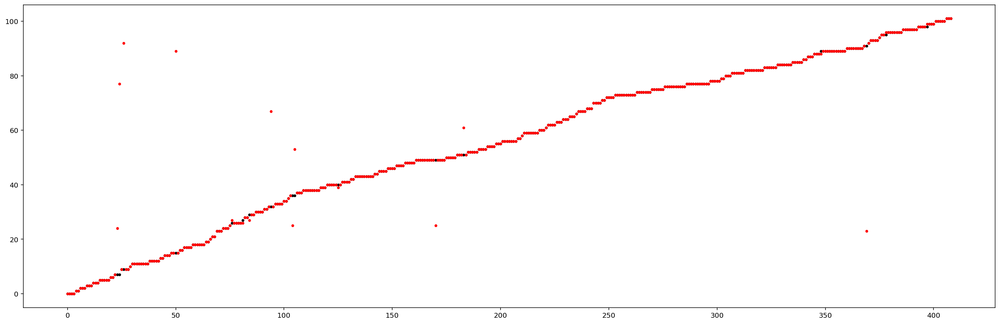

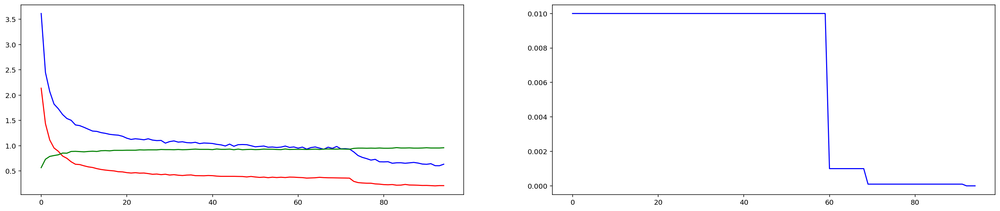

/usr/local/lib/python3.6/dist-packages/torch/optim/lr_scheduler.py:396: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  "please use `get_last_lr()`.", UserWarning)


Epoch: 96:                lr: 0.00000100	               Training Loss: 0.611142	               Validation Loss: 0.210176	               Validation accuracy: 95.60%	               Elapsed time: 4617.35


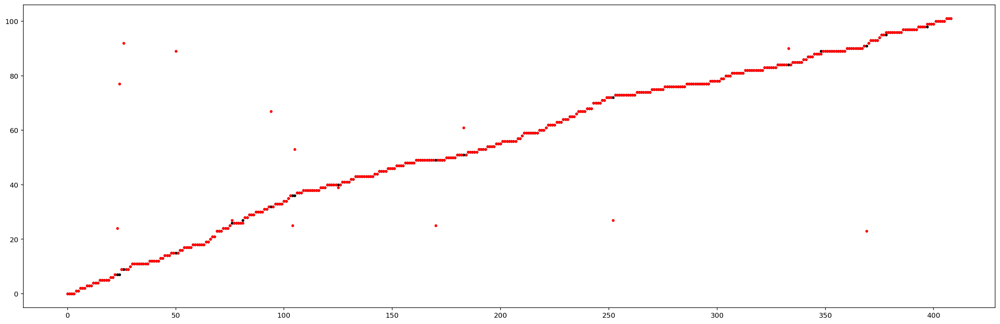

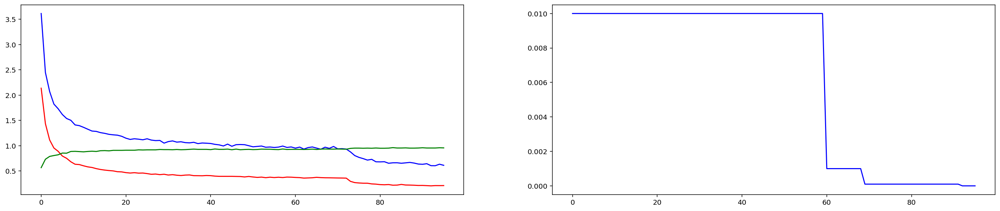

/usr/local/lib/python3.6/dist-packages/torch/optim/lr_scheduler.py:396: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  "please use `get_last_lr()`.", UserWarning)


Epoch: 97:                lr: 0.00000100	               Training Loss: 0.608339	               Validation Loss: 0.208981	               Validation accuracy: 95.60%	               Elapsed time: 4664.70


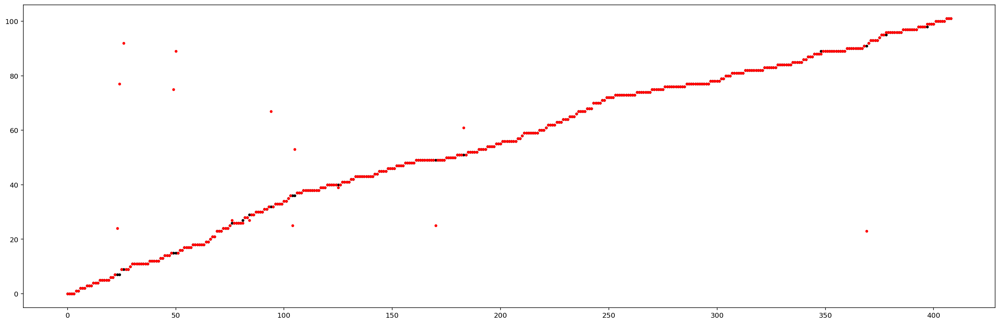

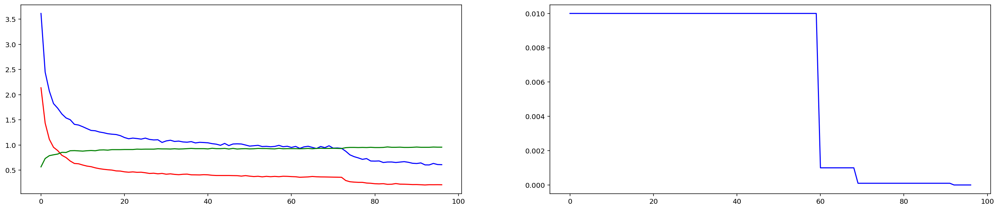

/usr/local/lib/python3.6/dist-packages/torch/optim/lr_scheduler.py:396: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  "please use `get_last_lr()`.", UserWarning)


Epoch: 98:                lr: 0.00000100	               Training Loss: 0.621404	               Validation Loss: 0.208999	               Validation accuracy: 95.11%	               Elapsed time: 4713.87


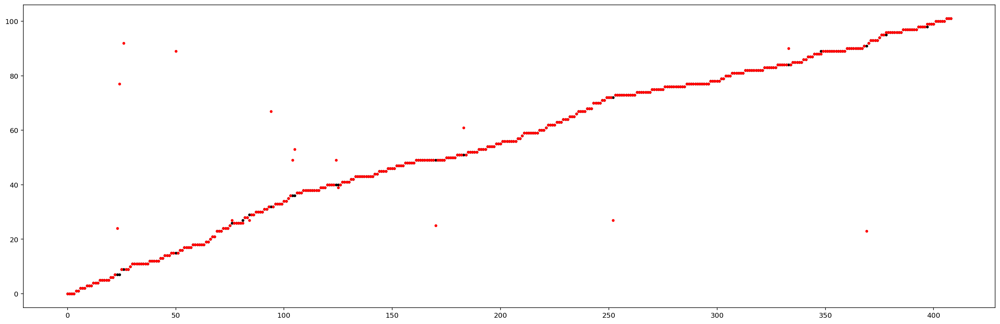

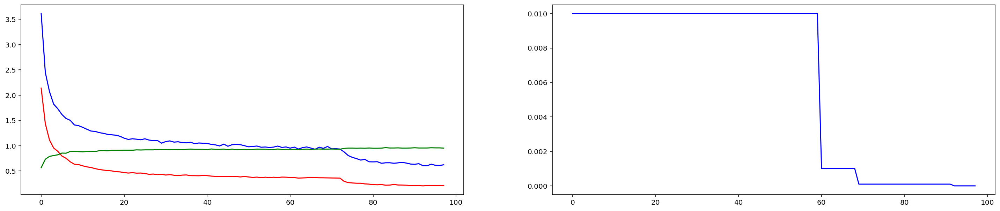

/usr/local/lib/python3.6/dist-packages/torch/optim/lr_scheduler.py:396: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  "please use `get_last_lr()`.", UserWarning)


Epoch: 99:                lr: 0.00000100	               Training Loss: 0.592984	               Validation Loss: 0.211570	               Validation accuracy: 95.35%	               Elapsed time: 4761.40


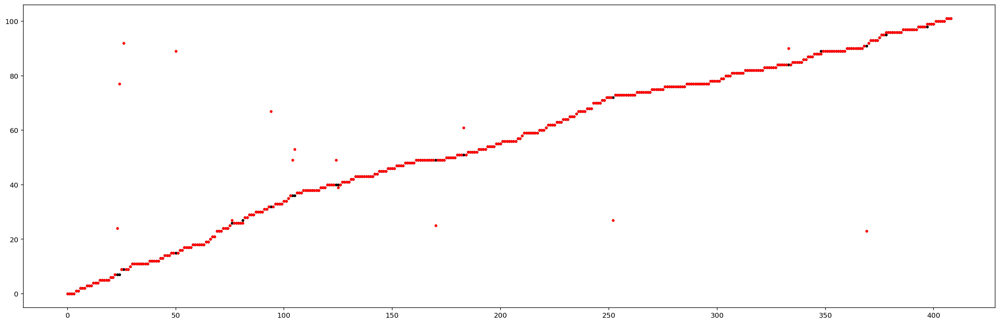

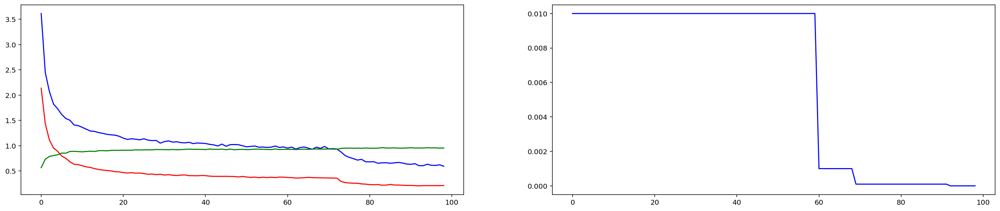

/usr/local/lib/python3.6/dist-packages/torch/optim/lr_scheduler.py:396: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  "please use `get_last_lr()`.", UserWarning)


Epoch: 100:                lr: 0.00000100	               Training Loss: 0.627212	               Validation Loss: 0.212531	               Validation accuracy: 95.60%	               Elapsed time: 4808.79


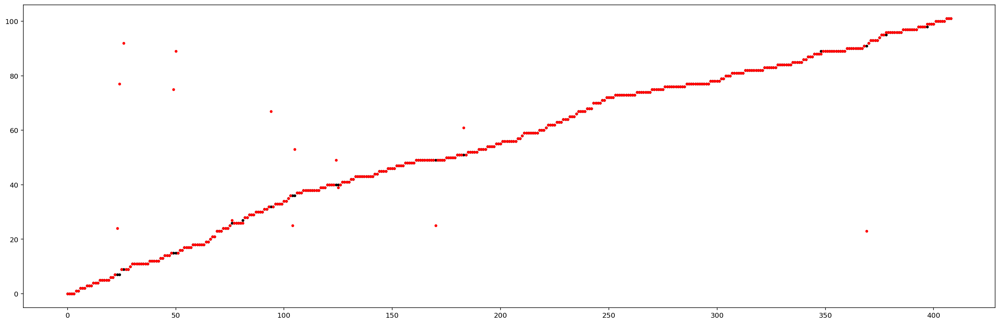

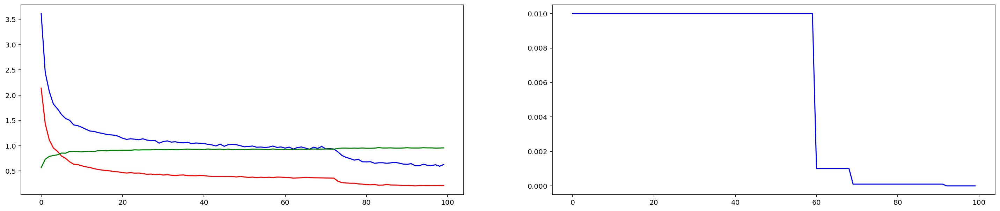

/usr/local/lib/python3.6/dist-packages/torch/optim/lr_scheduler.py:396: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  "please use `get_last_lr()`.", UserWarning)


Epoch: 101:                lr: 0.00000100	               Training Loss: 0.619250	               Validation Loss: 0.210095	               Validation accuracy: 95.35%	               Elapsed time: 4856.26


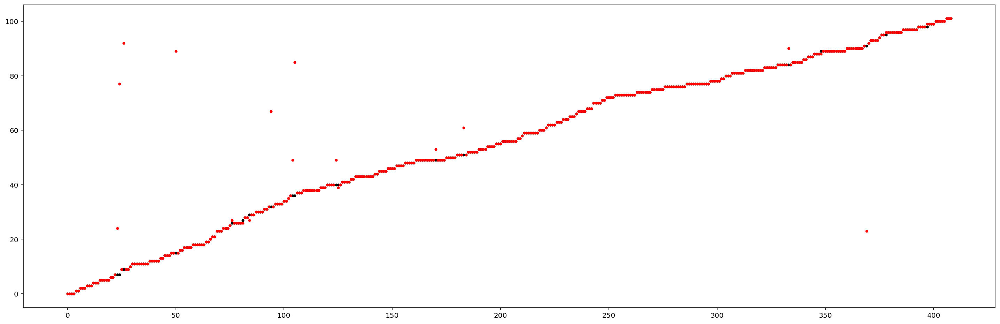

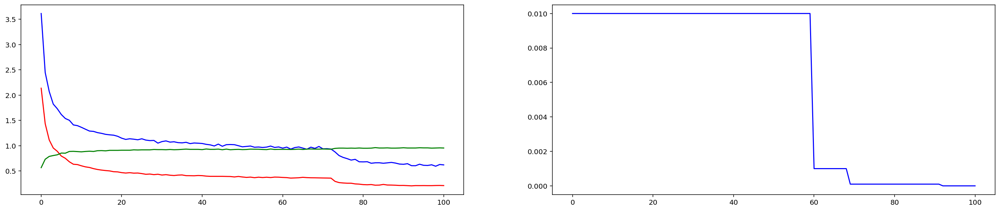

/usr/local/lib/python3.6/dist-packages/torch/optim/lr_scheduler.py:396: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  "please use `get_last_lr()`.", UserWarning)


Epoch: 102:                lr: 0.00000100	               Training Loss: 0.633107	               Validation Loss: 0.206346	               Validation accuracy: 95.11%	               Elapsed time: 4903.82


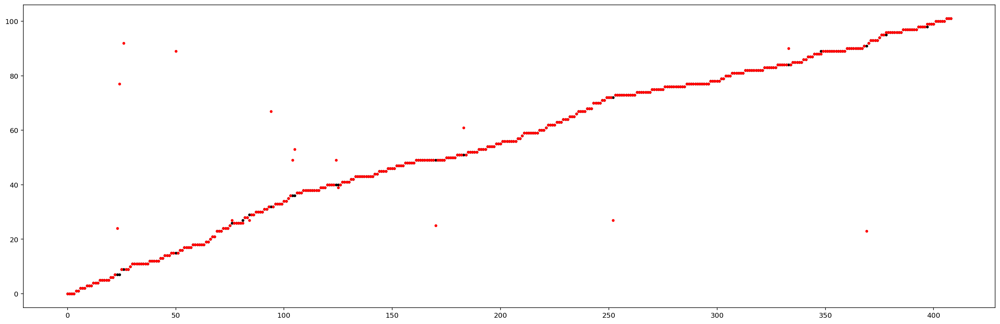

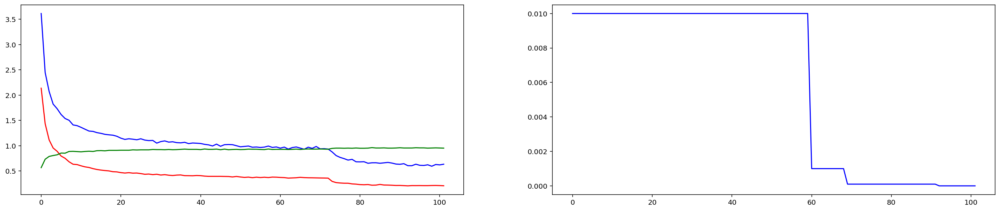

PHASE ONE
Epoch: 1:                lr: 0.01000000	               Training Loss: 3.614729	               Validation Loss: 2.137225	               Validation accuracy: 56.48%	               Elapsed time: 47.65
Epoch: 2:                lr: 0.01000000	               Training Loss: 2.447174	               Validation Loss: 1.434442	               Validation accuracy: 73.11%	               Elapsed time: 94.58
Epoch: 3:                lr: 0.01000000	               Training Loss: 2.071115	               Validation Loss: 1.112570	               Validation accuracy: 78.73%	               Elapsed time: 141.66
Epoch: 4:                lr: 0.01000000	               Training Loss: 1.822663	               Validation Loss: 0.954107	               Validation accuracy: 80.44%	               Elapsed time: 188.79
Epoch: 5:                lr: 0.01000000	               Training Loss: 1.730853	               Validation Loss: 0.888602	               Validation accuracy: 81.91%	               Elapsed time: 237.

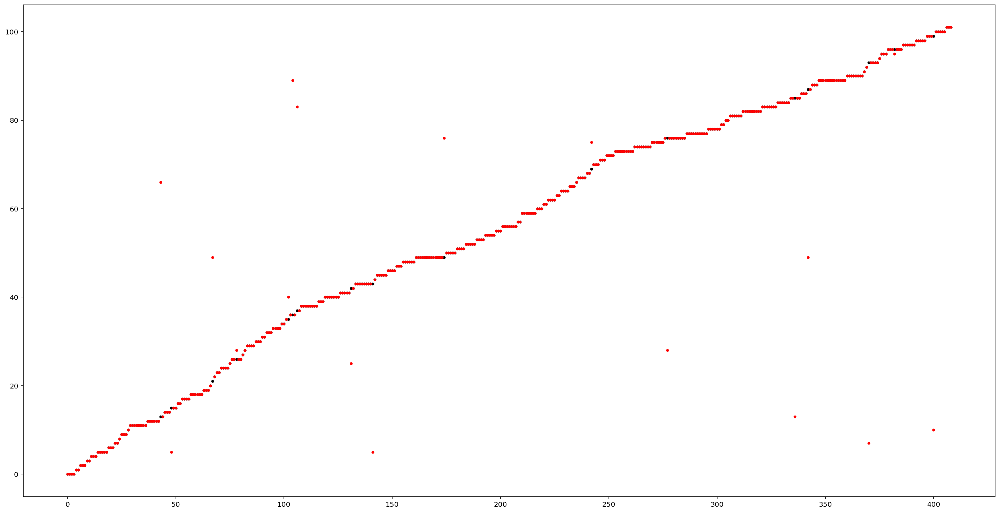

In [ ]:
# Training strategy

# Define a loss function
criterion = nn.NLLLoss() # Cross-Entropy (LogSoftmax and NLLLoss)

# Define how many times each phase will be running
PHASE_ONE = 100
PHASE_TWO = 20
PHASE_THREE = 10

TEST = True

# Define the phases
if PHASE_ONE > 0:
    freeze_parameters(model)
    freeze_parameters(model.fc, False)

    fc_optimizer = optim.Adagrad(model.fc.parameters(), lr=0.01, weight_decay=0.001)
    optimizers = [fc_optimizer]

    lr_scheduler = optim.lr_scheduler.ReduceLROnPlateau(fc_optimizer, mode='min',
                                                   factor=0.1, patience=5,
                                                   threshold=0.01, min_lr=0.00001)
                                                           
    checkpoint_path = "checkpoint_phase_one.pt"
    
    state_dict = train(PHASE_ONE, model, optimizers, lr_scheduler=lr_scheduler,
                       state_dict=None, accuracy_target=None,
                       checkpoint_path=checkpoint_path)

    print(*state_dict['trace_log'], sep="\n")
    
    state_dict = load_model(checkpoint_path, state_dict)

if PHASE_TWO > 0:
    state_dict['trace_log'].append('PHASE TWO')

    freeze_parameters(model, False)

    conv_optimizer = optim.Adagrad(model.parameters(), lr=0.0001, weight_decay=0.001)
    optimizers = [fc_optimizer, conv_optimizer]

    checkpoint_path = "checkpoint_phase_two.pt"
    
    state_dict = train(PHASE_TWO, model, optimizers, lr_scheduler=None,
                       state_dict=state_dict, accuracy_target=None,
                       checkpoint_path=checkpoint_path)

    print(*state_dict['trace_log'], sep="\n")

    state_dict = load_model(checkpoint_path, state_dict)

if PHASE_THREE > 0:
    state_dict['trace_log'].append('PHASE THREE')

    freeze_parameters(model)
    freeze_parameters(model.fc, False)

    optimizers = [fc_optimizer]
    
    lr_scheduler = optim.lr_scheduler.MultiStepLR(fc_optimizer, milestones=[0], gamma=0.01)
        
    checkpoint_path = "checkpoint_phase_three.pt"
    
    state_dict = train(PHASE_THREE, model, optimizers, lr_scheduler=lr_scheduler,
                       state_dict=state_dict, accuracy_target=None,
                       checkpoint_path=checkpoint_path)

    print(*state_dict['trace_log'], sep="\n")

    state_dict = load_model(checkpoint_path, state_dict)

if TEST:
    test_model()
    

## Save the checkpoint

Now that the nn is trained, save the model. We save as the mapping of classes to indices which you get from one of the image datasets: `image_datasets['train'].class_to_idx`.

```model.class_to_idx = image_datasets['train'].class_to_idx```



In [ ]:
# Save the checkpoint 
def save_checkpoint(checkpoint_path='checkpoint.pt'):
    model.to('cpu')
    checkpoint = {'model_name': model_name,
                  'output_size': output_size,
                  'hidden_layers': hidden_layers,
                  'model_state_dict': model.state_dict(),
                  'class_to_idx': class_to_idx,
                  'cat_label_to_name': cat_label_to_name}

    torch.save(checkpoint, checkpoint_path)

In [ ]:
save_checkpoint('checkpoint.pt')

## Loading the checkpoint


In [ ]:
# Write a function that loads a checkpoint and rebuilds the model
def load_checkpoint(checkpoint_path='checkpoint.pt'):
    checkpoint = torch.load(checkpoint_path)

    model_name = checkpoint['model_name']
    output_size = checkpoint['output_size']
    hidden_layers = checkpoint['hidden_layers']
    
    model = create_network(model_name=model_name,
                         output_size=output_size, hidden_layers=hidden_layers)
   
    model.load_state_dict(checkpoint['model_state_dict'])
    model.class_to_idx = checkpoint['class_to_idx']
    model.cat_label_to_name = checkpoint['cat_label_to_name']
    
    return model

Test Loss: 0.179242	           Test accuracy: 95.84%


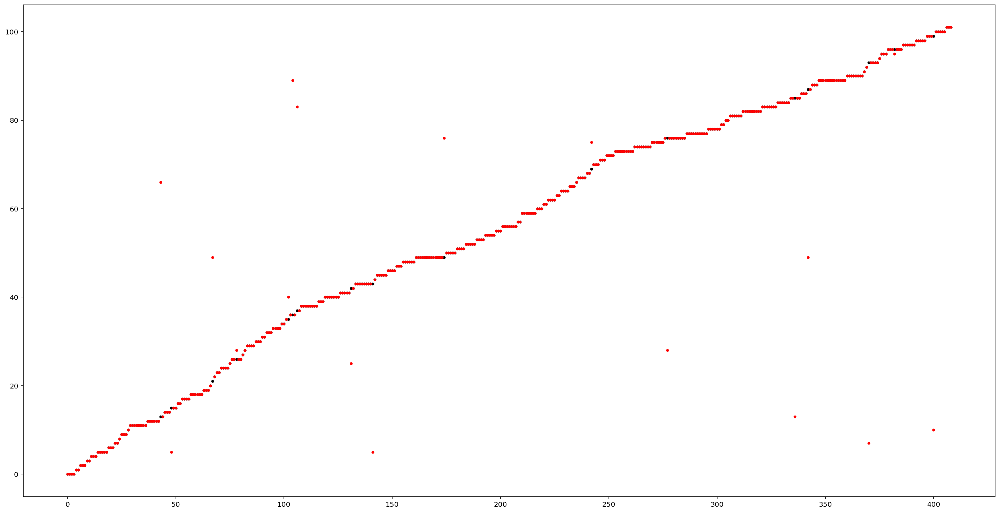

In [ ]:
model = load_checkpoint('checkpoint.pt')

model.to(device)

test_model(show_graphs=True)

In [ ]:
#Trace and save the model for use with TorchVision on Android
my = load_checkpoint('checkpoint.pt')
my = my.to("cuda")
my.eval()
input_tensor = torch.rand(1,3,224,224)

input_tensor = input_tensor.to(device = 'cuda')

script_model = torch.jit.trace(my,input_tensor)
script_model = script_model.to('cpu')
script_model.save("flower_finder_resnet18_traced.pt")

from google.colab import files
down = files.download("flower_finder_resnet18_traced.pt")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Inference for classification

Now you'll write a function to use a trained network for inference. That is, you'll pass an image into the network and predict the class of the flower in the image. Write a function called `predict` that takes an image and a model, then returns the top $K$ most likely classes along with the probabilities. It should look like 

```python
probs, classes = predict(image_path, model)
print(probs)
print(classes)
> [ 0.01558163  0.01541934  0.01452626  0.01443549  0.01407339]
> ['70', '3', '45', '62', '55']
```

First you'll need to handle processing the input image such that it can be used in your network. 

## Image Preprocessing

You'll want to use `PIL` to load the image ([documentation](https://pillow.readthedocs.io/en/latest/reference/Image.html)). It's best to write a function that preprocesses the image so it can be used as input for the model. This function should process the images in the same manner used for training. 

First, resize the images where the shortest side is 256 pixels, keeping the aspect ratio. This can be done with the [`thumbnail`](http://pillow.readthedocs.io/en/3.1.x/reference/Image.html#PIL.Image.Image.thumbnail) or [`resize`](http://pillow.readthedocs.io/en/3.1.x/reference/Image.html#PIL.Image.Image.thumbnail) methods. Then you'll need to crop out the center 224x224 portion of the image.

Color channels of images are typically encoded as integers 0-255, but the model expected floats 0-1. You'll need to convert the values. It's easiest with a Numpy array, which you can get from a PIL image like so `np_image = np.array(pil_image)`.

As before, the network expects the images to be normalized in a specific way. For the means, it's `[0.485, 0.456, 0.406]` and for the standard deviations `[0.229, 0.224, 0.225]`. You'll want to subtract the means from each color channel, then divide by the standard deviation. 

And finally, PyTorch expects the color channel to be the first dimension but it's the third dimension in the PIL image and Numpy array. You can reorder dimensions using [`ndarray.transpose`](https://docs.scipy.org/doc/numpy-1.13.0/reference/generated/numpy.ndarray.transpose.html). The color channel needs to be first and retain the order of the other two dimensions.

In [ ]:
def process_image(image):
    ''' Scales, crops, and normalizes a PIL image for a PyTorch model,
        returns an Numpy array
    '''
    
    # Process a PIL image for use in a PyTorch model
    image = TF.resize(image, 256)
    
    upper_pixel = (image.height - 224) // 2
    left_pixel = (image.width - 224) // 2
    image = TF.crop(image, upper_pixel, left_pixel, 224, 224)
    
    image = TF.to_tensor(image)
    image = TF.normalize(image, normalize_mean, normalize_std)
    
    return image

To check your work, the function below converts a PyTorch tensor and displays it in the notebook. If your `process_image` function works, running the output through this function should return the original image (except for the cropped out portions).

In [ ]:
def imshow(image, ax=None, title=None, titlecolor='k'):
    """Imshow for Tensor."""
    if ax is None:
        fig, ax = plt.subplots()
    
    # PyTorch tensors assume the color channel is the first dimension
    # but matplotlib assumes is the third dimension
    image = image.numpy().transpose((1, 2, 0))
    
    # Undo preprocessing
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image = std * image + mean
    
    # Image needs to be clipped between 0 and 1 or it looks like noise when displayed
    image = np.clip(image, 0, 1)
    
    ax.imshow(image)
    ax.grid(False)
    if title:
        ax.set_title(title, color=titlecolor)
    
    return ax

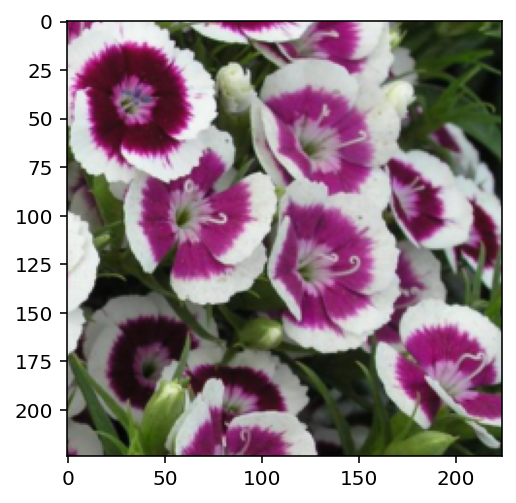

In [ ]:
category = 30
image_name = 'image_03475.jpg'
image_path = data_dir + f'/valid/{category}/{image_name}'

image = Image.open(image_path)
image = process_image(image)
imshow(image)

## Class Prediction

Once you can get images in the correct format, it's time to write a function for making predictions with your model. A common practice is to predict the top 5 or so (usually called top-$K$) most probable classes. You'll want to calculate the class probabilities then find the $K$ largest values.

To get the top $K$ largest values in a tensor use [`x.topk(k)`](http://pytorch.org/docs/master/torch.html#torch.topk). This method returns both the highest `k` probabilities and the indices of those probabilities corresponding to the classes. You need to convert from these indices to the actual class labels using `class_to_idx` which hopefully you added to the model or from an `ImageFolder` you used to load the data ([see here](#Save-the-checkpoint)). Make sure to invert the dictionary so you get a mapping from index to class as well.

Again, this method should take a path to an image and a model checkpoint, then return the probabilities and classes.

```python
probs, classes = predict(image_path, model)
print(probs)
print(classes)
> [ 0.01558163  0.01541934  0.01452626  0.01443549  0.01407339]
> ['70', '3', '45', '62', '55']
```

In [ ]:
def predict(image_path, model, topk=5):
    ''' Predict the class (or classes) of an image using a trained deep learning model.
    '''
    
    # Implement the code to predict the class from an image file
    image = Image.open(image_path)
    image = process_image(image)
    
    with torch.no_grad():
        model.eval()
        
        image = image.view(1,3,224,224)
        image = image.to(device)
        
        predictions = model.forward(image)
        
        predictions = torch.exp(predictions)
        top_ps, top_class = predictions.topk(topk, dim=1)
    
    return top_ps, top_class

In [ ]:
probs, classes = predict(image_path, model)
print(probs)
print(classes)

tensor([[9.9802e-01, 6.4940e-04, 6.3802e-04, 1.6783e-04, 1.3210e-04]],
       device='cuda:0')
tensor([[26, 28, 49, 83, 27]], device='cuda:0')


## Sanity Checking

Now that you can use a trained model for predictions, check to make sure it makes sense. Even if the validation accuracy is high, it's always good to check that there aren't obvious bugs. Use `matplotlib` to plot the probabilities for the top 5 classes as a bar graph, along with the input image. It should look like this:

<img src='https://github.com/silviomori/udacity_deep_learning_pytorch_challenge/blob/master/assets/inference_example.png?raw=1' width=300px>

You can convert from the class integer encoding to actual flower names with the `cat_to_name.json` file (should have been loaded earlier in the notebook). To show a PyTorch tensor as an image, use the `imshow` function defined above.

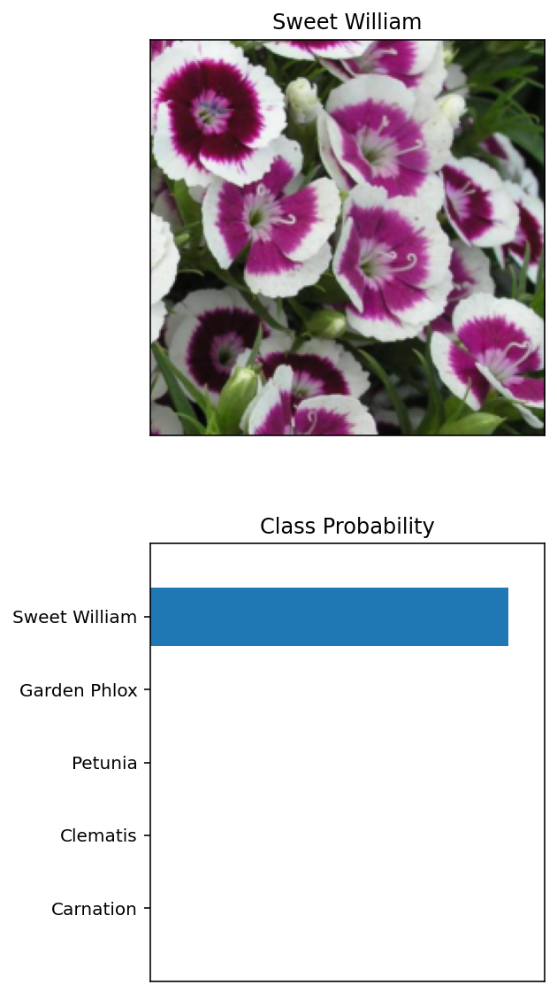

In [ ]:
# Display an image along with the top 5 classes
probs, classes = predict(image_path, model)

probs = probs.data.cpu()
probs = probs.numpy().squeeze()

classes = classes.data.cpu()
classes = classes.numpy().squeeze()
classes = [cat_label_to_name[clazz].title() for clazz in classes]

label = class_to_idx[str(category)]
title = f'{cat_label_to_name[label].title()}'

fig = plt.figure(figsize=(4, 10))

ax1 = fig.add_subplot(2, 1, 1, xticks=[], yticks=[])

image = Image.open(image_path)
image = process_image(image)
imshow(image, ax1, title)

ax2 = fig.add_subplot(2, 1, 2, xticks=[], yticks=[])
ax2.barh(np.arange(5), probs)
ax2.set_yticks(np.arange(5))
ax2.set_yticklabels(classes)
ax2.set_ylim(-1, 5)
ax2.invert_yaxis()
ax2.set_xlim(0, 1.1)
ax2.set_title('Class Probability')

plt.show()

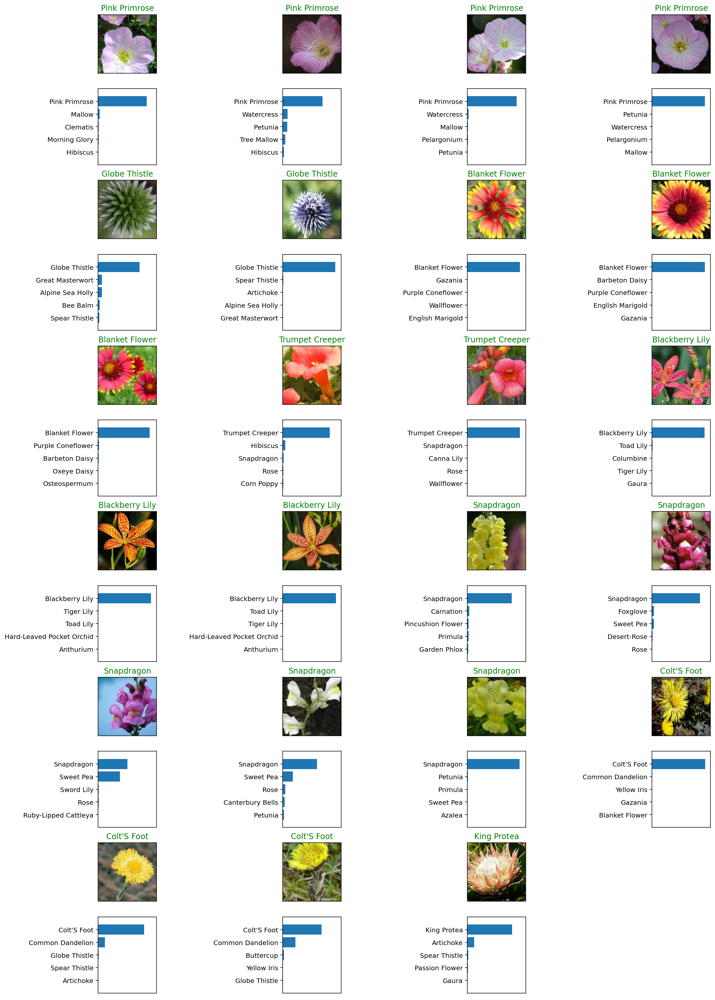

In [ ]:
model.eval()
with torch.no_grad():
    for images, labels in dataloaders['test_data']:

        # Move tensors to device
        images, labels = images.to(device), labels.to(device)

        # Get predictions for this test batch
        output = model(images)

        output = torch.exp(output)
        probs, classes = output.topk(5, dim=1)
        
        # Display an image along with the top 5 classes
        
        images = images.cpu()
        probs = probs.data.cpu()
        classes = classes.data.cpu()
        fig = plt.figure(figsize=(15, 28),
                 tight_layout={'pad':0, 'w_pad':5, 'h_pad':0, 'rect':(0,0,1,1)})
        rows = 4
        lines = 16
        line_ctrl = 0
        for index in range(len(images)):
            if index % rows == 0:
                line_ctrl += 1

            prob = probs[index].squeeze()
            
            clazz = [cat_label_to_name[c.item()].title() for c in classes[index]]

            label = labels[index].item()
            title = f'{cat_label_to_name[label].title()}'

            position = index + 1 + (line_ctrl * rows)
            ax1 = fig.add_subplot(lines, rows, position, xticks=[], yticks=[])
            titlecolor = 'g'
            if title != clazz[0]:
                titlecolor = 'r'

            imshow(images[index], ax1, title, titlecolor=titlecolor)

            ax2 = fig.add_subplot(lines, rows, position+rows, xticks=[], yticks=[])
            ax2.barh(np.arange(5), prob)
            ax2.set_yticks(np.arange(5))
            ax2.set_yticklabels(clazz)
            ax2.set_ylim(-1, 5)
            ax2.invert_yaxis()
            ax2.set_xlim(0, 1.1)

        break
        plt.show()
